# Organizacion de Datos - Trabajo Practico N°1

## 1. Analisis Exploratorio y Preprocesamiento de Datos

#### Drive

Primero, cargamos el archivo csv en forma de dataframe para poder empezar a trabajar con los datos.

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


#### Lectura de CSV

In [2]:
import pandas as pd

properati = pd.read_csv('/content/drive/MyDrive/Colab Notebooks/properati_argentina_2021.csv')
print(properati.shape)
properati.head()

(460154, 20)


,id,start_date,end_date,created_on,latitud,longitud,place_l2,place_l3,place_l4,place_l5,place_l6,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_currency,property_title
0,XZq2dFGxBiboHY3Bo/tqlw==,2021-09-09,2022-01-27,2021-09-09,-38.957632,-68.105443,Neuquén,NaN,NaN,NaN,NaN,Venta,Casa,6.0,NaN,NaN,206.0,NaN,NaN,Casa - Capital
1,8afoK+yMH/rnnlYiktwgNA==,2021-09-09,2021-10-23,2021-09-09,-34.888878,-56.092368,Montevideo,NaN,NaN,NaN,NaN,Venta,Casa,4.0,3.0,193.0,193.0,390000.0,USD,Casa - Malvín
2,iVaG5rBB47dd1Ya4BMXREA==,2021-09-09,2022-03-09,2021-09-09,-32.488717,-58.257499,Entre Ríos,NaN,NaN,NaN,NaN,Venta,Casa,NaN,NaN,110.0,45.0,47000.0,USD,Casa - Uruguay
3,QE1QVMWKAHWkd0qT0FtPWA==,2021-09-09,2022-01-27,2021-09-09,-34.900165,-54.808453,Maldonado,NaN,NaN,NaN,NaN,Venta,Casa,NaN,3.0,NaN,180.0,400000.0,USD,Casa - El Chorro
4,tJ5lSk7IysG/71OGhacNZA==,2021-09-09,2022-01-27,2021-09-09,-38.954528,-68.041862,Neuquén,NaN,NaN,NaN,NaN,Venta,PH,3.0,2.0,NaN,98.0,102000.0,USD,PH - Villa Farrell


In [3]:
properati.columns

Index(['id', 'start_date', 'end_date', 'created_on', 'latitud', 'longitud',
       'place_l2', 'place_l3', 'place_l4', 'place_l5', 'place_l6', 'operation',
       'property_type', 'property_rooms', 'property_bedrooms',
       'property_surface_total', 'property_surface_covered', 'property_price',
       'property_currency', 'property_title'],
      dtype='object')

#### Filtrado Inicial

Ahora, como solo nos interesan propiedades con ciertos criterios filtramos tipo de vivienda ( Casa, PH y Departamento ) ubicados
en Capital Federal cuyo tipo de operación sea venta y su precio se encuentre en dólares (USD).

In [4]:
# Filtrar por tipo de propiedad (Casa, PH y Departamento) y ubicación en Capital Federal
properati_filtrado = properati[(properati['property_type'].isin(['Casa', 'PH', 'Departamento'])) & (properati['place_l2'] == 'Capital Federal')]

# Filtrar por tipo de operación sea venta y precio en dólares (USD)
properati_filtrado = properati_filtrado[(properati_filtrado['operation'] == 'Venta') & (properati_filtrado['property_currency'] == 'USD')]

properati_filtrado.to_csv("properati_filtrado.csv")

print(properati_filtrado.shape)
properati_filtrado.head()

(94249, 20)


,id,start_date,end_date,created_on,latitud,longitud,place_l2,place_l3,place_l4,place_l5,place_l6,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_currency,property_title
25,CyZu6IaZgmQYGk8jmPajCg==,2021-09-09,2021-09-26,2021-09-09,NaN,NaN,Capital Federal,NaN,NaN,NaN,NaN,Venta,Casa,4.0,3.0,171.0,133.0,210000.0,USD,VENTA CASA LLAVE EN MANO - COSTA ESMERALDA
42,d3Z0MblSb2IMBoOBMGJEEQ==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,Capital Federal,Boca,NaN,NaN,NaN,Venta,Departamento,3.0,2.0,58.0,55.0,82900.0,USD,VENTA TRES AMBIENTES LA BOCA PISO ALTO
43,rL7qPkQnomsMGu2ViS3sBw==,2021-09-09,2021-09-28,2021-09-09,-34.628647,-58.361871,Capital Federal,Boca,NaN,NaN,NaN,Venta,Departamento,4.0,3.0,70.0,70.0,99000.0,USD,Departamento - 4 Ambientes - Catalinas Sur
49,vuX/ccLAMVml4qWRFcOJUA==,2021-09-09,2022-01-05,2021-09-09,-34.610027,-58.401934,Capital Federal,Once,NaN,NaN,NaN,Venta,Departamento,4.0,2.0,NaN,104.0,146000.0,USD,Venta departamento 4 ambientes Once
51,ZTtSCeqZ3HUgf5jjwEzRcw==,2021-09-09,2022-03-09,2021-09-09,-34.631621,-58.416825,Capital Federal,Boedo,NaN,NaN,NaN,Venta,PH,4.0,2.0,NaN,73.0,250000.0,USD,PH - Boedo


#### Train

lo hacemos en la parte 3

In [5]:
print(properati_filtrado['property_price'].values)

[210000.  82900.  99000. ...  75500.  74500. 135000.]


#### a) Exploración Inicial : analizar cada variable, considerando los siguientes aspectos


*   Variables Cuantitativas: calcular medidas de resumen: media, mediana,moda,etc
*   Variables Cualitativas: mostrar cantidad de valores posibles, y frecuencias de cada uno.
*   Determinar variables irrelevantes en el análisis
*   Realizar un análisis gráfico de las distribuciones de las variables más relevantes
*   Analizar las correlaciones existentes entre las variables.

##### **Varaibles Cuantitativas**

###### **Latitud**

In [6]:
# el id no me parece que haya que analizarlo, ya que es unico para cada propiedad
#start_date, end_date, created_on )?

#latitud
media_lat = properati_filtrado['latitud'].mean()
mediana_lat = properati_filtrado['latitud'].median()
moda_lat = properati_filtrado['latitud'].mode()
cuartiles_lat = properati_filtrado['latitud'].quantile([0.25, 0.5, 0.75])

Q1_lat = cuartiles_lat[0.25]
Q3_lat = cuartiles_lat[0.75]
IQR_lat = Q3_lat - Q1_lat

print(media_lat)
print(mediana_lat)
print(moda_lat)
print(Q1_lat)
print(cuartiles_lat[0.5])
print(Q3_lat)
print(IQR_lat)

-34.59148102467374
-34.5957896
0   -34.54125
Name: latitud, dtype: float64
-34.6159754
-34.5957896
-34.5774132
0.03856220000000121


###### **Longitud**

In [7]:
#longitud
media_long = properati_filtrado['longitud'].mean()
mediana_long = properati_filtrado['longitud'].median()
moda_long = properati_filtrado['longitud'].mode()
cuartiles_long = properati_filtrado['longitud'].quantile([0.25, 0.5, 0.75])

Q1_long = cuartiles_long[0.25]
Q3_long = cuartiles_long[0.75]
IQR_long = Q3_long - Q1_long

print(media_long)
print(mediana_long)
print(moda_long)
print(Q1_long)
print(cuartiles_long[0.5])
print(Q3_long)
print(IQR_long)

-58.449794544855415
-58.4390004
0   -58.472966
Name: longitud, dtype: float64
-58.4665217
-58.4390004
-58.4088623
0.057659399999998584


###### **Rooms**

In [8]:
#'place_l2', 'place_l3', 'place_l4', 'place_l5', 'place_l6', 'operation','property_type'---> no son numeros
#property_rooms
media_rooms = properati_filtrado['property_rooms'].mean()
mediana_rooms = properati_filtrado['property_rooms'].median()
moda_rooms = properati_filtrado['property_rooms'].mode()
cuartiles_rooms = properati_filtrado['property_rooms'].quantile([0.25, 0.5, 0.75])

Q1_rooms = cuartiles_rooms[0.25]
Q3_rooms = cuartiles_rooms[0.75]
IQR_rooms = Q3_rooms - Q1_rooms

print(media_rooms)
print(mediana_rooms)
print(moda_rooms)
print(Q1_rooms)
print(cuartiles_rooms[0.5])
print(Q3_rooms)
print(IQR_rooms)

2.8227992060511777
3.0
0    3.0
Name: property_rooms, dtype: float64
2.0
3.0
4.0
2.0


###### **Bedrooms**

In [9]:
#propery_bedrooms
media_bedrooms = properati_filtrado['property_bedrooms'].mean()
mediana_bedrooms = properati_filtrado['property_bedrooms'].median()
moda_bedrooms = properati_filtrado['property_bedrooms'].mode()
cuartiles_bedrooms = properati_filtrado['property_bedrooms'].quantile([0.25, 0.5, 0.75])

Q1_bedrooms = cuartiles_bedrooms[0.25]
Q3_bedrooms = cuartiles_bedrooms[0.75]
IQR_bedrooms = Q3_bedrooms - Q1_bedrooms

print(media_bedrooms)
print(mediana_bedrooms)
print(moda_bedrooms)
print(Q1_bedrooms)
print(cuartiles_bedrooms[0.5])
print(Q3_bedrooms)
print(IQR_bedrooms)

2.0146285220148448
2.0
0    1.0
Name: property_bedrooms, dtype: float64
1.0
2.0
3.0
2.0


###### **Propery Surface Total**

In [10]:
#property_surface_total
media_surface_total = properati_filtrado['property_surface_total'].mean()
mediana_surface_total = properati_filtrado['property_surface_total'].median()
moda_surface_total = properati_filtrado['property_surface_total'].mode()
cuartiles_surface_total = properati_filtrado['property_surface_total'].quantile([0.25, 0.5, 0.75])

Q1_surface_total = cuartiles_surface_total[0.25]
Q3_surface_total = cuartiles_surface_total[0.75]
IQR_surface_total = Q3_surface_total - Q1_surface_total

print(media_surface_total)
print(mediana_surface_total)
print(moda_surface_total)
print(Q1_surface_total)
print(cuartiles_surface_total[0.5])
print(Q3_surface_total)
print(IQR_surface_total)

109.09297019182372
65.0
0    50.0
Name: property_surface_total, dtype: float64
45.0
65.0
105.0
60.0


###### **Surface Covered**

In [11]:
#property_surface_covered
media_surface_covered = properati_filtrado['property_surface_covered'].mean()
mediana_surface_covered = properati_filtrado['property_surface_covered'].median()
moda_surface_covered = properati_filtrado['property_surface_covered'].mode()
cuartiles_surface_covered = properati_filtrado['property_surface_covered'].quantile([0.25, 0.5, 0.75])

Q1_surface_covered = cuartiles_surface_covered[0.25]
Q3_surface_covered = cuartiles_surface_covered[0.75]
IQR_surface_covered = Q3_surface_covered - Q1_surface_covered

print(media_surface_covered)
print(mediana_surface_covered)
print(moda_surface_covered)
print(Q1_surface_covered)
print(cuartiles_surface_covered[0.5])
print(Q3_surface_covered)
print(IQR_surface_covered)

87.93193244952968
58.0
0    40.0
Name: property_surface_covered, dtype: float64
40.0
58.0
88.0
48.0


###### **Price**

In [12]:
#property_price
media_price = properati_filtrado['property_price'].mean()
mediana_price = properati_filtrado['property_price'].median()
moda_price = properati_filtrado['property_price'].mode()
cuartiles_price = properati_filtrado['property_price'].quantile([0.25, 0.5, 0.75])

Q1_price = cuartiles_price[0.25]
Q3_price= cuartiles_price[0.75]
IQR_price = Q3_price - Q1_price

print(media_price)
print(mediana_price)
print(moda_price)
print(Q1_price)
print(cuartiles_price[0.5])
print(Q3_price)
print(IQR_price)

#'property_currency' y 'property_title' ---> no son numeros

226238.20718522213
143900.0
0    110000.0
Name: property_price, dtype: float64
95000.0
143900.0
237000.0
142000.0


##### **Variables Cualitativas**

###### **Latitud**

In [13]:
#latitud
cant_valores_lat = properati_filtrado['latitud'].nunique()
frecuencias_lat = properati_filtrado['latitud'].value_counts()

print("Cant valores posibles:", cant_valores_lat)
print("Frecuencias de cada valor", frecuencias_lat)

Cant valores posibles: 45351
Frecuencias de cada valor latitud
-34.541250    150
-34.619406    121
-34.604538    116
-34.541616    106
-34.581910     97
             ... 
-34.612044      1
-34.599334      1
-34.645573      1
-34.570205      1
-34.591818      1
Name: count, Length: 45351, dtype: int64


###### **Longitud**

In [14]:
#longitud
cant_valores_long = properati_filtrado['longitud'].nunique()
frecuencias_long = properati_filtrado['longitud'].value_counts()

print("Cant valores posibles:", cant_valores_long)
print("Frecuencias de cada valor", frecuencias_long)

Cant valores posibles: 45142
Frecuencias de cada valor longitud
-58.472966    150
-58.451999    121
-58.424956    116
-58.473377    106
-58.449381     97
             ... 
-58.487835      1
-58.443465      1
-58.361111      1
-58.359874      1
-58.482814      1
Name: count, Length: 45142, dtype: int64


###### **Rooms**

In [15]:
#property_rooms
cant_valores_rooms = properati_filtrado['property_rooms'].nunique()
frecuencias_rooms = properati_filtrado['property_rooms'].value_counts()

print("Cant valores posibles:", cant_valores_rooms)
print("Frecuencias de cada valor", frecuencias_rooms)

Cant valores posibles: 27
Frecuencias de cada valor property_rooms
3.0     26714
2.0     26496
4.0     16405
1.0     15084
5.0      5171
6.0      1854
7.0       741
8.0       359
9.0       151
10.0      107
11.0       33
12.0       30
14.0       17
15.0       12
13.0        6
16.0        4
17.0        4
18.0        3
20.0        3
30.0        2
36.0        2
19.0        2
35.0        1
32.0        1
24.0        1
40.0        1
28.0        1
Name: count, dtype: int64


###### **Bedrooms**

In [16]:
#property_bedrooms
cant_valores_bedrooms = properati_filtrado['property_bedrooms'].nunique()
frecuencias_bedrooms = properati_filtrado['property_bedrooms'].value_counts()

print("Cant valores posibles:", cant_valores_bedrooms)
print("Frecuencias de cada valor", frecuencias_bedrooms)

Cant valores posibles: 24
Frecuencias de cada valor property_bedrooms
 1.0     31947
 2.0     27414
 3.0     17656
 4.0      4797
 5.0       928
 6.0       241
 7.0       107
 8.0        55
 10.0       27
 9.0        27
 12.0       16
 11.0        7
 16.0        6
 14.0        5
 17.0        5
 15.0        4
 18.0        4
 20.0        4
 13.0        4
 32.0        3
 22.0        2
 30.0        1
 70.0        1
-1.0         1
Name: count, dtype: int64


###### **Property Surface Total**

In [17]:
#property_surface_total
cant_valores_surface_total = properati_filtrado['property_surface_total'].nunique()
frecuencias_surface_total = properati_filtrado['property_surface_total'].value_counts()

print("Cant valores posibles:", cant_valores_surface_total)
print("Frecuencias de cada valor", frecuencias_surface_total)

Cant valores posibles: 719
Frecuencias de cada valor property_surface_total
50.0      1799
40.0      1725
45.0      1586
42.0      1561
60.0      1506
          ... 
713.0        1
661.0        1
834.0        1
684.0        1
7720.0       1
Name: count, Length: 719, dtype: int64


###### **Property Surface Covered**

In [18]:
#property_surface_covered
cant_valores_surface_covered = properati_filtrado['property_surface_covered'].nunique()
frecuencias_surface_covered = properati_filtrado['property_surface_covered'].value_counts()

print("Cant valores posibles:", cant_valores_surface_covered)
print("Frecuencias de cada valor", frecuencias_surface_covered)

Cant valores posibles: 590
Frecuencias de cada valor property_surface_covered
40.0        2394
38.0        2020
50.0        2011
45.0        1946
35.0        1853
            ... 
217000.0       1
40038.0        1
598.0          1
795.0          1
5970.0         1
Name: count, Length: 590, dtype: int64


###### **Price**

In [19]:
#property_price
cant_valores_price = properati_filtrado['property_price'].nunique()
frecuencias_price = properati_filtrado['property_price'].value_counts()

print("Cant valores posibles:", cant_valores_price)
print("Frecuencias de cada valor", frecuencias_price)

Cant valores posibles: 4789
Frecuencias de cada valor property_price
110000.0    1514
120000.0    1426
85000.0     1412
125000.0    1396
115000.0    1377
            ... 
98046.0        1
110148.0       1
149010.0       1
102004.0       1
302000.0       1
Name: count, Length: 4789, dtype: int64


##### **Variables Irrelevantes**
- Como en el inicio filtramos por las propiedades que estan en "Capital Federal" ahora la columna 'place_l2' es igual para todas las filas. Se podria eliminar y no perderiamos ninguna informacion
- Lo mismo pasa con la columna de en que moneda esta cotizada la propiedad, al haberlas filtrado por las que estan en USD esa columna tambien resultaria irrelevante.
- Idem con la columna 'Operation', estan filtradas por Venta en todas las propiedades.
- Las columnas 'place_l4', 'place_l5', 'place_l6' tienen casi todos valores nulos, entonces se podrian considerar como columnas irrelevantes.
- La columna de 'id', a priori tambien resulta irrelevante ya que no vemos su utilidad.

###### **Duplicados**

In [20]:
properati_filtrado[properati_filtrado.duplicated(keep=False)]

,id,start_date,end_date,created_on,latitud,longitud,place_l2,place_l3,place_l4,place_l5,place_l6,operation,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_currency,property_title


No hay filas duplicadas!

###### **Funciones Auxiliares**

In [21]:
#Convertir columnas de fecha a tipo datetime para que sea mas sencillo trabajar con ellas
#properati_filtrado['start_date'] = pd.to_datetime(properati_filtrado['start_date'])
#properati_filtrado['end_date'] = pd.to_datetime(properati_filtrado['end_date'])
#properati_filtrado['created_on'] = pd.to_datetime(properati_filtrado['created_on'])

def convertir_precio(etiquetas):
  etiquetas_nuevas = []
  for tick in etiquetas:
    if tick >= 1000000:
        if tick % 1000000 == 0:
            etiquetas_nuevas.append(f'{int(tick/1000000)}M')
        else:
            etiquetas_nuevas.append(f'{tick/1000000:.1f}M')
    else:
        etiquetas_nuevas.append(f'{int(tick/1000)}k')
  return etiquetas, etiquetas_nuevas

  def format_price(value, _):
    if value >= 1e6:
        return '{:.1f}M'.format(value * 1e-6)
    elif value >= 1e3:
        return '{:.0f}k'.format(value * 1e-3)
    else:
        return '{:.0f}'.format(value)

In [22]:
columnas = {"place_l2" : "ciudad", "place_l3": "barrio"}
properati_filtrado.rename(columns=columnas, inplace=True)
properati_filtrado.columns.to_list()

['id',
 'start_date',
 'end_date',
 'created_on',
 'latitud',
 'longitud',
 'ciudad',
 'barrio',
 'place_l4',
 'place_l5',
 'place_l6',
 'operation',
 'property_type',
 'property_rooms',
 'property_bedrooms',
 'property_surface_total',
 'property_surface_covered',
 'property_price',
 'property_currency',
 'property_title']

##### **Graficos de las distribuciones de las variables mas importantes**

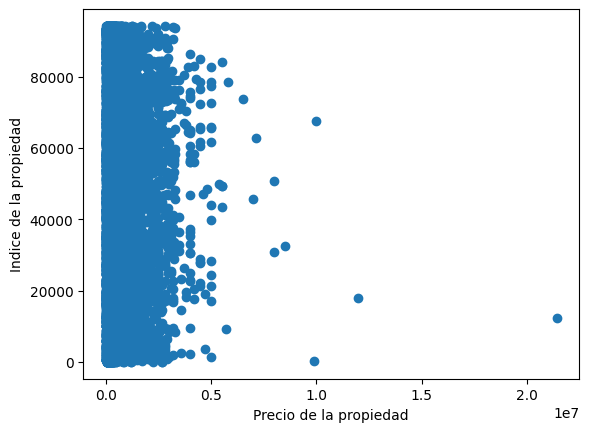

In [23]:
#Grafico de distribucion de property_price
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

plt.scatter(properati_filtrado['property_price'], range(len(properati_filtrado['property_price'])))
plt.xlabel('Precio de la propiedad')
plt.ylabel('Indice de la propiedad')
#etiquetas, etiquetas_nuevas = convertir_precio(plt.xticks()[0])
#plt.xticks(ticks=etiquetas, labels=etiquetas_nuevas)
plt.show()

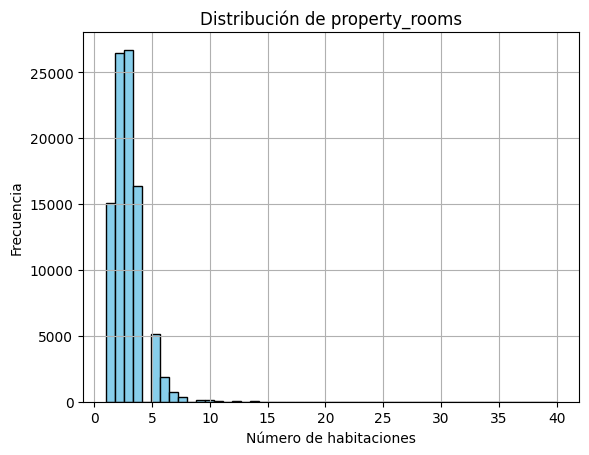

In [24]:
#Grafico de distribucion de property_rooms
plt.hist(properati_filtrado['property_rooms'], bins=50, color='skyblue', edgecolor='black')
plt.xlabel('Número de habitaciones')
plt.ylabel('Frecuencia')
plt.title('Distribución de property_rooms')
plt.grid(True)
plt.show()

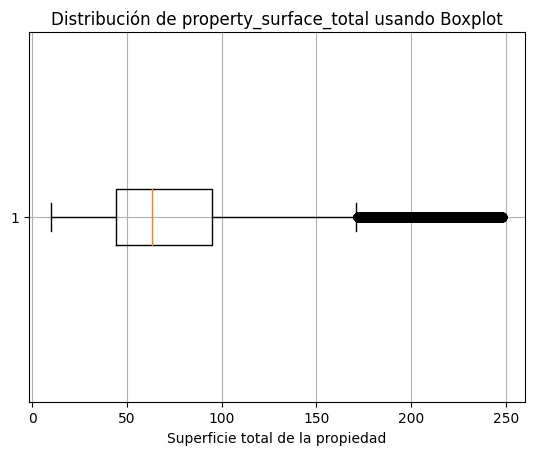

In [25]:
#Grafico de distribucion de property_surface_total
property_surface_total_sin_outliers = properati_filtrado[properati_filtrado['property_surface_total'] < properati_filtrado['property_surface_total'].quantile(0.95)]
plt.boxplot(property_surface_total_sin_outliers['property_surface_total'], vert=False)
plt.xlabel('Superficie total de la propiedad')
plt.title('Distribución de property_surface_total usando Boxplot')
plt.grid(True)
plt.show()

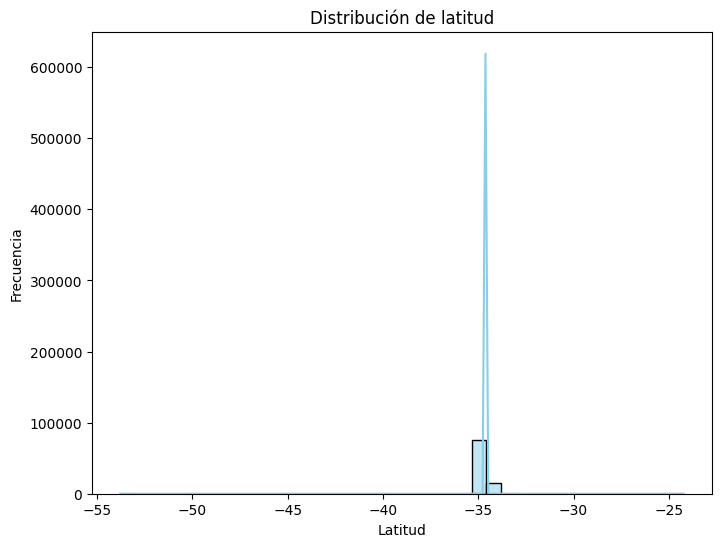

In [26]:
#Grafico de distribucion de latitud
plt.figure(figsize=(8, 6))
sns.histplot(properati_filtrado['latitud'], bins = 40, kde=True, color='skyblue')
plt.title('Distribución de latitud')
plt.xlabel('Latitud')
plt.ylabel('Frecuencia')
plt.show()


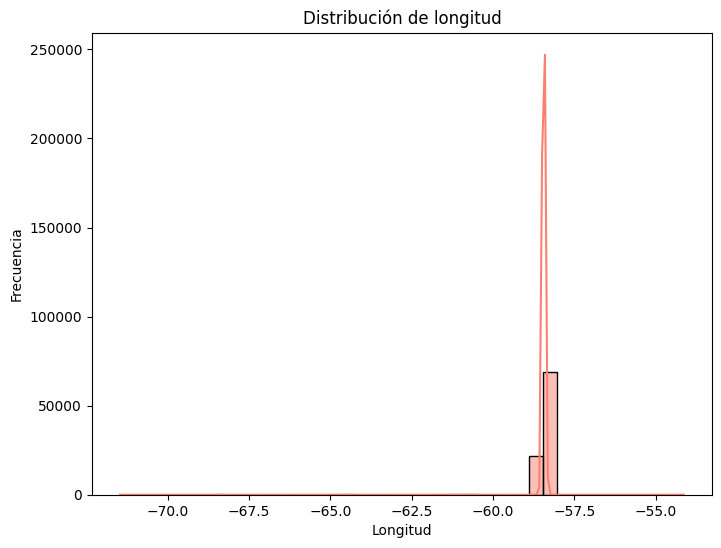

In [27]:
#Grafico de distribucion de longitud
plt.figure(figsize=(8, 6))
sns.histplot(properati_filtrado['longitud'], bins = 40, kde=True, color='salmon')
plt.title('Distribución de longitud')
plt.xlabel('Longitud')
plt.ylabel('Frecuencia')
plt.show()

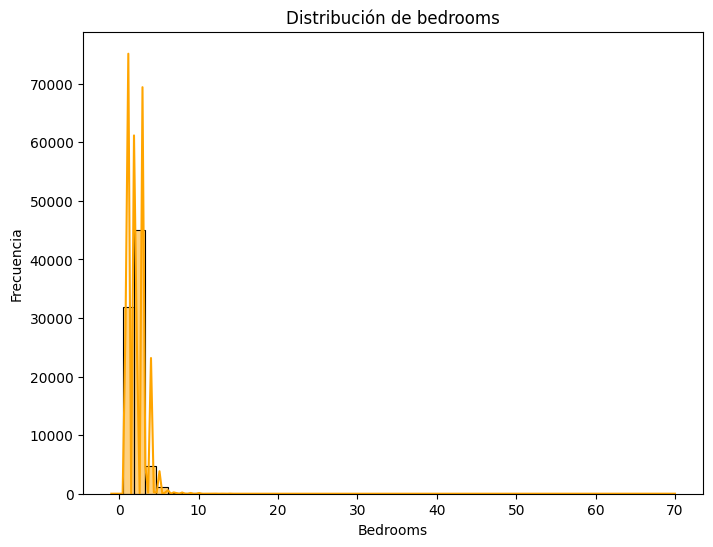

In [28]:
#Grafico de distribucion de property_bedrooms
plt.figure(figsize=(8, 6))
sns.histplot(properati_filtrado['property_bedrooms'], bins = 50, kde=True, color='orange')
plt.title('Distribución de bedrooms')
plt.xlabel('Bedrooms')
plt.ylabel('Frecuencia')
plt.show()

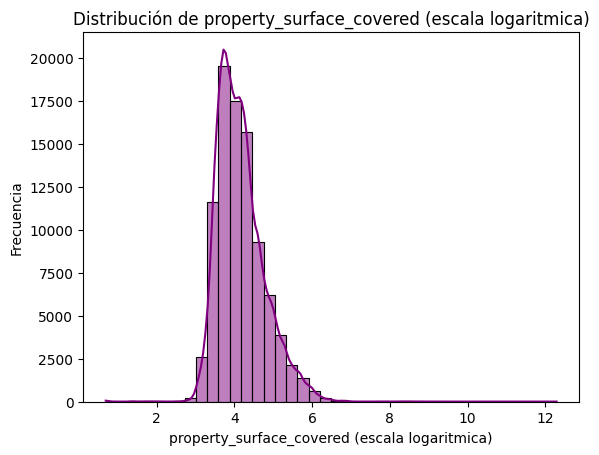

In [29]:
#Grafico de distribucion de property_surface_covered
log_property_surface_covered = np.log1p(properati_filtrado['property_surface_covered'])
# Hacemos la estrategia de aplicar logaritmo para poder observar mejor los valores
sns.histplot(log_property_surface_covered, bins=40, kde=True, color='purple')
plt.title('Distribución de property_surface_covered (escala logaritmica)')
plt.xlabel('property_surface_covered (escala logaritmica)')
plt.ylabel('Frecuencia')
ticks = np.linspace(log_property_surface_covered.min(), log_property_surface_covered.max(), num=5)
labels = ['0', '50000', '100000', '150000', '200000']
#plt.xticks(ticks, labels)
plt.show()

##### **Correlaciones**

In [30]:
#Algunas correlaciones que pueden servir

#'property_price' y 'property_surface_total'
corr_precio_superficie = properati_filtrado['property_price'].corr(properati_filtrado['property_surface_total'])

print("Correlación entre 'property_price' y 'property_surface_total':", corr_precio_superficie)

#'property_price' y 'property_rooms'
corr_precio_habs = properati_filtrado['property_price'].corr(properati_filtrado['property_rooms'])

print("Correlación entre 'property_price' y 'property_rooms':", corr_precio_habs)

#'property_price' y 'property_surface_covered'
corr_precio_superficie_cubierta = properati_filtrado['property_price'].corr(properati_filtrado['property_surface_covered'])

print("Correlación entre 'property_price' y 'property_surface_covered':", corr_precio_superficie_cubierta)


Correlación entre 'property_price' y 'property_surface_total': 0.08523491719899819
Correlación entre 'property_price' y 'property_rooms': 0.488934080178357
Correlación entre 'property_price' y 'property_surface_covered': 0.05623785863824733


#### b) **Visualización de los datos**
En esta sección se espera que puedan realizar una primera aproximación a los datos apoyándose en visualizaciones, por ejemplo: gráficos de dispersiónentre variables, histogramas, heatmaps, exploración de las columnas y cualquier otro gráfico adicional que se considere útil justificando su utilización.

###### **Grafico de dispersion entre 'property_price' y property_surface_total'**

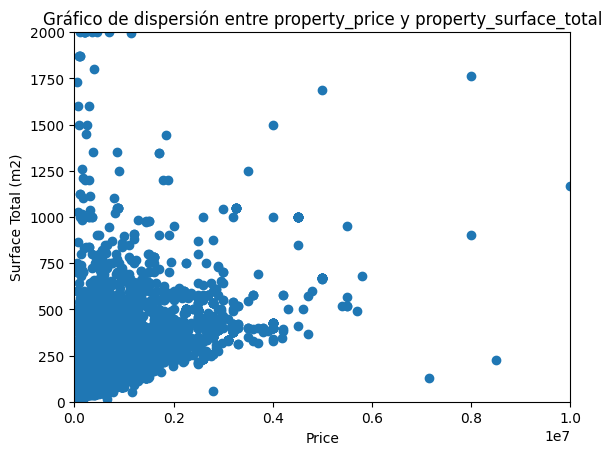

In [31]:
#grafico de dispersion entre 'property_price' y property_surface_total'
# import matplotlib.pyplot as plt
# import matplotlib.ticker as ticker

# Definir el formateador personalizado para el eje x
def millions_formatter(x, pos):
    return f'{x/1e6:.0f}M'

# Crear el gráfico de dispersión
plt.scatter(properati_filtrado['property_price'], properati_filtrado['property_surface_total'])
plt.xlabel('Price')
plt.ylabel('Surface Total (m2)')  # Mantenemos los "m2" en el eje y
plt.title('Gráfico de dispersión entre property_price y property_surface_total')

# Establecer los límites de los ejes
plt.ylim(0, 2000)
plt.xlim(0, 1e7)

# Aplicar el formateador personalizado al eje x
#plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(millions_formatter)) #se rompe cuando se corre el colab

# Mostrar el gráfico
plt.show()

###### **Grafico entre 'property_price' y property_rooms'**

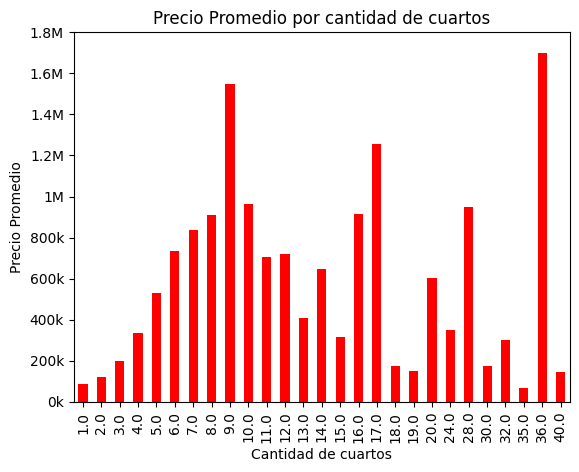

In [32]:
#grafico entre 'property_price' y property_rooms'
precio_promedio_por_cuartos = properati_filtrado.groupby('property_rooms')['property_price'].mean()
precio_promedio_por_cuartos
precio_promedio_por_cuartos.plot(kind='bar', color='red')
plt.xlabel('Cantidad de cuartos')
plt.ylabel('Precio Promedio')
plt.title('Precio Promedio por cantidad de cuartos')
etiquetas_y, etiquetas_nuevas = convertir_precio(plt.yticks()[0])
plt.yticks(ticks=etiquetas_y, labels=etiquetas_nuevas)
plt.show()

###### **Grafico de precio por tipo de propiedad**

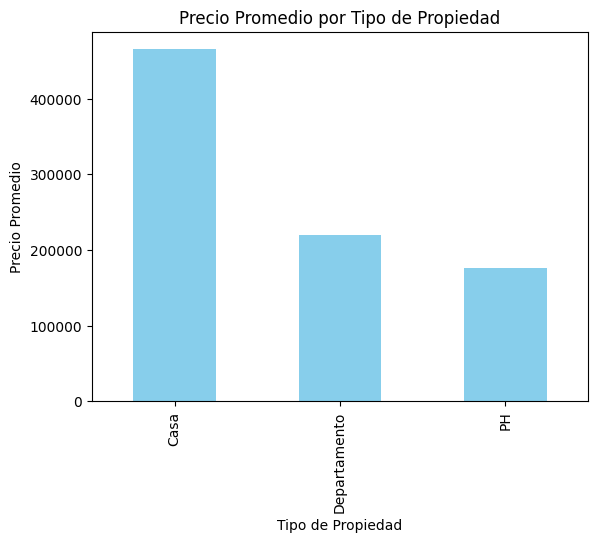

In [33]:
#precio por tipo de propiedad
precio_promedio_por_tipo = properati_filtrado.groupby('property_type')['property_price'].mean()

precio_promedio_por_tipo.plot(kind='bar', color='skyblue')
plt.xlabel('Tipo de Propiedad')
plt.ylabel('Precio Promedio')
plt.title('Precio Promedio por Tipo de Propiedad')
#plt.xticks(rotation=45)
plt.show()

###### **Grafico de Precio Promedio de Propiedades por Barrio**

<ipython-input-34-91bae148375a>:2: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='barrio', y='property_price', data=properati_filtrado, estimator='mean', ci=None)


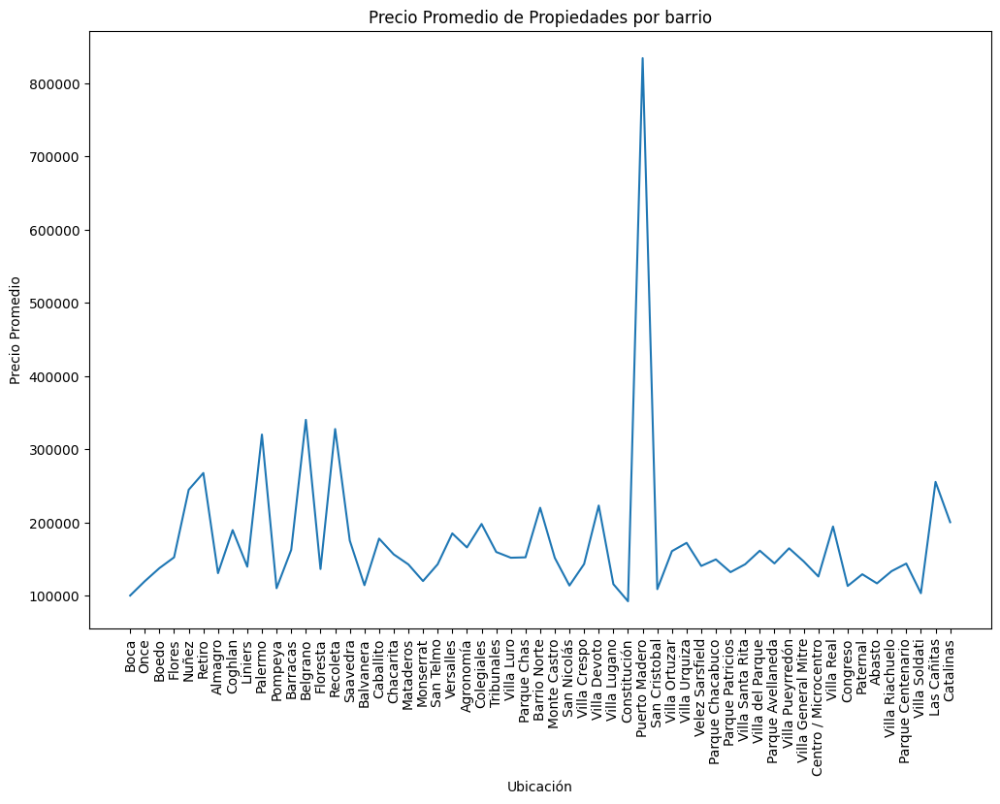

In [34]:
plt.figure(figsize=(12, 8))
sns.lineplot(x='barrio', y='property_price', data=properati_filtrado, estimator='mean', ci=None)
plt.xticks(rotation=90)
plt.xlabel('Ubicación')
plt.ylabel('Precio Promedio')
plt.title('Precio Promedio de Propiedades por barrio')
plt.show()

###### **Grafico de Precio dependiendo de cantidad de superficie cubierta**

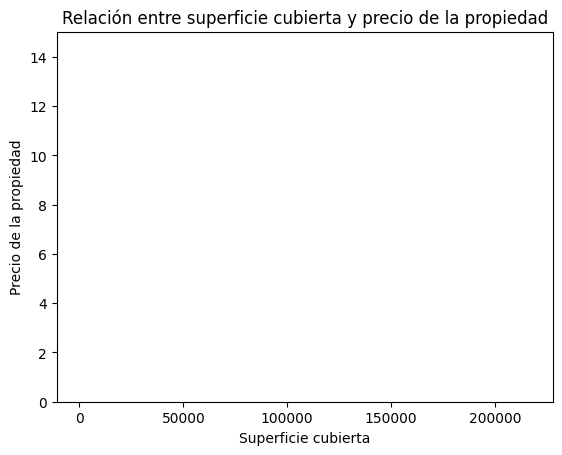

In [35]:
def format_price(value, _):
    if value >= 1e6:
        return '{:.1f}M'.format(value * 1e-6)
    elif value >= 1e3:
        return '{:.0f}k'.format(value * 1e-3)
    else:
        return '{:.0f}'.format(value)


plt.scatter(x=properati_filtrado['property_surface_covered'], y=properati_filtrado['property_price'])
plt.gca().yaxis.set_major_formatter(format_price)
plt.title('Relación entre superficie cubierta y precio de la propiedad')
plt.xlabel('Superficie cubierta')
plt.ylabel('Precio de la propiedad')
plt.ylim(0, 15)
# plt.xlim(0, 1e7)
plt.show()

#### c) **Datos Faltantes** : analizar la presencia de datos faltantes en el dataset

● Realizar análisis de datos faltantes a nivel de columna. Graficar para cada variable el porcentaje de datos faltantes con respecto al total del dataset.

● Realizar un análisis de datos faltantes a nivel de fila. Calcular el porcentaje de datos faltantes de cada registro. Realizar un gráfico que permita conocer la proporción de faltantes por fila en el dataset.

● Revisar los datos faltantes o mal ingresados y tomar una decisión sobre estos: reemplazo de valores, eliminación de registros incompletos, etc.

● En caso de realizar imputaciones comparar las distribuciones de cada atributo reparado con la distribución anterior a la imputación de los datos faltantes.

##### **Datos faltantes a nivel columna**



<ipython-input-36-a6efc85f14a2>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=porcentaje_faltantes_col.values, y=porcentaje_faltantes_col.index, palette='pastel')


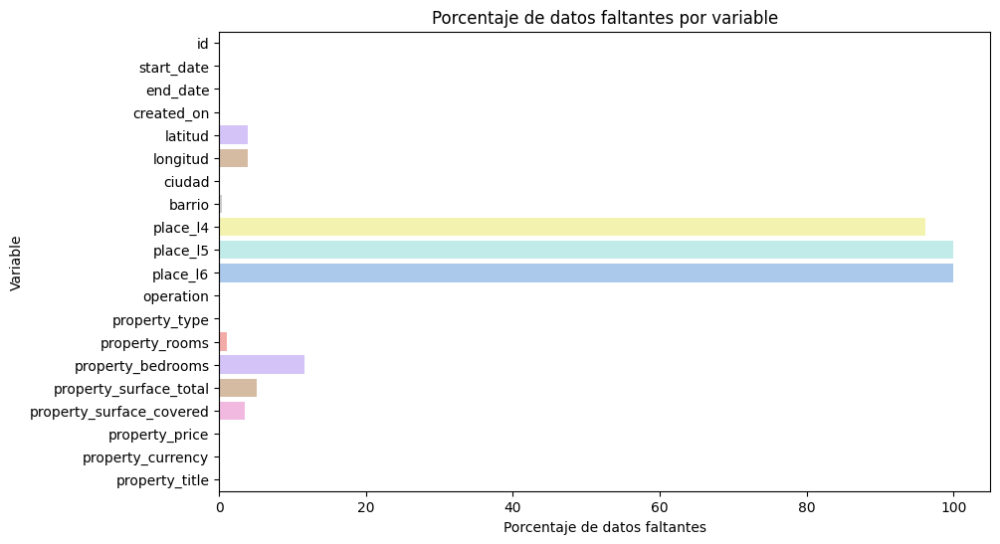

id                            0.000000
start_date                    0.000000
end_date                      0.000000
created_on                    0.000000
latitud                       3.957602
longitud                      3.957602
ciudad                        0.000000
barrio                        0.442445
place_l4                     96.134707
place_l5                    100.000000
place_l6                    100.000000
operation                     0.000000
property_type                 0.000000
property_rooms                1.107704
property_bedrooms            11.657418
property_surface_total        5.139577
property_surface_covered      3.558658
property_price                0.000000
property_currency             0.000000
property_title                0.000000
dtype: float64


In [36]:
#Datos faltantes a nivel columna
porcentaje_faltantes_col = (properati_filtrado.isnull().sum() / len(properati_filtrado)) * 100

plt.figure(figsize=(10, 6))
sns.barplot(x=porcentaje_faltantes_col.values, y=porcentaje_faltantes_col.index, palette='pastel')
plt.xlabel('Porcentaje de datos faltantes')
plt.ylabel('Variable')
plt.title('Porcentaje de datos faltantes por variable')
plt.show()
print(porcentaje_faltantes_col)

##### **Datos faltantes a nivel fila**

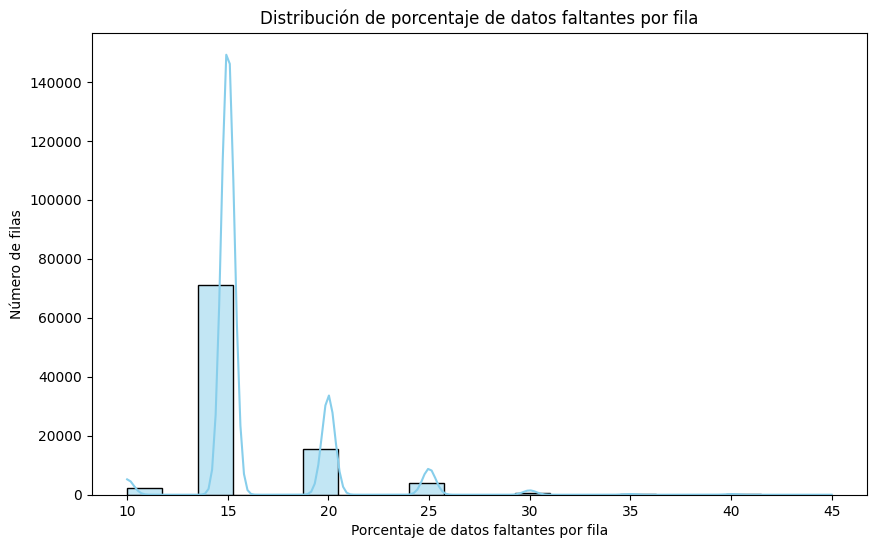

25        30.0
42        15.0
43        15.0
49        20.0
51        20.0
          ... 
460072    15.0
460073    15.0
460074    15.0
460075    15.0
460090    15.0
Length: 94249, dtype: float64


In [37]:
#Datos faltantes a nivel fila
porcentaje_faltantes_fil = (properati_filtrado.isnull().sum(axis=1) / len(properati_filtrado.columns)) * 100

plt.figure(figsize=(10, 6))
sns.histplot(porcentaje_faltantes_fil, bins=20, kde=True, color='skyblue')
plt.xlabel('Porcentaje de datos faltantes por fila')
plt.ylabel('Número de filas')
plt.title('Distribución de porcentaje de datos faltantes por fila')
plt.show()
print(porcentaje_faltantes_fil)

##### **Decision sobre datos faltantes**

###### *Columnas*

In [38]:
properati_full = properati_filtrado
properati_full.columns.to_list()

['id',
 'start_date',
 'end_date',
 'created_on',
 'latitud',
 'longitud',
 'ciudad',
 'barrio',
 'place_l4',
 'place_l5',
 'place_l6',
 'operation',
 'property_type',
 'property_rooms',
 'property_bedrooms',
 'property_surface_total',
 'property_surface_covered',
 'property_price',
 'property_currency',
 'property_title']

In [39]:
#Elimino las columnas: 'ciudad', 'operation' y 'property_currency' ya que tienen en cada una todas las propiedades la misma informacion
#debido a la filtracion inicial y; 'place_l4', 'place_l5' y 'place_l6' debido a la cantidad de datos faltantes que tienen.
properati_full = properati_filtrado.drop(columns=['ciudad', 'operation', 'property_currency', 'place_l4', 'place_l5', 'place_l6'])
properati_full.columns.to_list()

['id',
 'start_date',
 'end_date',
 'created_on',
 'latitud',
 'longitud',
 'barrio',
 'property_type',
 'property_rooms',
 'property_bedrooms',
 'property_surface_total',
 'property_surface_covered',
 'property_price',
 'property_title']

In [40]:
properati_full.isnull().sum()

id                              0
start_date                      0
end_date                        0
created_on                      0
latitud                      3730
longitud                     3730
barrio                        417
property_type                   0
property_rooms               1044
property_bedrooms           10987
property_surface_total       4844
property_surface_covered     3354
property_price                  0
property_title                  0
dtype: int64

Completo los datos faltantes de 'latitud' y 'longitud' buscando otras propiedades en el df con el mismo barrio y asi obtener unas latitud y longitud aproximadas.

In [41]:
for index, row in properati_full.iterrows():
    # Verificar si la propiedad actual tiene datos faltantes de latitud y longitud
    if pd.isna(row['latitud']) or pd.isna(row['longitud']):
        # Buscar otras propiedades en el mismo barrio que tengan coordenadas conocidas
        propiedades_similares = properati_full[(properati_full['barrio'] == row['barrio']) &
                                                ~pd.isna(properati_full['latitud']) &
                                                ~pd.isna(properati_full['longitud'])]
        if not propiedades_similares.empty:
            # Tomar las coordenadas de la primera propiedad similar encontrada
            latitud_similar = propiedades_similares.iloc[0]['latitud']
            longitud_similar = propiedades_similares.iloc[0]['longitud']

            # Asignar las coordenadas a la propiedad actual
            properati_full.at[index, 'latitud'] = latitud_similar
            properati_full.at[index, 'longitud'] = longitud_similar

properati_full.isnull().sum()

id                              0
start_date                      0
end_date                        0
created_on                      0
latitud                       170
longitud                      170
barrio                        417
property_type                   0
property_rooms               1044
property_bedrooms           10987
property_surface_total       4844
property_surface_covered     3354
property_price                  0
property_title                  0
dtype: int64

Veo que hay propiedades que no tienen ni barrio ni latitud y longitud. 170 para ser exactos.

Completo los datos faltantes en los barrios buscando otras propiedades cercanas que tengan el barrio conocido y también tengan coordenadas de latitud y longitud

In [42]:
for index, row in properati_full.iterrows():
    # Verificar si el barrio actual tiene datos faltantes
    if pd.isna(row['barrio']):
        # Buscar otras propiedades cercanas que tengan el barrio conocido
        propiedades_cercanas = properati_full[~pd.isna(properati_full['barrio']) &
                                               ~pd.isna(properati_full['latitud']) &
                                               ~pd.isna(properati_full['longitud'])]
        if not propiedades_cercanas.empty:
            # Tomar el barrio de la primera propiedad cercana encontrada
            barrio_cercano = propiedades_cercanas.iloc[0]['barrio']

            # Asignar el barrio a la propiedad actual
            properati_full.at[index, 'barrio'] = barrio_cercano

properati_full.isnull().sum()

id                              0
start_date                      0
end_date                        0
created_on                      0
latitud                       170
longitud                      170
barrio                          0
property_type                   0
property_rooms               1044
property_bedrooms           10987
property_surface_total       4844
property_surface_covered     3354
property_price                  0
property_title                  0
dtype: int64

Como ahora todas las propiedades tienen un barrio, se puede repetir el procedimiento y asi completar las filas que les falta 'latitud' y 'longitud'

In [43]:
for index, row in properati_full.iterrows():
    # Verificar si la propiedad actual tiene datos faltantes de latitud y longitud
    if pd.isna(row['latitud']) or pd.isna(row['longitud']):
        # Buscar otras propiedades en el mismo barrio que tengan coordenadas conocidas
        propiedades_similares = properati_full[(properati_full['barrio'] == row['barrio']) &
                                                ~pd.isna(properati_full['latitud']) &
                                                ~pd.isna(properati_full['longitud'])]
        if not propiedades_similares.empty:
            # Tomar las coordenadas de la primera propiedad similar encontrada
            latitud_similar = propiedades_similares.iloc[0]['latitud']
            longitud_similar = propiedades_similares.iloc[0]['longitud']

            # Asignar las coordenadas a la propiedad actual
            properati_full.at[index, 'latitud'] = latitud_similar
            properati_full.at[index, 'longitud'] = longitud_similar

properati_full.isnull().sum()

id                              0
start_date                      0
end_date                        0
created_on                      0
latitud                         0
longitud                        0
barrio                          0
property_type                   0
property_rooms               1044
property_bedrooms           10987
property_surface_total       4844
property_surface_covered     3354
property_price                  0
property_title                  0
dtype: int64

Completo los valores faltantes en el atributo 'rooms' poniendoles a los casilleros vacios el promedio de cantidad de cuartos de las demas propiedades:

In [44]:
properati_full['property_rooms'] = properati_full['property_rooms'].fillna(mediana_rooms)
properati_full.isnull().sum()

id                              0
start_date                      0
end_date                        0
created_on                      0
latitud                         0
longitud                        0
barrio                          0
property_type                   0
property_rooms                  0
property_bedrooms           10987
property_surface_total       4844
property_surface_covered     3354
property_price                  0
property_title                  0
dtype: int64

Completo los valores faltantes del atributo 'property_bedrooms' con la cantidad de cuartos que tiene esa propiedad - 1. Ya que, en general, en una propiedad se cuentan como ambientes todas las habitaciones mas el living.

In [45]:
for index, row in properati_full.iterrows():
    # Si la cantidad de cuartos no es nula, calcular la cantidad de habitaciones
    if pd.notnull(row['property_rooms']):
        properati_full.at[index, 'property_bedrooms'] = row['property_rooms'] - 1

properati_full.isnull().sum()

id                             0
start_date                     0
end_date                       0
created_on                     0
latitud                        0
longitud                       0
barrio                         0
property_type                  0
property_rooms                 0
property_bedrooms              0
property_surface_total      4844
property_surface_covered    3354
property_price                 0
property_title                 0
dtype: int64

Completamos los valores faltantes de los atributos 'surface_total' y 'surface_covered' usando la tecnica de Imputacion por vecinos mas cercanos(KNN)

In [46]:
from sklearn.impute import KNNImputer
features = ['property_surface_total', 'property_rooms']

# Inicializar el imputador KNN
imputer = KNNImputer(n_neighbors=5)

# Imputar valores faltantes para 'surface_total' y 'surface_covered'
properati_full[['property_surface_total', 'property_surface_covered']] = imputer.fit_transform(properati_full[features])

properati_full = properati_full[properati_full['property_surface_total']<1000]
properati_full.isnull().sum()

id                          0
start_date                  0
end_date                    0
created_on                  0
latitud                     0
longitud                    0
barrio                      0
property_type               0
property_rooms              0
property_bedrooms           0
property_surface_total      0
property_surface_covered    0
property_price              0
property_title              0
dtype: int64

###### *Filas*

Una vez completados todos los datos faltantes a nivel columna, tambien se completaron los datos faltantes a nivel fila.

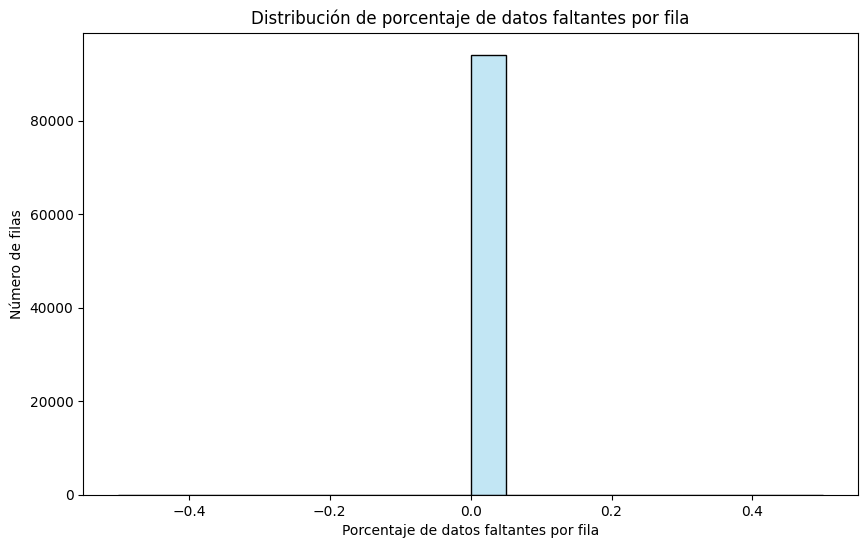

25        0.0
42        0.0
43        0.0
49        0.0
51        0.0
         ... 
460072    0.0
460073    0.0
460074    0.0
460075    0.0
460090    0.0
Length: 94078, dtype: float64


In [47]:
#Datos faltantes a nivel fila
porcentaje_faltantes_fil = (properati_full.isnull().sum(axis=1) / len(properati_full.columns)) * 100

plt.figure(figsize=(10, 6))
sns.histplot(porcentaje_faltantes_fil, bins=20, kde=True, color='skyblue')
plt.xlabel('Porcentaje de datos faltantes por fila')
plt.ylabel('Número de filas')
plt.title('Distribución de porcentaje de datos faltantes por fila')
plt.show()
print(porcentaje_faltantes_fil)

Confirmamos que no quedo ninguna fila con algun dato faltante.

##### *Distribuciones de las variables luego de trabajar con los datos faltantes*

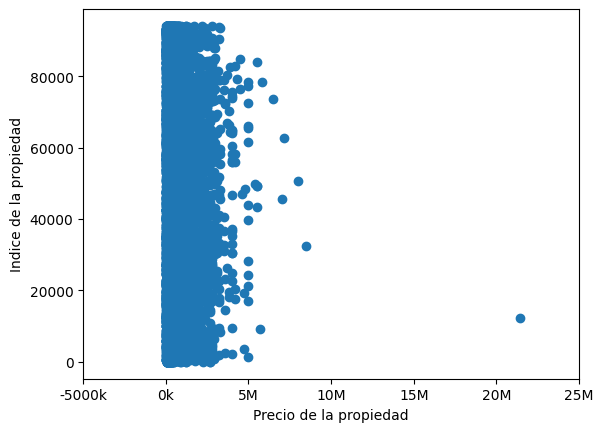

In [48]:
#Grafico de distribucion de property_price
plt.scatter(properati_full['property_price'], range(len(properati_full['property_price'])))
plt.xlabel('Precio de la propiedad')
plt.ylabel('Indice de la propiedad')
etiquetas, etiquetas_nuevas = convertir_precio(plt.xticks()[0])
plt.xticks(ticks=etiquetas, labels=etiquetas_nuevas)
plt.show()

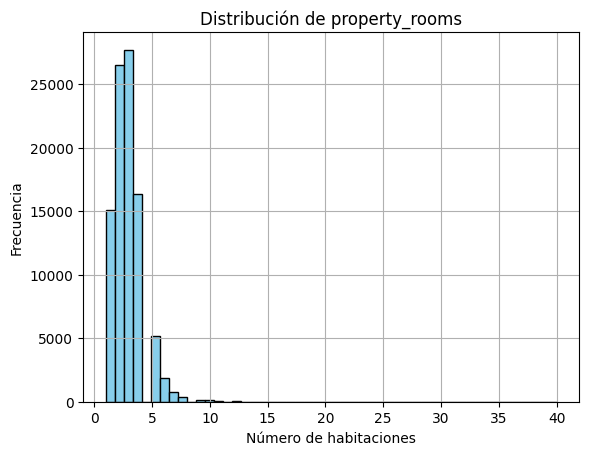

In [49]:
#Grafico de distribucion de property_rooms
plt.hist(properati_full['property_rooms'], bins=50, color='skyblue', edgecolor='black')
plt.xlabel('Número de habitaciones')
plt.ylabel('Frecuencia')
plt.title('Distribución de property_rooms')
plt.grid(True)
plt.show()

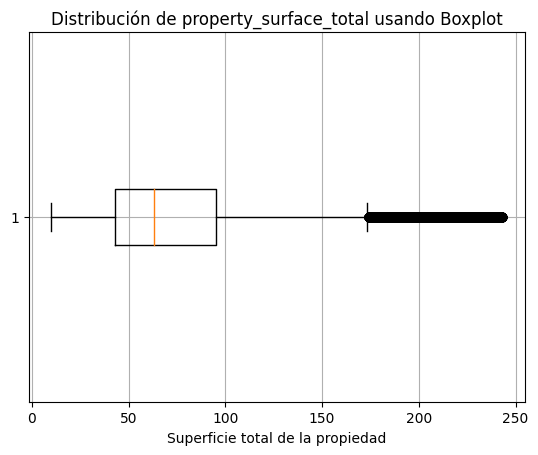

In [50]:
#Grafico de distribucion de property_surface_total
property_surface_total_sin_outliers = properati_full[properati_full['property_surface_total'] < properati_full['property_surface_total'].quantile(0.95)]
plt.boxplot(property_surface_total_sin_outliers['property_surface_total'], vert=False)
plt.xlabel('Superficie total de la propiedad')
plt.title('Distribución de property_surface_total usando Boxplot')
plt.grid(True)
plt.show()

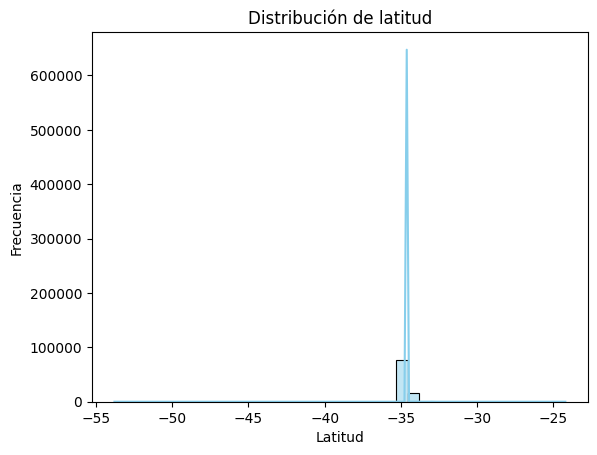

In [51]:
#Grafico de distribucion de latitud
sns.histplot(properati_full['latitud'], bins = 40, kde=True, color='skyblue')
plt.title('Distribución de latitud')
plt.xlabel('Latitud')
plt.ylabel('Frecuencia')
plt.show()


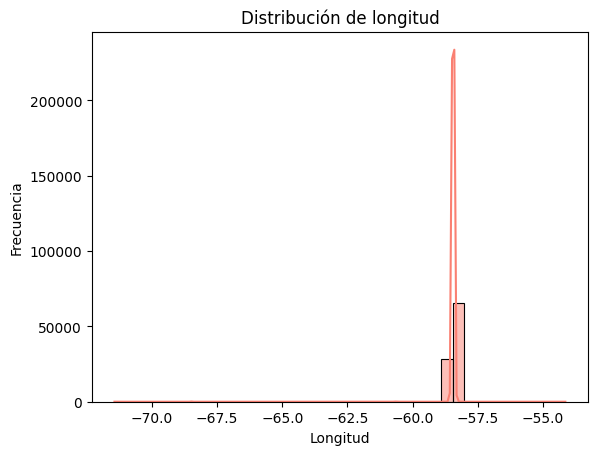

In [52]:
#Grafico de distribucion de longitud
sns.histplot(properati_full['longitud'], bins = 40, kde=True, color='salmon')
plt.title('Distribución de longitud')
plt.xlabel('Longitud')
plt.ylabel('Frecuencia')
plt.show()

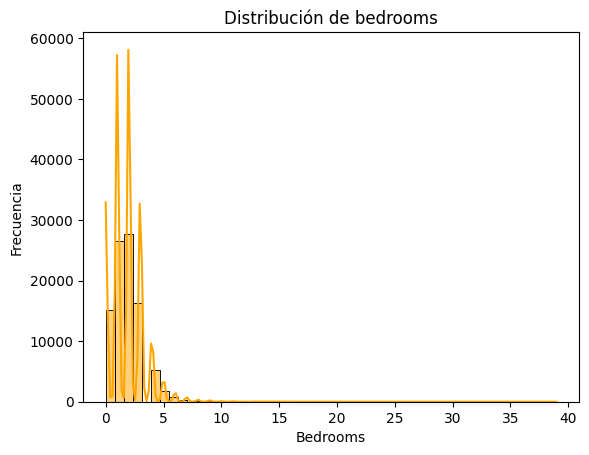

In [53]:
#Grafico de distribucion de property_bedrooms
sns.histplot(properati_full['property_bedrooms'], bins = 50, kde=True, color='orange')
plt.title('Distribución de bedrooms')
plt.xlabel('Bedrooms')
plt.ylabel('Frecuencia')
plt.show()

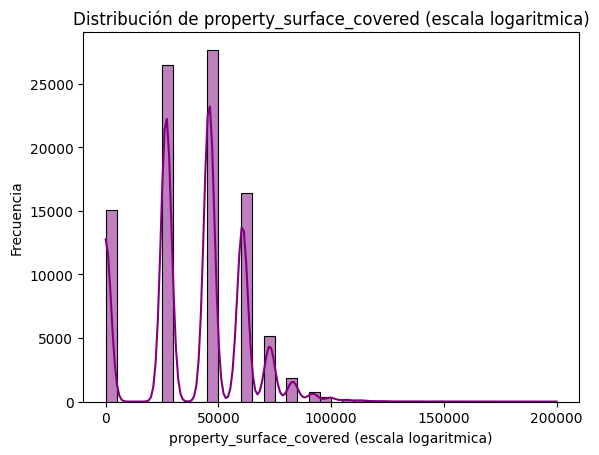

In [54]:
#Grafico de distribucion de property_surface_covered
log_property_surface_covered = np.log1p(properati_full['property_surface_covered'])
# Hacemos la misma estrategia de aplicar logaritmo para poder observar mejor los valores
sns.histplot(log_property_surface_covered, bins=40, kde=True, color='purple')
plt.title('Distribución de property_surface_covered (escala logaritmica)')
plt.xlabel('property_surface_covered (escala logaritmica)')
plt.ylabel('Frecuencia')
ticks = np.linspace(log_property_surface_covered.min(), log_property_surface_covered.max(), num=5)
labels = ['0', '50000', '100000', '150000', '200000']
plt.xticks(ticks, labels)
plt.show()

#### d) Valores atípicos : analizar la existencia de valores atípicos
- Detectar valores atípicos en los datos tanto en forma univariada como multivariada.
Realizar gráficos que permitan visualizar los valores atípicos.
- Explicar qué características poseen los datos atípicos detectados.
- Decidir el tratamiento a aplicar sobre los mismos.
- Analizar la relación entre el precio de venta y los metros de superficie ¿hay valores atípicos
que no se detectaron previamente?

##### **Valores atípicos en distribuciones univariadas**

In [55]:
from scipy import stats


In [56]:
print(properati_full['property_rooms'].mean())
print(properati_full['property_bedrooms'].mean())

2.822710941984311
1.8227109419843108


In [57]:
# Se utilizo z-score para encontrar los casos que se desvian de la media. En este caso se aplico un umbral de 9, ya que con este valor nos devolvio valores atipicos para la cantidad de habitaciones en una propiedad.
# Nos devolvio valores entre 16 y 40 los cuales se desvian demasiado de la media que se encuentra en 2.8.
z_scores_rooms = stats.zscore(properati_full['property_rooms'])
outliers_rooms = (z_scores_rooms > 9) | (z_scores_rooms < -9)
print("\nOutliers en 'property_rooms':")
print(properati_full[outliers_rooms]['property_rooms'])
print(properati_full[outliers_rooms]['property_rooms'].max())


Outliers en 'property_rooms':
21009     30.0
32758     19.0
52157     30.0
90004     32.0
90686     17.0
115403    17.0
150885    35.0
153687    17.0
208593    18.0
211468    20.0
225809    16.0
285222    20.0
292167    24.0
332857    18.0
334144    16.0
346602    19.0
356618    40.0
362676    16.0
362696    16.0
366101    18.0
389282    28.0
402448    17.0
Name: property_rooms, dtype: float64
40.0


In [58]:
# En este caso se aplico un umbral de 6, ya que con este valor nos devolvio valores atipicos para la cantidad de dormitorios en una propiedad.
# Nos devolvio valores entre 9 y 39 los cuales se desvian demasiado de la media que se encuentra en 1.8.

z_scores_bedrooms = stats.zscore(properati_full['property_bedrooms'])
outliers_bedrooms = (z_scores_bedrooms > 5) | (z_scores_bedrooms < -5)
print("\nOutliers en 'property_bedrooms':")
print(properati_full[outliers_bedrooms]['property_bedrooms'].count() )
print(properati_full[outliers_bedrooms]['property_bedrooms'].min() )
print(properati_full[outliers_bedrooms]['property_bedrooms'].max() )


Outliers en 'property_bedrooms':
224
9.0
39.0


###### *Valores atipicos de property_surface_total*

<ipython-input-59-238697b558e3>:4: FutureWarning: 

The `scale` parameter has been renamed and will be removed in v0.15.0. Pass `density_norm='width'` for the same effect.
  sns.violinplot(x=log_property_surface_total, scale='width')


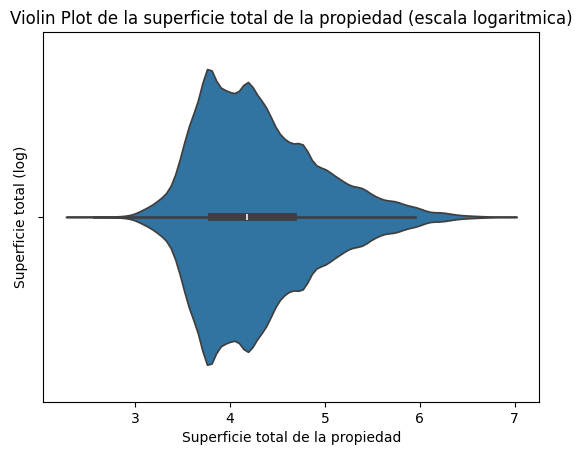

In [59]:
from matplotlib.ticker import ScalarFormatter
# Aplico logaritmo a la variable ya que, al haber valores tan grandes, no se llega a distinguir del todo bien el grafico.
log_property_surface_total = np.log1p(properati_full['property_surface_total'])
sns.violinplot(x=log_property_surface_total, scale='width')
plt.title('Violin Plot de la superficie total de la propiedad (escala logaritmica)')
plt.xlabel('Superficie total de la propiedad')
plt.ylabel('Superficie total (log)')
plt.show()

###### *Valores atipicos de property_rooms*

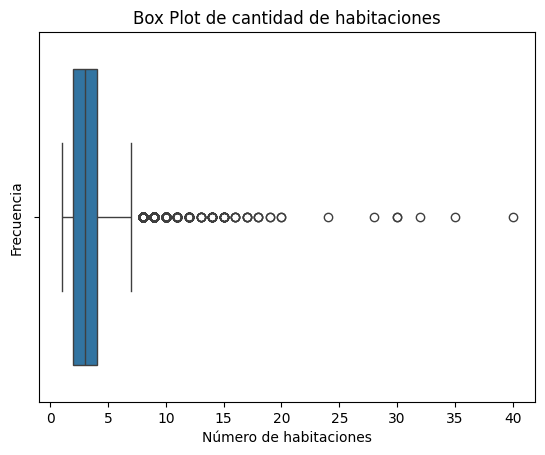

In [60]:
sns.boxplot(x=properati_full['property_rooms'])
plt.title('Box Plot de cantidad de habitaciones')
plt.xlabel('Número de habitaciones')
plt.ylabel('Frecuencia')
plt.show()

##### **Valores atípicos en distribuciones multivariadas**


###### *Valores atipicos en property_bedrooms por tipo de propiedad*

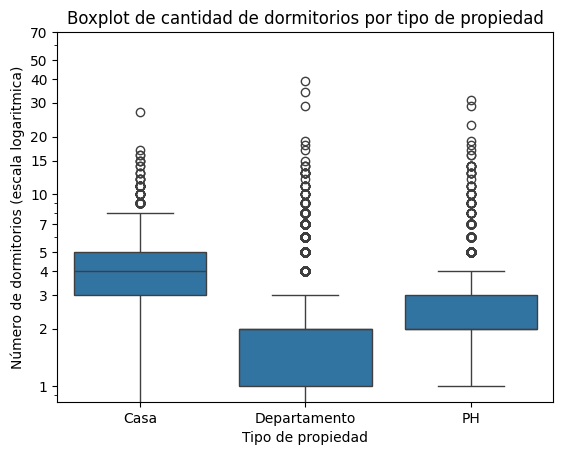

In [61]:
sns.boxplot(x='property_type', y='property_bedrooms', data=properati_full)
plt.yscale('log')
plt.title('Boxplot de cantidad de dormitorios por tipo de propiedad')
plt.xlabel('Tipo de propiedad')
plt.ylabel('Número de dormitorios (escala logaritmica)')
# Cambio la escala a logaritmica ya que, al haber valores tan grandes, no se llega a distinguir del todo bien el grafico.
plt.gca().yaxis.set_major_formatter(ScalarFormatter())
plt.yticks(ticks=[1, 2, 3, 4, 5, 7, 10, 15, 20, 30, 40, 50, 70])
plt.show()

###### *Valores atipicos en property_surface_total y property_price*

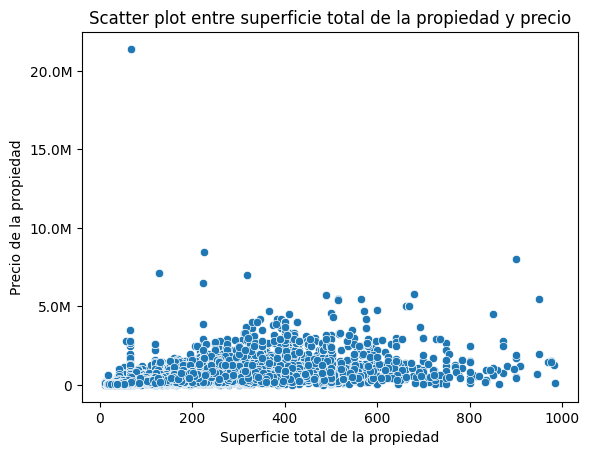

In [62]:
import matplotlib.ticker as ticker
sns.scatterplot(x='property_surface_total', y='property_price', data=properati_full)
plt.title('Scatter plot entre superficie total de la propiedad y precio')
#cambio el formato para que se vea como millones o miles en lugar de notacion cientifica
plt.gca().yaxis.set_major_formatter(ticker.FuncFormatter(format_price))
plt.xlabel('Superficie total de la propiedad')
plt.ylabel('Precio de la propiedad')
plt.show()

###### *Valores atipicos en barrio y property_price*

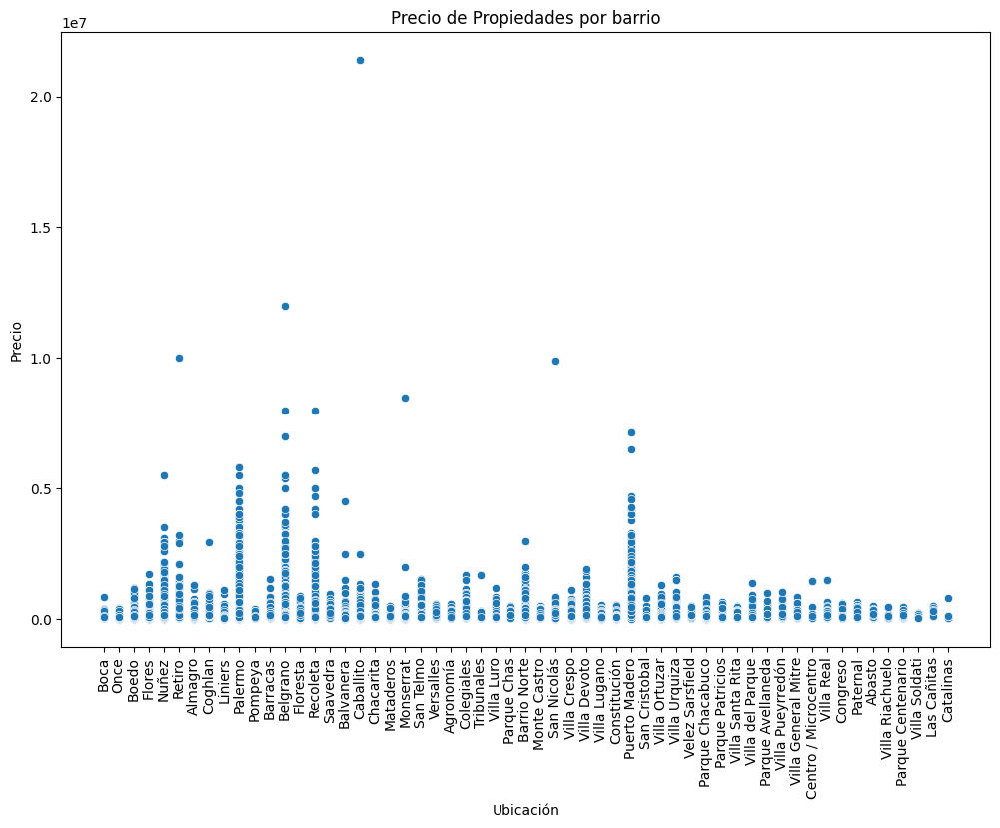

In [63]:
plt.figure(figsize=(12, 8))
sns.scatterplot(x='barrio', y='property_price', data=properati_filtrado)
plt.xticks(rotation=90)
plt.xlabel('Ubicación')
plt.ylabel('Precio')
plt.title('Precio de Propiedades por barrio')
plt.show()

##### **Caracteristicas de los datos atipicos**
Observamos que, en cuanto a variables multivariadas, los datos atipicos en cuanto a la superficie de la propiedad y el precio podria ser causado por una falla en el tipeo a la hora de cargarlos en el dataset. Asumimos esto y con esta información simplemente eliminamos un cero en los valores que superan 1.5M de superficie total de la propiedad. En la cantidad de habitaciones, hay algunos valores que nos parecen demasiado altos y podriamos considerarlos outliers, pero tenemos que tener en consideración que tipo de propiedad es, ya que una casa con 20 habitaciones nos hace pensar que hay un problema con este dato, pero si es un PH, quizá no es algo que suene muy por fuera de lo normal. De esta forma, si tenemos propiedades que son casas o departamentos con una cantidad de habitaciones mayor a 20, serán eliminados esos datos porque consideramos que no representan nuestro modelo correctamente y no nos ayudan para modelar lo que queremos.

In [64]:
# Eliminar un cero en los valores de superficie total de la propiedad que superen 1.5M
properati_final = properati_full
properati_final['property_surface_total'] = properati_final['property_surface_total'].apply(lambda x: x / 10 if x > 500 else x)

# Eliminar datos de casas o departamentos con más de 20 habitaciones
properati_final = properati_final[(properati_final['property_type'] != 'Casa') | (properati_final['property_rooms'] <= 20)]
properati_final = properati_final[(properati_final['property_type'] != 'Departamento') | (properati_final['property_rooms'] <= 20)]

##### **Distribucion de las variables luego de tratar los valores atipicos**

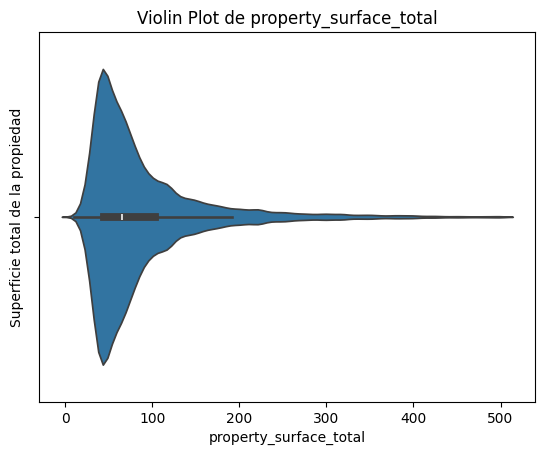

In [65]:
sns.violinplot(x=properati_final['property_surface_total'])
# vemos que ya no hace falta usar una escala logaritmica ya que la distancia entre el rango intercuartil y los valores atipicos se redujo
plt.gca().xaxis.set_major_formatter(ticker.FuncFormatter(format_price))
plt.title('Violin Plot de property_surface_total')
plt.ylabel('Superficie total de la propiedad')
plt.show()

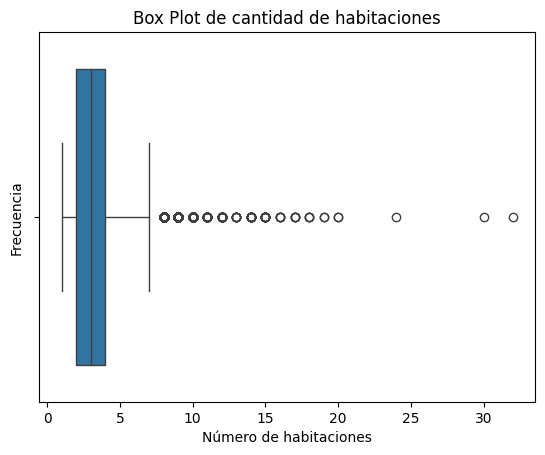

In [66]:
sns.boxplot(x=properati_final['property_rooms'])
plt.title('Box Plot de cantidad de habitaciones')
plt.xlabel('Número de habitaciones')
plt.ylabel('Frecuencia')
plt.show()

##### ***Relación entre el precio de venta y los metros de superficie***

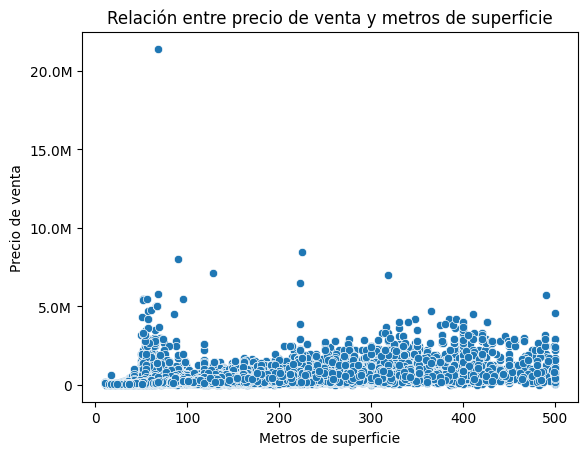

In [67]:
ax = sns.scatterplot(x='property_surface_total', y='property_price', data=properati_final)
plt.title('Relación entre precio de venta y metros de superficie')
ax.yaxis.set_major_formatter(ticker.FuncFormatter(format_price))
plt.xlabel('Metros de superficie')
plt.ylabel('Precio de venta')
plt.show()

**¿Hay valores atípicos que no se detectaron previamente?** Se puede observar que si, hay valores atípicos que no fueron detectados y, por lo tanto, tratados de forma adecuada.

## 2. Agrupamiento



a. Analizar la tendencia al clustering del dataset.

b. Estimar la cantidad apropiada de grupos que se deben formar.

c. Evaluar la calidad de los grupos formados realizando un análisis de Silhouette.

d. Realizar un análisis de cada grupo intentando entender en función de qué características fueron formados.

e. Graficar sobre un mapa de CABA los avisos coloreados según el grupo al que pertenecen.

f. Repetir el análisis anterior, utilizando sólo 3 grupos.

#### a) Analisis de la tendencia al clustering del dataset

Para analizar la tendencia de las variables a agruparse vamos a valernos de la libreria Kmeans, la importamos

In [68]:
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.cluster import KMeans

Antes de comenzar vemos como tenemos nuestro dataset

In [69]:
properati_final.head()

,id,start_date,end_date,created_on,latitud,longitud,barrio,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title
25,CyZu6IaZgmQYGk8jmPajCg==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,Boca,Casa,4.0,3.0,171.0,4.0,210000.0,VENTA CASA LLAVE EN MANO - COSTA ESMERALDA
42,d3Z0MblSb2IMBoOBMGJEEQ==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,Boca,Departamento,3.0,2.0,58.0,3.0,82900.0,VENTA TRES AMBIENTES LA BOCA PISO ALTO
43,rL7qPkQnomsMGu2ViS3sBw==,2021-09-09,2021-09-28,2021-09-09,-34.628647,-58.361871,Boca,Departamento,4.0,3.0,70.0,4.0,99000.0,Departamento - 4 Ambientes - Catalinas Sur
49,vuX/ccLAMVml4qWRFcOJUA==,2021-09-09,2022-01-05,2021-09-09,-34.610027,-58.401934,Once,Departamento,4.0,3.0,118.2,4.0,146000.0,Venta departamento 4 ambientes Once
51,ZTtSCeqZ3HUgf5jjwEzRcw==,2021-09-09,2022-03-09,2021-09-09,-34.631621,-58.416825,Boedo,PH,4.0,3.0,118.2,4.0,250000.0,PH - Boedo


##### **Preparacion de datos para clusterizacion**

Hay que transformar las columnas con valores no numericos a numeros para poder utilizarlos, para esto vamos a utilizar el One Hot Encoding y transformaremos los barrios y los tipos de propiedad en booleanos para poder utilizarlos.


In [70]:
#Transformamos el barrio y los tipos de propiedades en columnas con valores true o false
properati_Kmeans = pd.get_dummies(
    properati_final, columns=["barrio", "property_type"], drop_first=True
)
display(properati_Kmeans.head(2))
print(properati_Kmeans.shape)

,id,start_date,end_date,created_on,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,...,barrio_Villa Ortuzar,barrio_Villa Pueyrredón,barrio_Villa Real,barrio_Villa Riachuelo,barrio_Villa Santa Rita,barrio_Villa Soldati,barrio_Villa Urquiza,barrio_Villa del Parque,property_type_Departamento,property_type_PH
25,CyZu6IaZgmQYGk8jmPajCg==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,4.0,3.0,171.0,4.0,...,False,False,False,False,False,False,False,False,False,False
42,d3Z0MblSb2IMBoOBMGJEEQ==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,3.0,2.0,58.0,3.0,...,False,False,False,False,False,False,False,False,True,False


(94074, 70)


A su vez, vamos a eliminar las columnas que no nos sean de utilidad o cuya relacion no nos interese, estas son:
*   start_date
*   end_date
*   id
*   created_on
*   property_title




In [71]:
properati_Kmeans.columns.to_list()

['id',
 'start_date',
 'end_date',
 'created_on',
 'latitud',
 'longitud',
 'property_rooms',
 'property_bedrooms',
 'property_surface_total',
 'property_surface_covered',
 'property_price',
 'property_title',
 'barrio_Agronomía',
 'barrio_Almagro',
 'barrio_Balvanera',
 'barrio_Barracas',
 'barrio_Barrio Norte',
 'barrio_Belgrano',
 'barrio_Boca',
 'barrio_Boedo',
 'barrio_Caballito',
 'barrio_Catalinas',
 'barrio_Centro / Microcentro',
 'barrio_Chacarita',
 'barrio_Coghlan',
 'barrio_Colegiales',
 'barrio_Congreso',
 'barrio_Constitución',
 'barrio_Flores',
 'barrio_Floresta',
 'barrio_Las Cañitas',
 'barrio_Liniers',
 'barrio_Mataderos',
 'barrio_Monserrat',
 'barrio_Monte Castro',
 'barrio_Nuñez',
 'barrio_Once',
 'barrio_Palermo',
 'barrio_Parque Avellaneda',
 'barrio_Parque Centenario',
 'barrio_Parque Chacabuco',
 'barrio_Parque Chas',
 'barrio_Parque Patricios',
 'barrio_Paternal',
 'barrio_Pompeya',
 'barrio_Puerto Madero',
 'barrio_Recoleta',
 'barrio_Retiro',
 'barrio_Saaved

In [72]:
#Eliminamos las columnas mencionadas
properati_Kmeans = properati_Kmeans.drop(columns=['start_date', 'end_date', 'id', 'created_on', 'property_title'])
properati_Kmeans.columns.to_list()

['latitud',
 'longitud',
 'property_rooms',
 'property_bedrooms',
 'property_surface_total',
 'property_surface_covered',
 'property_price',
 'barrio_Agronomía',
 'barrio_Almagro',
 'barrio_Balvanera',
 'barrio_Barracas',
 'barrio_Barrio Norte',
 'barrio_Belgrano',
 'barrio_Boca',
 'barrio_Boedo',
 'barrio_Caballito',
 'barrio_Catalinas',
 'barrio_Centro / Microcentro',
 'barrio_Chacarita',
 'barrio_Coghlan',
 'barrio_Colegiales',
 'barrio_Congreso',
 'barrio_Constitución',
 'barrio_Flores',
 'barrio_Floresta',
 'barrio_Las Cañitas',
 'barrio_Liniers',
 'barrio_Mataderos',
 'barrio_Monserrat',
 'barrio_Monte Castro',
 'barrio_Nuñez',
 'barrio_Once',
 'barrio_Palermo',
 'barrio_Parque Avellaneda',
 'barrio_Parque Centenario',
 'barrio_Parque Chacabuco',
 'barrio_Parque Chas',
 'barrio_Parque Patricios',
 'barrio_Paternal',
 'barrio_Pompeya',
 'barrio_Puerto Madero',
 'barrio_Recoleta',
 'barrio_Retiro',
 'barrio_Saavedra',
 'barrio_San Cristobal',
 'barrio_San Nicolás',
 'barrio_San Tel

por ultimo, tomamos solo aquellos valores de latitud y longitud en los que se encuentra CABA.

In [73]:
properati_Kmeans = properati_Kmeans.query('-58.55 < longitud < -58.30') #tomamos los que esten dentro de la longitud de CABA.
properati_Kmeans = properati_Kmeans.query('-34.75 < latitud < -34.50')  #tomamos los que esten dentro de la latitud de CABA.

##### **Standarizacion**

para realizar un analisis sobre la tendencia a la agrupacion, nos conviene estandarizar los valores de nuestro dataframe, procederemos a ellos con un StandardScaler.

In [74]:
from sklearn.preprocessing import (StandardScaler)

#creamos un dataframe nuevo con el que trabajar con los valores estandarizados.
properati_predecir_df = pd.DataFrame(properati_Kmeans, columns = properati_Kmeans.columns)

properati_predecir_df[properati_predecir_df.columns] = StandardScaler().fit_transform(properati_predecir_df)

properati_predecir_df.head(10)

,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,barrio_Agronomía,barrio_Almagro,barrio_Balvanera,...,barrio_Villa Ortuzar,barrio_Villa Pueyrredón,barrio_Villa Real,barrio_Villa Riachuelo,barrio_Villa Santa Rita,barrio_Villa Soldati,barrio_Villa Urquiza,barrio_Villa del Parque,property_type_Departamento,property_type_PH
25,-1.565866,2.026621,0.846517,0.846517,1.204869,0.846517,-0.047733,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,-2.469359,-0.330579
42,-1.565866,2.026621,0.128705,0.128705,-0.428167,0.128705,-0.464280,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,0.404963,-0.330579
43,-1.236812,2.006989,0.846517,0.846517,-0.254747,0.846517,-0.411516,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,0.404963,-0.330579
49,-0.530331,0.954497,0.846517,0.846517,0.441822,0.846517,-0.257482,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,0.404963,-0.330579
51,-1.349664,0.563297,0.846517,0.846517,0.441822,0.846517,0.083360,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,-2.469359,3.024992
53,-1.056175,0.670464,-0.589107,-0.589107,-0.384812,-0.589107,-0.408238,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,-2.469359,3.024992
55,-1.120743,0.399607,0.846517,0.846517,0.236609,0.846517,-0.129666,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,-2.469359,3.024992
56,-1.265327,0.326148,-0.589107,-0.589107,-0.370360,-0.589107,-0.408238,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,0.404963,-0.330579
57,-0.937115,0.689947,0.128705,0.128705,-0.413715,0.128705,-0.129666,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,0.404963,-0.330579
58,-1.429679,0.355658,5.153388,5.153388,4.427587,5.153388,0.902689,-0.050089,-0.213099,-0.167108,...,-0.084197,-0.104325,-0.038916,-0.01931,-0.068456,-0.021896,-0.228639,-0.140823,-2.469359,-0.330579


##### **Tendencia a la agrupacion por parte de nuestro dataset**

Utilizaremos la estadistica de Hopkins para ver si nuestro DataSet puede agruparse o tiene la tendencia a ello.

In [75]:
from sklearn.neighbors import NearestNeighbors
import random
# Función para definir el coeficiente de Hopkins (tendencia al clustering del dataset)
def Hopkins(df,*args):
    n = df.shape[0] # filas
    d = df.shape[1] # columnas
    if not args:
        print("Numero de puntos al azar por defecto")
        m = int(0.1 * n) # cantidad de puntos al azar (default)
    else:
        m = args[0] # cantidad de puntos al azar

    nbrs = NearestNeighbors(n_neighbors=1, algorithm='brute').fit(df) # buscador de vecinos

    rand_ind = random.sample(range(0, n, 1), m) # indices al azar

    ui = []
    wi = []
    for j in range(0, m):
        u_dist, _ = nbrs.kneighbors(np.random.normal(size=(1, d)).reshape(1, -1), 2, return_distance=True) # distancia a los nuevos puntos
        ui.append(u_dist[0][1])
        w_dist, _ = nbrs.kneighbors(df[rand_ind[j]].reshape(1, -1), 2, return_distance=True) # distancia a los puntos al azar
        wi.append(w_dist[0][1])

    H = sum(wi) / (sum(ui) + sum(wi))
    return H

In [76]:
#coeficiente de Hopkins
#el valor que puede tomar el coeficiente de Hopkins es entre 0 (los clusters se generan mejor que el azar) y 0.5 (los clusters se generan igual que al azar)
scaler = StandardScaler()
properati_predecir=scaler.fit_transform(properati_predecir_df)
hopkins_ = Hopkins(properati_predecir)
print(hopkins_)

Numero de puntos al azar por defecto
0.012516085779166903


Podemos observar un valor cercano al cero de aproximadamente 0.012 lo que nos indica que los datos están distribuidos de manera uniforme, es decir, no hay una agrupación clara o patrones discernibles en los datos.

#### b) **Decision con respecto a la cantidad de clusters**

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

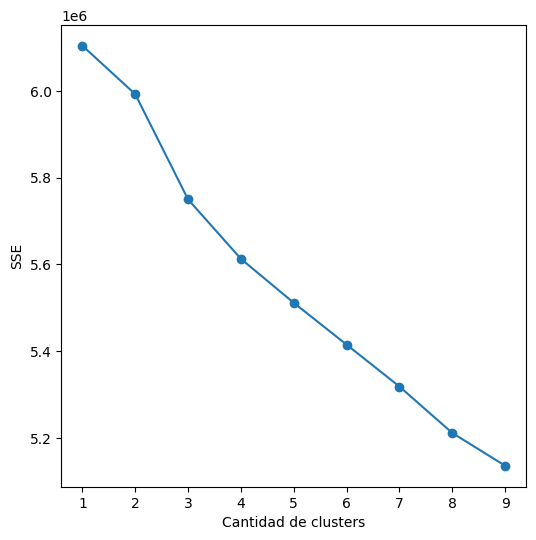

In [77]:
sse = []
list_k = list(range(1, 10))

for k in list_k:
    km = KMeans(n_clusters=k)
    km.fit(properati_predecir_df)
    sse.append(km.inertia_)

# Grafico el SSE por K
plt.figure(figsize=(6, 6))
plt.plot(list_k, sse, '-o')
plt.xlabel(r'Cantidad de clusters')
plt.ylabel('SSE')
plt.show()

De acuerdo al metodo del codo, podemos observar que la pendiente del grafico pareciera quebrarse con 2 clusters. Tambien hay otros valores que vamos a considerar a continuacion, como pueden ser 4 y 6 clusters, entre otros. Vamos a analizar todos y evaluar cual nos arroja los mejores resultados en terminos del numero de silhouette.

#### c) **Calidad sobre los grupos formados**

A primera vista, el metodo del codo nos indicaria que en donde se "quiebra" la linea es en 2 clusters. Probamos con esa cantidad y analizamos el silhuette.

In [78]:
from sklearn.metrics import silhouette_score

dos_clusters = KMeans(n_clusters=2, random_state = 0)
prediccion2 = dos_clusters.fit_predict(properati_predecir_df)

score = silhouette_score (properati_predecir_df, prediccion2)
print ("Para 2 clusters el silhouette score es: " + str(score))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Para 2 clusters el silhouette score es: 0.09965890153529514


Como resulta un poco bajo, probamos con sus numeros "cercanos": 4 y 6 clusters.

In [79]:
from sklearn.metrics import silhouette_score
cuatro_clusters = KMeans(n_clusters=4, random_state = 0)
prediccion4 = cuatro_clusters.fit_predict(properati_predecir_df)

score = silhouette_score (properati_predecir_df, prediccion4)
print ("para 4 clusters el silhouette score es: " + str(score))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


para 4 clusters el silhouette score es: 0.06464538839960317


In [80]:
seis_clusters = KMeans(n_clusters=6, random_state = 0)
prediccion6 = seis_clusters.fit_predict(properati_predecir_df)

score = silhouette_score (properati_predecir_df, prediccion6)
print ("para 6 clusters el silhouette score es: " + str(score))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


para 6 clusters el silhouette score es: 0.035547407034644575


Finalmente, el valor de silhuette que mas se acerca a 1 es el de 2 clusters con un valor de 0.1, entonces es con ese con el que trabajaremos.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but KMeans was fitted with feature names
  warnings.warn(


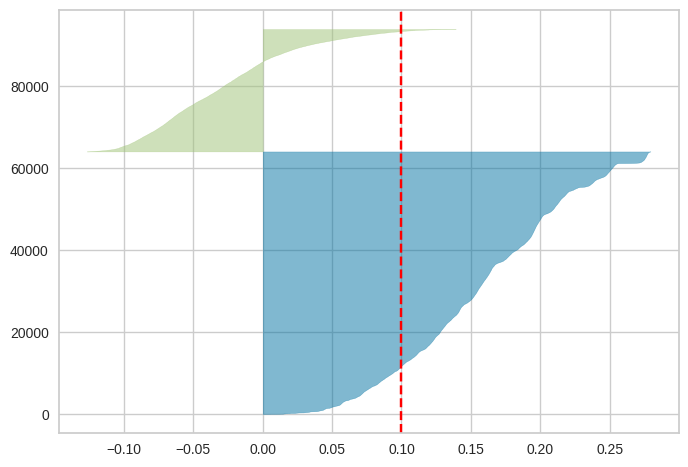

In [81]:
#grafico de visualizacion del silhouette
from yellowbrick.cluster import SilhouetteVisualizer

# Visualizamos el gráfico de silueta
visualizer = SilhouetteVisualizer(dos_clusters, colors='yellowbrick')    # Instancio el visualizador
visualizer.fit(properati_predecir_df)
plt.show()

#### d) **Análisis de cada grupo intentando entender en función de qué características fueron formados**

In [82]:
#agregamos los 2 grupos al dataframe
properati_Kmeans.loc[:,"cluster"] = dos_clusters.labels_

In [83]:
grupos = properati_Kmeans.groupby(by= 'cluster')
print(grupos.size())

cluster
0    64050
1    29853
dtype: int64


ya tenemos nuestros 2 grupos de clusters separados, vamos a buscar relaciones entre los elementos que pertenzcan a los mismos clusters. Para ver si los barrios a los que pertenecen tienen alguna relacion, primero haremos el grafico en el mapa de CABA.

#### e) Grafico de los grupos en el mapa de CABA

In [84]:
#documentacion de mapbox https://plotly.com/python/scattermapbox/
import plotly.express as px

px.scatter_mapbox(
    properati_Kmeans,
    lat="latitud",
    lon="longitud",
    color="cluster",
    color_discrete_map={"0": "turquoise", "1": "green"},
).update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 10,
    },
)

Podemos observar una mayor predominancia de los elementos que pertenecen al grupo 1 en la zona centrica de la capital (pintados de amarillo), hagamos algunos graficos.

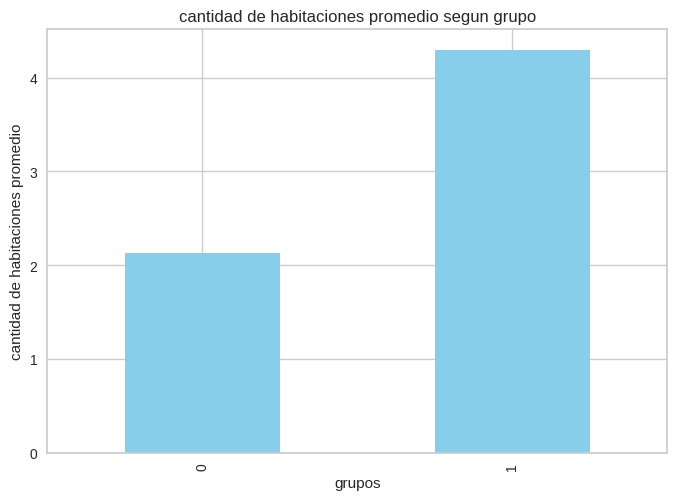

In [85]:
#vamos a ver que tanta influencia tuvo la cantidad de habitaciones para la realizacion de los grupos.
#notar que no usamos el dataframe estandarizado para esto.

(grupos['property_rooms'].mean()).plot(kind='bar', color='skyblue')
plt.xlabel('grupos')
plt.ylabel('cantidad de habitaciones promedio')
plt.title('cantidad de habitaciones promedio segun grupo')
#plt.xticks(rotation=45)
plt.show()

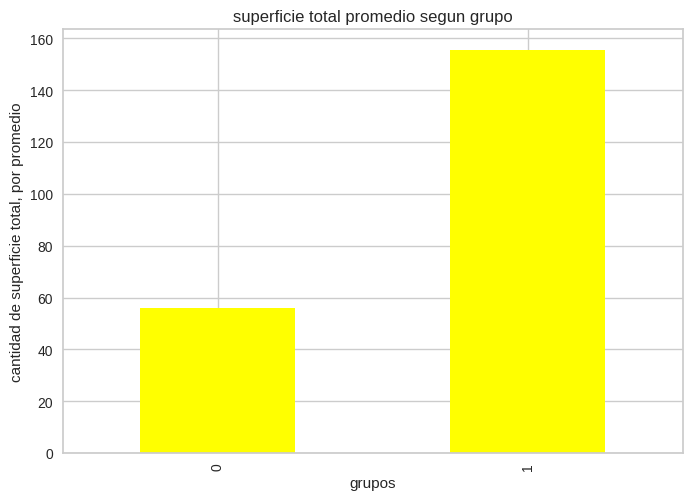

In [86]:
#vamos a ver que tanta influencia tuvo la cantidad de superficie total para la realizacion de los grupos.

(grupos['property_surface_total'].mean()).plot(kind='bar', color='YELLOW')
plt.xlabel('grupos')
plt.ylabel('cantidad de superficie total, por promedio')
plt.title('superficie total promedio segun grupo')
#plt.xticks(rotation=45)
plt.show()

In [87]:
grupos.head()

,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,barrio_Agronomía,barrio_Almagro,barrio_Balvanera,...,barrio_Villa Pueyrredón,barrio_Villa Real,barrio_Villa Riachuelo,barrio_Villa Santa Rita,barrio_Villa Soldati,barrio_Villa Urquiza,barrio_Villa del Parque,property_type_Departamento,property_type_PH,cluster
25,-34.637319,-58.361124,4.0,3.0,171.0,4.0,210000.0,False,False,False,...,False,False,False,False,False,False,False,False,False,1
42,-34.637319,-58.361124,3.0,2.0,58.0,3.0,82900.0,False,False,False,...,False,False,False,False,False,False,False,True,False,0
43,-34.628647,-58.361871,4.0,3.0,70.0,4.0,99000.0,False,False,False,...,False,False,False,False,False,False,False,True,False,1
49,-34.610027,-58.401934,4.0,3.0,118.2,4.0,146000.0,False,False,False,...,False,False,False,False,False,False,False,True,False,1
51,-34.631621,-58.416825,4.0,3.0,118.2,4.0,250000.0,False,False,False,...,False,False,False,False,False,False,False,False,True,1
53,-34.623886,-58.412746,2.0,1.0,61.0,2.0,100000.0,False,False,False,...,False,False,False,False,False,False,False,False,True,0
55,-34.625588,-58.423056,4.0,3.0,104.0,4.0,185000.0,False,False,False,...,False,False,False,False,False,False,False,False,True,1
56,-34.629398,-58.425852,2.0,1.0,62.0,2.0,100000.0,False,False,False,...,False,False,False,False,False,False,False,True,False,0
57,-34.620748,-58.412004,3.0,2.0,59.0,3.0,185000.0,False,False,False,...,False,False,False,False,False,False,False,True,False,0
60,-34.630538,-58.419221,3.0,2.0,50.0,3.0,95000.0,False,False,False,...,False,False,False,False,False,False,False,True,False,0


vamos a graficar algunos barrios que se encuentran en la periferia y algunos que se encuentran en la zona centrica para observar como se distribuyen

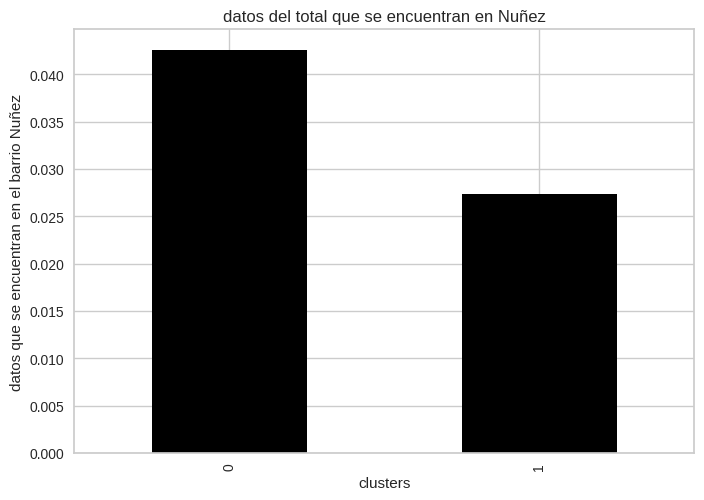

In [88]:
cambiar_a_numerico = properati_Kmeans['barrio_Nuñez'].replace({True: 1, False: 0})
grupo_Nuñez = properati_Kmeans.groupby('cluster')['barrio_Nuñez']
(grupo_Nuñez.mean()).plot(kind='bar', color='black')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Nuñez')
plt.title('datos del total que se encuentran en Nuñez')
plt.show()

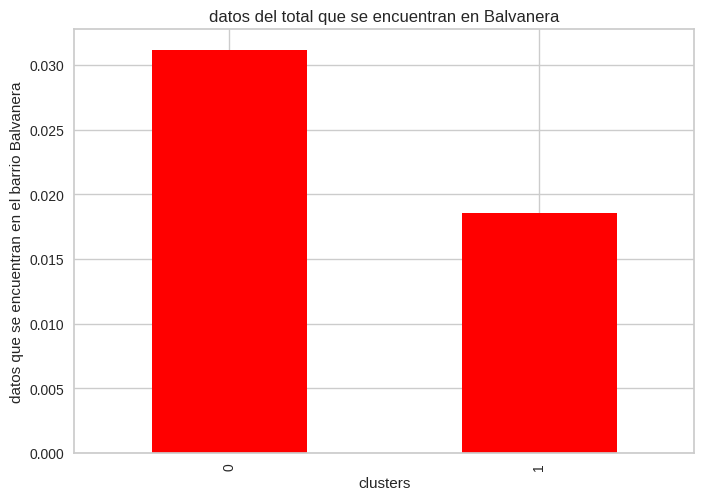

In [89]:
cambiar_a_numerico = properati_Kmeans['barrio_Balvanera'].replace({True: 1, False: 0})
grupo_Balvanera = properati_Kmeans.groupby('cluster')['barrio_Balvanera']
(grupo_Balvanera.mean()).plot(kind='bar', color='red')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Balvanera')
plt.title('datos del total que se encuentran en Balvanera')
plt.show()

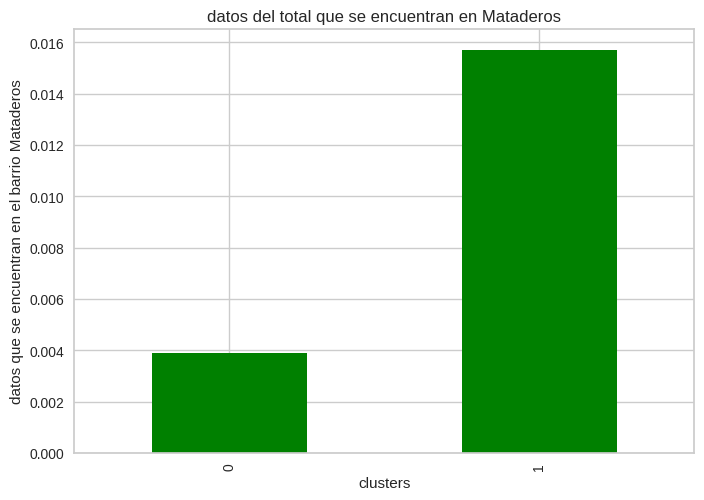

In [90]:
cambiar_a_numerico = properati_Kmeans['barrio_Mataderos'].replace({True: 1, False: 0})
grupo_Mataderos = properati_Kmeans.groupby('cluster')['barrio_Mataderos']
(grupo_Mataderos.mean()).plot(kind='bar', color='green')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Mataderos')
plt.title('datos del total que se encuentran en Mataderos')
plt.show()

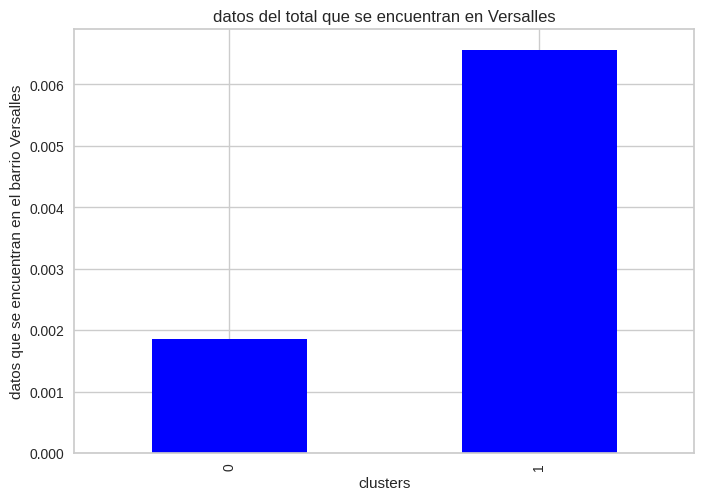

In [91]:
cambiar_a_numerico = properati_Kmeans['barrio_Versalles'].replace({True: 1, False: 0})
grupo_Versalles = properati_Kmeans.groupby('cluster')['barrio_Versalles']
(grupo_Versalles.mean()).plot(kind='bar', color='blue')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Versalles')
plt.title('datos del total que se encuentran en Versalles')
plt.show()

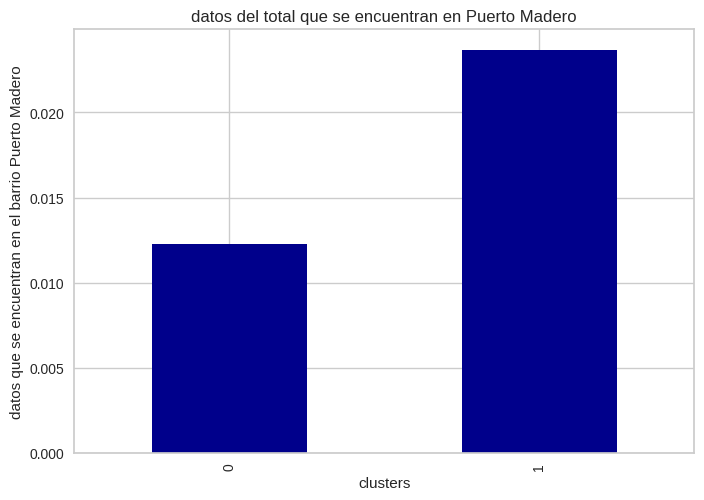

In [92]:
cambiar_a_numerico = properati_Kmeans['barrio_Puerto Madero'].replace({True: 1, False: 0})
grupo_Puerto_Madero = properati_Kmeans.groupby('cluster')['barrio_Puerto Madero']
(grupo_Puerto_Madero.mean()).plot(kind='bar', color='darkblue')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Puerto Madero')
plt.title('datos del total que se encuentran en Puerto Madero')
plt.show()

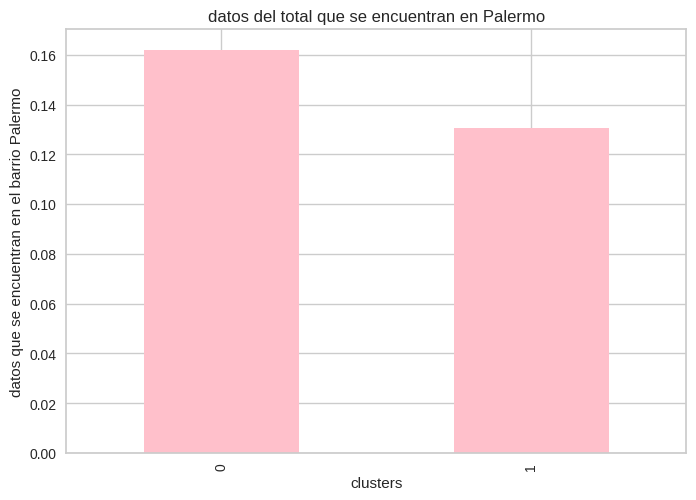

In [93]:
cambiar_a_numerico = properati_Kmeans['barrio_Palermo'].replace({True: 1, False: 0})
grupo_Palermo = properati_Kmeans.groupby('cluster')['barrio_Palermo']
(grupo_Palermo.mean()).plot(kind='bar', color='pink')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Palermo')
plt.title('datos del total que se encuentran en Palermo')
plt.show()

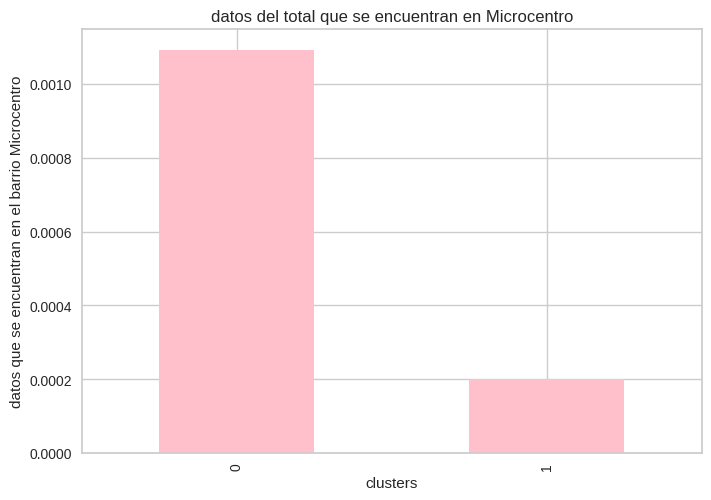

In [94]:
cambiar_a_numerico = properati_Kmeans['barrio_Centro / Microcentro'].replace({True: 1, False: 0})
grupo_Microcentro = properati_Kmeans.groupby('cluster')['barrio_Centro / Microcentro']
(grupo_Microcentro.mean()).plot(kind='bar', color='pink')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Microcentro')
plt.title('datos del total que se encuentran en Microcentro')
plt.show()

Los graficos con respecto a los diferentes barrios dependiendo de si se encuentran en la periferia o en la zona centrica muestran una clusterizacion donde aquellos elementos que pertenecen a un grupo suelen encontrarse en la zona centrica, mientras que aquellos que pertenecen al otro grupo generalmente se van a encontrar mas cerca de la periferia. Tambien podemos observar una tendencia a que los elementos del cluster que representa en mayor proporcion a la zona periferica, tengan una mayor superficie total y una mayor cantidad de habitaciones. Para finalizar, vamos a visualizar el precio promedio de los 2 grupos, nuestra suposicion es que el grupo que predomina en la zona centrica y el que se encuentra en mayor proporcion en zonas como Puerto Madero va a tener un precio promedio mayor de propiedad.

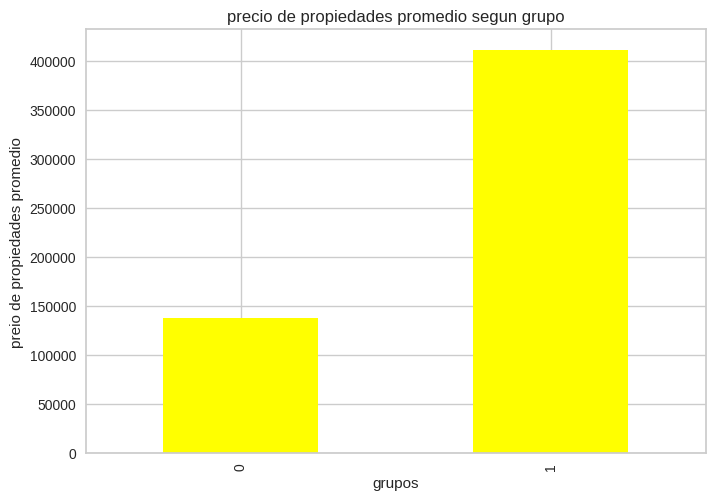

In [95]:
(grupos['property_price'].mean()).plot(kind='bar', color='YELLOW')
plt.xlabel('grupos')
plt.ylabel('preio de propiedades promedio')
plt.title('precio de propiedades promedio segun grupo')
plt.show()

Luego de visto el grafico, concluimos que el precio quiza cobra mayor relevancia sobre la superficie total que poseen, asi tambien como su numero de habitaciones, y no tanto por la zona en la que se encuentran, aunque se ve una leve tendencia sobre algunos barrios con precios altos (como el caso de Puerto Madero).

#### f) **Repeticion del análisis de clustering utilizando sólo 3 grupos**

In [96]:
tres_clusters = KMeans(n_clusters=3, random_state = 0)
prediccion3 = tres_clusters.fit_predict(properati_predecir_df)

score = silhouette_score (properati_predecir_df, prediccion3)
print ("para 3 clusters el silhouette score es: " + str(score))

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning:

The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning



para 3 clusters el silhouette score es: 0.08093800506867954


Notamos que este valor de silhuette score que analizamos hasta el momento tiene un valor de 0.1, similar a los 2 cluster que analizamos previamente.

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning:

X does not have valid feature names, but KMeans was fitted with feature names



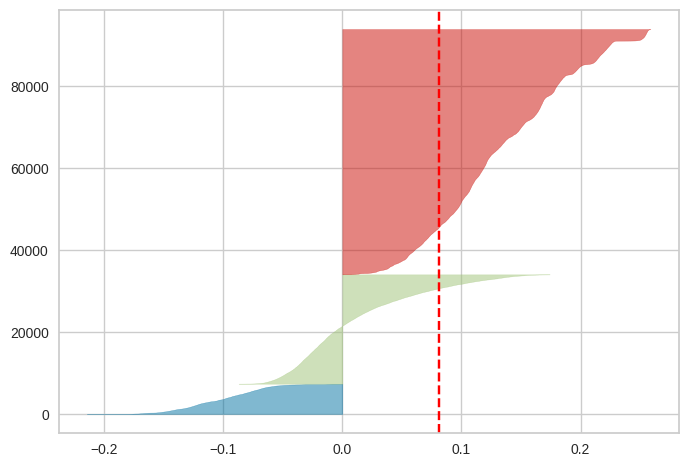

In [97]:
# Visualizamos el gráfico de silueta
visualizer = SilhouetteVisualizer(tres_clusters, colors='yellowbrick')    # Instancio el visualizador
visualizer.fit(properati_predecir_df)
plt.show()

In [98]:
#eliminamos la columna de clusters previamente creada en nuestro dataframe
properati_Kmeans = properati_Kmeans.drop(columns= ['cluster'])

In [99]:
#agregamos los 3 grupos a los dataframes
properati_Kmeans.loc[:,"cluster"] = tres_clusters.labels_

In [100]:
grupos = properati_Kmeans.groupby(by= 'cluster')
print(grupos.size())

cluster
0     7393
1    26673
2    59837
dtype: int64


In [101]:
#documentacion de mapbox https://plotly.com/python/scattermapbox/
import plotly.express as px

px.scatter_mapbox(
    properati_Kmeans,
    lat="latitud",
    lon="longitud",
    color="cluster",
    color_discrete_map={"0": "turquoise", "1": "green", "2": "red"},
).update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 10,
    },
)

#### **Repeticion del analisis de las agrupaciones pero esta vez con 3 clusters**

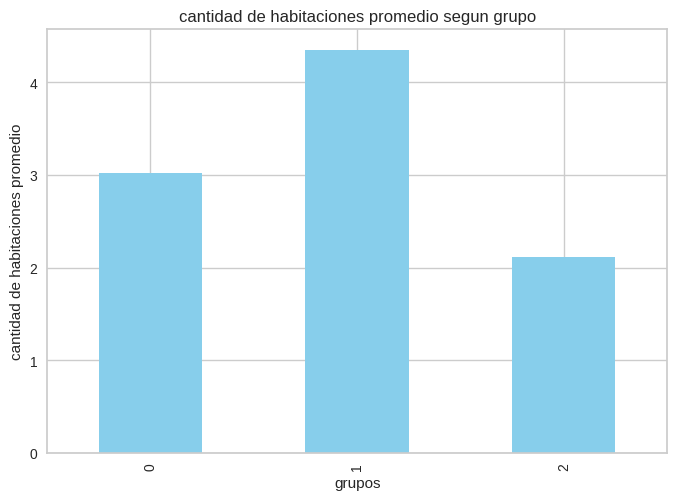

In [102]:
#vamos a ver que tanta influencia tuvo la cantidad de habitaciones para la realizacion de los grupos.
#notar que no usamos el dataframe estandarizado para esto.

(grupos['property_rooms'].mean()).plot(kind='bar', color='skyblue')
plt.xlabel('grupos')
plt.ylabel('cantidad de habitaciones promedio')
plt.title('cantidad de habitaciones promedio segun grupo')
#plt.xticks(rotation=45)
plt.show()

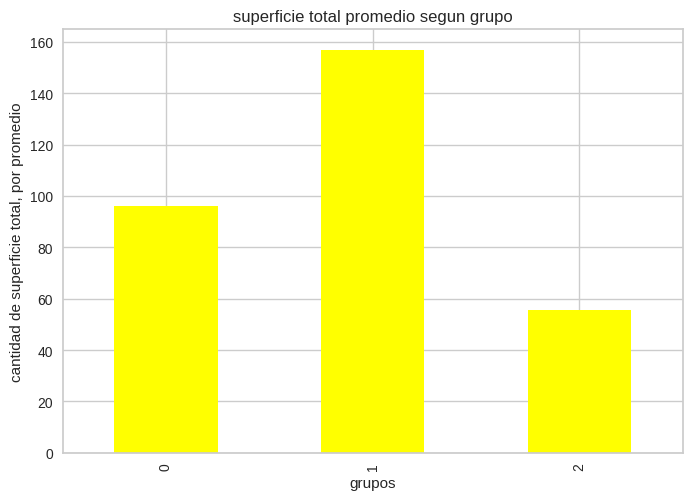

In [103]:
#vamos a ver que tanta influencia tuvo la cantidad de superficie total para la realizacion de los grupos.

(grupos['property_surface_total'].mean()).plot(kind='bar', color='YELLOW')
plt.xlabel('grupos')
plt.ylabel('cantidad de superficie total, por promedio')
plt.title('superficie total promedio segun grupo')
plt.show()

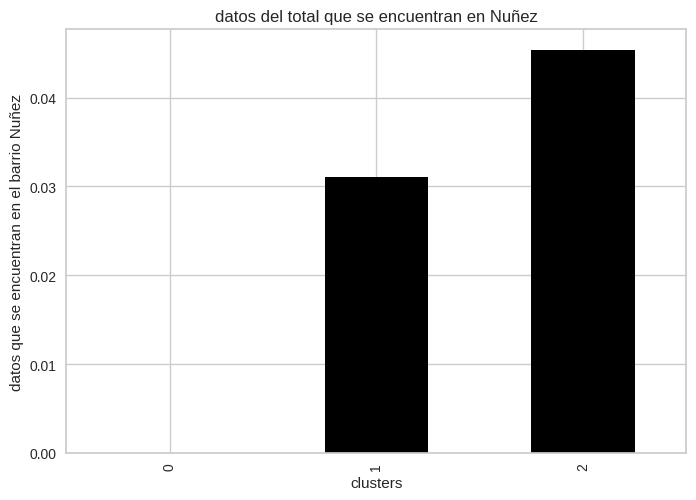

In [104]:
cambiar_a_numerico = properati_Kmeans['barrio_Nuñez'].replace({True: 1, False: 0})
grupo_Nuñez = properati_Kmeans.groupby('cluster')['barrio_Nuñez']
(grupo_Nuñez.mean()).plot(kind='bar', color='black')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Nuñez')
plt.title('datos del total que se encuentran en Nuñez')
plt.show()

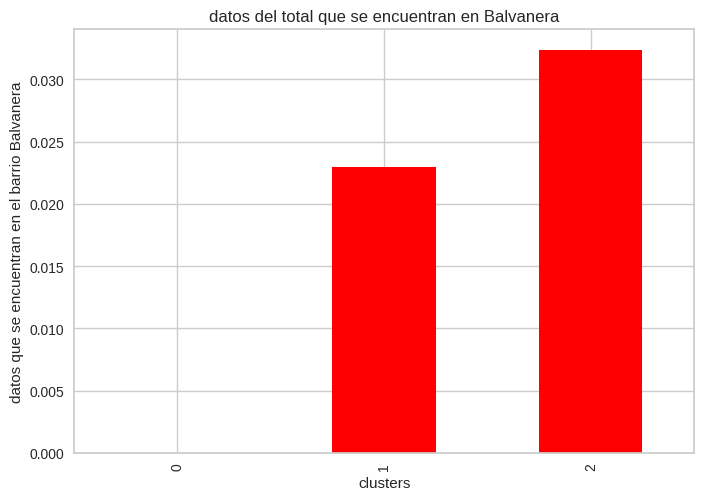

In [105]:
cambiar_a_numerico = properati_Kmeans['barrio_Balvanera'].replace({True: 1, False: 0})
grupo_Balvanera = properati_Kmeans.groupby('cluster')['barrio_Balvanera']
(grupo_Balvanera.mean()).plot(kind='bar', color='red')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Balvanera')
plt.title('datos del total que se encuentran en Balvanera')
plt.show()

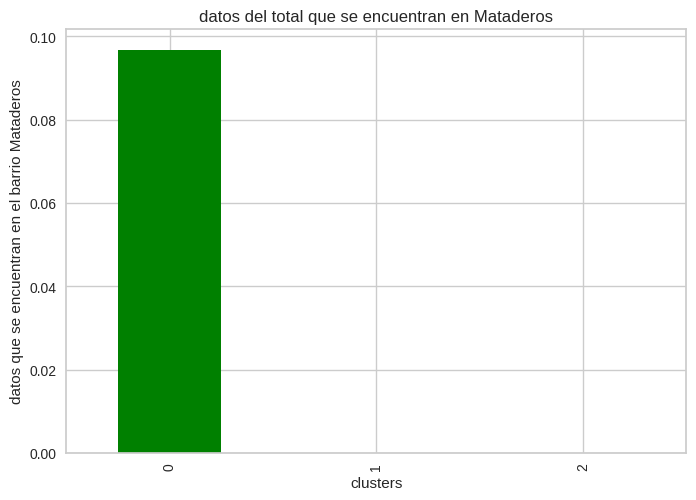

In [106]:
cambiar_a_numerico = properati_Kmeans['barrio_Mataderos'].replace({True: 1, False: 0})
grupo_Mataderos = properati_Kmeans.groupby('cluster')['barrio_Mataderos']
(grupo_Mataderos.mean()).plot(kind='bar', color='green')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Mataderos')
plt.title('datos del total que se encuentran en Mataderos')
plt.show()

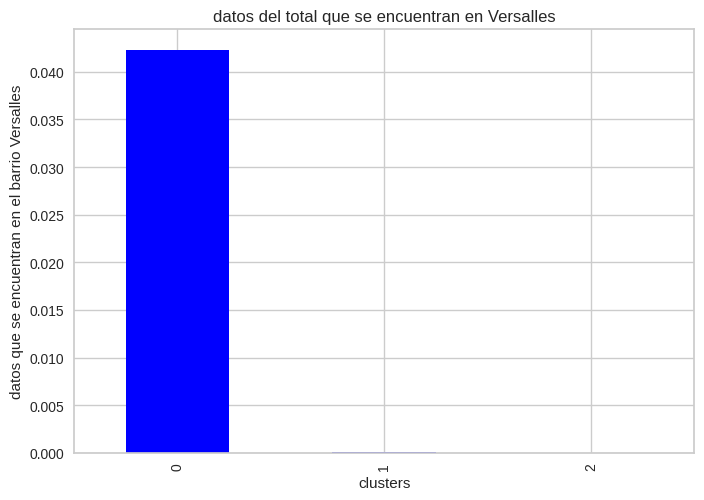

In [107]:
cambiar_a_numerico = properati_Kmeans['barrio_Versalles'].replace({True: 1, False: 0})
grupo_Versalles = properati_Kmeans.groupby('cluster')['barrio_Versalles']
(grupo_Versalles.mean()).plot(kind='bar', color='blue')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Versalles')
plt.title('datos del total que se encuentran en Versalles')
plt.show()

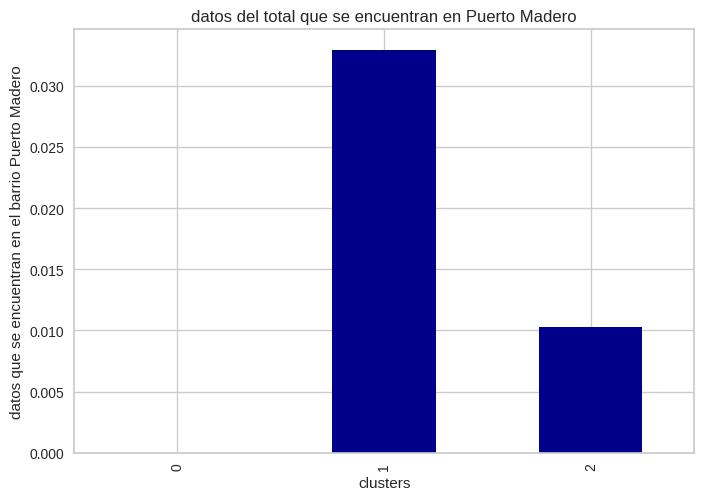

In [108]:
cambiar_a_numerico = properati_Kmeans['barrio_Puerto Madero'].replace({True: 1, False: 0})
grupo_Puerto_Madero = properati_Kmeans.groupby('cluster')['barrio_Puerto Madero']
(grupo_Puerto_Madero.mean()).plot(kind='bar', color='darkblue')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Puerto Madero')
plt.title('datos del total que se encuentran en Puerto Madero')
plt.show()

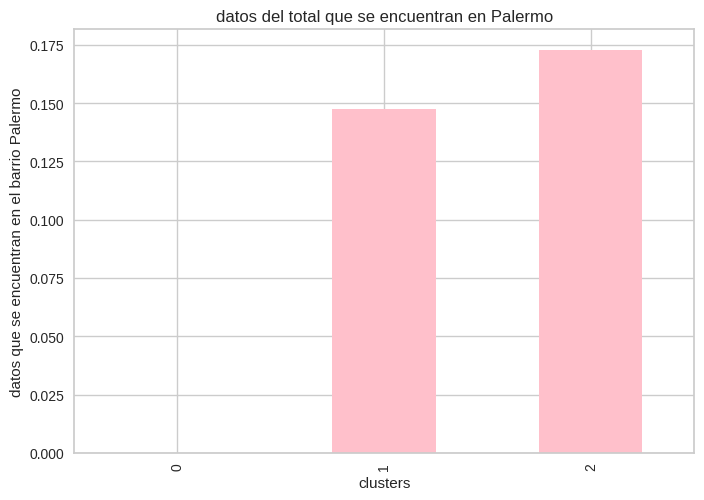

In [109]:
cambiar_a_numerico = properati_Kmeans['barrio_Palermo'].replace({True: 1, False: 0})
grupo_Palermo = properati_Kmeans.groupby('cluster')['barrio_Palermo']
(grupo_Palermo.mean()).plot(kind='bar', color='pink')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Palermo')
plt.title('datos del total que se encuentran en Palermo')
plt.show()

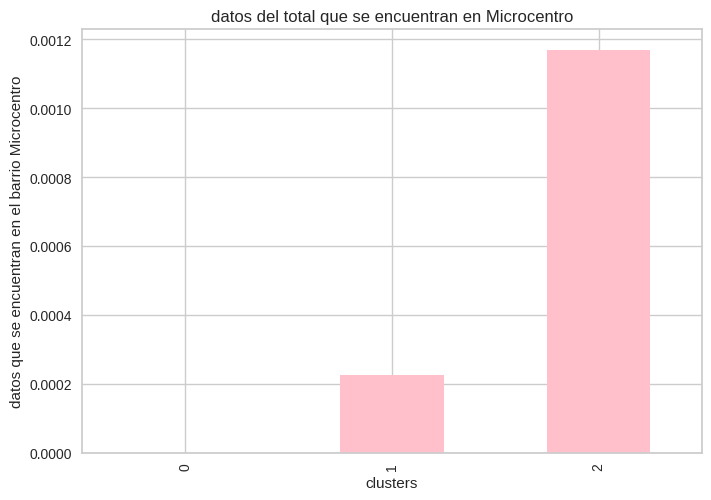

In [110]:
cambiar_a_numerico = properati_Kmeans['barrio_Centro / Microcentro'].replace({True: 1, False: 0})
grupo_Microcentro = properati_Kmeans.groupby('cluster')['barrio_Centro / Microcentro']
(grupo_Microcentro.mean()).plot(kind='bar', color='pink')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Microcentro')
plt.title('datos del total que se encuentran en Microcentro')
plt.show()

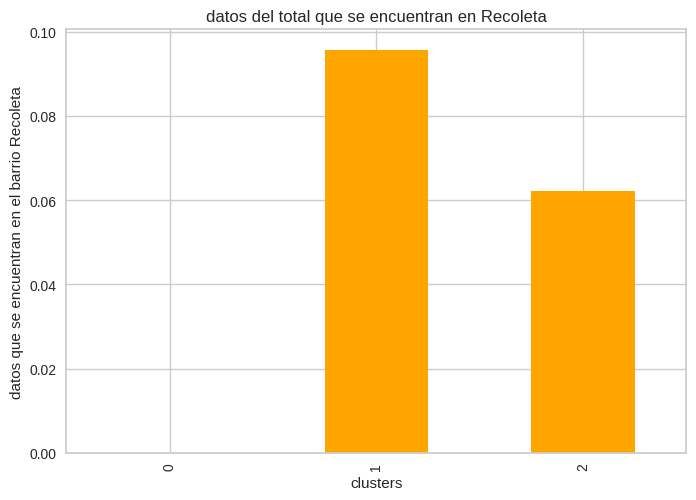

In [111]:
cambiar_a_numerico = properati_Kmeans['barrio_Recoleta'].replace({True: 1, False: 0})
grupo_Recoleta = properati_Kmeans.groupby('cluster')['barrio_Recoleta']
(grupo_Recoleta.mean()).plot(kind='bar', color='orange')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Recoleta')
plt.title('datos del total que se encuentran en Recoleta')
plt.show()

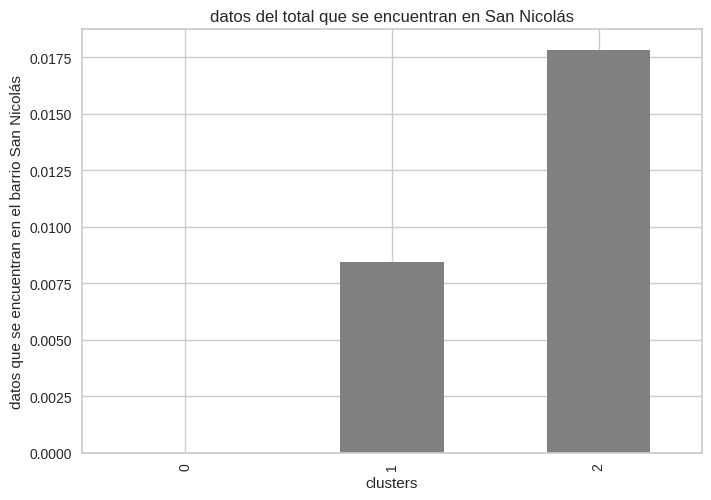

In [112]:
cambiar_a_numerico = properati_Kmeans['barrio_San Nicolás'].replace({True: 1, False: 0})
grupo_San_Nicolás = properati_Kmeans.groupby('cluster')['barrio_San Nicolás']
(grupo_San_Nicolás.mean()).plot(kind='bar', color='grey')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio San Nicolás')
plt.title('datos del total que se encuentran en San Nicolás')
plt.show()

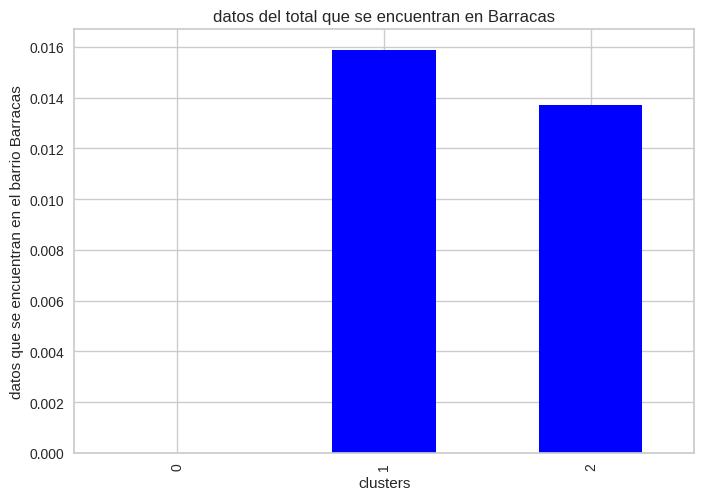

In [113]:
cambiar_a_numerico = properati_Kmeans['barrio_Barracas'].replace({True: 1, False: 0})
grupo_Barracas = properati_Kmeans.groupby('cluster')['barrio_Barracas']
(grupo_Barracas.mean()).plot(kind='bar', color='blue')
plt.xlabel('clusters')
plt.ylabel('datos que se encuentran en el barrio Barracas')
plt.title('datos del total que se encuentran en Barracas')
plt.show()

El resultado final, visto tanto por los graficos como por el mapa, es que al tener 3 agrupaciones, hay una que se concentra sobre la periferia sur de la ciudad de buenos aires, en barrios como 'mataderos' o 'Versalles'. Los otros 2 grupos parecen respetar la separacion que vimos cuando utilizamos unicamente 2 clusters.
Podriamos considerar esta zona nueva como una que tiene precios menores a los de las zonas centricas o turisticas. Vamos a graficar los precios y las diferentes propiedades para ver si nuestras suposiciones son correctas.

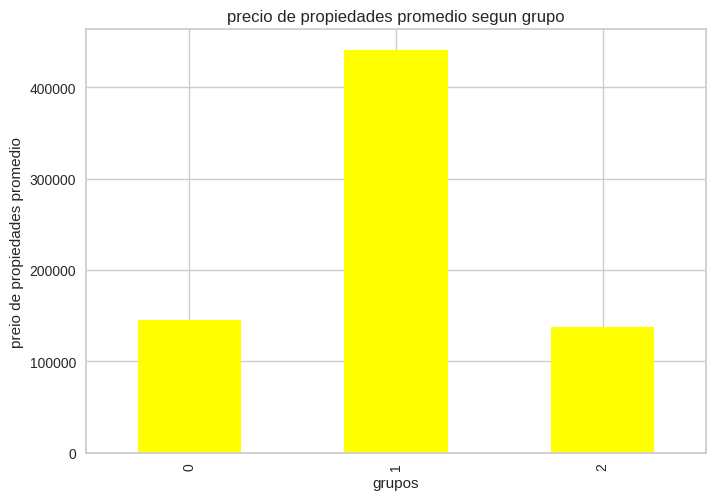

In [114]:
(grupos['property_price'].mean()).plot(kind='bar', color='YELLOW')
plt.xlabel('grupos')
plt.ylabel('preio de propiedades promedio')
plt.title('precio de propiedades promedio segun grupo')
plt.show()

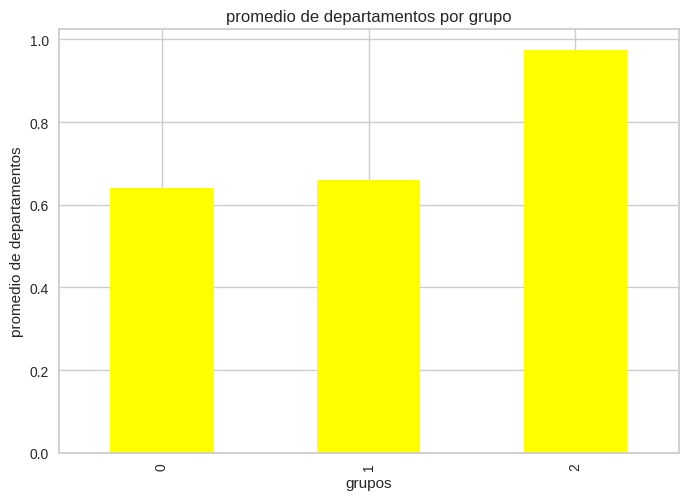

In [115]:
(grupos['property_type_Departamento'].mean()).plot(kind='bar', color='YELLOW')
plt.xlabel('grupos')
plt.ylabel('promedio de departamentos')
plt.title('promedio de departamentos por grupo')
plt.show()

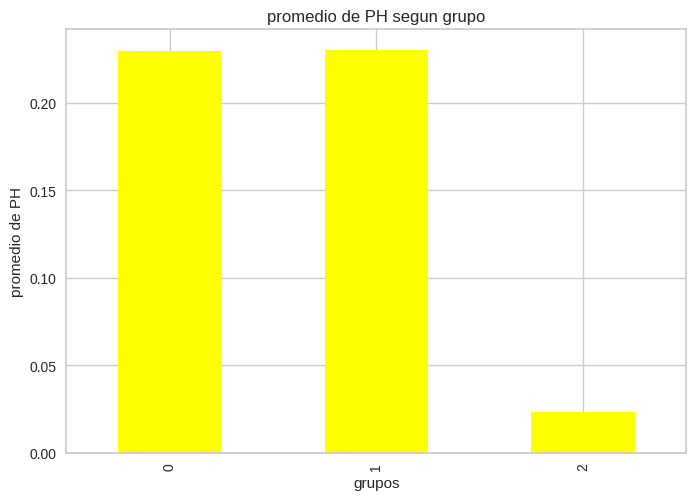

In [116]:
(grupos['property_type_PH'].mean()).plot(kind='bar', color='YELLOW')
plt.xlabel('grupos')
plt.ylabel('promedio de PH')
plt.title('promedio de PH segun grupo')
plt.show()

Como conclusion vemos una clara tendencia del grupo formado sobre la zona centrica y cercana al rio con un aumento en los precios de dichas propiedades, como es el caso del cluster que tiene la mayor cantidad de datos sobre zonas como 'Recoleta' o 'Puerto Madero'. Con 3 grupos la diferenciacion se hace mas evidente y confirmamos nuestras suposiciones.

## 3. Clasificacion

a) Construcción del target

Para esta tarea se debe crear una nueva variable tipo_precio que tendrá tres categorías:
alto, medio, bajo. Esta nueva variable será nuestra clase en el problema de clasificación.
Para determinar cuándo el tipo_precio de una propiedad es alto, medio o bajo se deberá
analizar el precio por metro cuadrado (pxm2). Se propone evaluar las siguientes
alternativas para establecer los límites de cada categoría:
1. Dividir la variable pxm2 en 3 intervalos con igual cantidad de observaciones.

2. Dividir la variable pxm2 en 3 intervalos, el primero con el 25% de las observaciones, el siguiente con el 50% y el último con el 25% de las observaciones restantes.

3. Trabajar la variable pxm2 relativa a cada tipo de propiedad y luego dividirla como en
el punto anterior.

Se pide:

a. Mostrar la distribución del precio por metro cuadrado

b. Mostrar la distribución del precio por metro cuadrado por tipo de propiedad

c. Para cada una de las tres alternativas mostrar gráficamente la distribución de la
nueva variable creada tipo_precio.

d. Seleccionar una de las alternativas, justificando la misma.

e. Comparar, si aplica, la alternativa seleccionada con la división en 3 grupos obtenida
utilizando agrupamiento por K Means.

f. Mostrar en un mapa de CABA los avisos coloreados por tipo_precio

b) Entrenamiento y Predicción

Predecir el valor del atributo tipo_precio, excluyendo del entrenamiento la variable price,
pxm2 y cualquier otra que pueda contener información del precio de venta. Para todos los
modelos se pide realizar las tareas de ingeniería de características necesarias para trabajar
con cada algoritmo (encoding, normalización, etc).

Modelo 1 : Árbol de decisión

a. Construir un árbol de decisión y optimizar sus hiperparámetros mediante k-fold Cross
Validation para obtener la mejor performance. ¿Cuántos folds utilizaron? ¿Qué
métrica consideran adecuada para buscar los parámetros?
b. Graficar el árbol de decisión con mejor performance encontrado en el punto anterior.
Si es muy extenso mostrar una porción representativa.
c. Analizar el árbol de decisión seleccionado describiendo los atributos elegidos, y
decisiones evaluadas (explicar las primeras reglas obtenidas).
d. Evaluar la performance del árbol en el conjunto de evaluación, explicar todas las
métricas y mostrar la matriz de confusión. Comparar con la performance de
entrenamiento.

Modelo 2: Random Forest

a. Construir un clasificador RF y optimizar sus hiperparámetros mediante k-fold Cross
Validation para obtener la mejor performance. ¿Cuántos folds utilizaron? ¿Qué
métrica consideran adecuada para buscar los parámetros?
b. Analizar la importancia de los atributos
c. Mostrar la conformación final de uno de los árboles generados. Si es muy extenso
mostrar una porción representativa y explicar las primeras reglas.
d. Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las
métricas y mostrar la matriz de confusión. Comparar con la performance de
entrenamiento.

Modelo 3: a elección

a. En este punto se debe entrenar (mediante cross-validation) un modelo elegido por el
grupo. Se debe evaluar su performance en entrenamiento y sobre el conjunto de
evaluación, explicar todas las métricas y mostrar la matriz de confusión.

### a) **Construccion del target**

comencemos creando una nueva columna que sera nuestra variable tipo_precio. Para esto vamos a calcular el precio por metro cuadrado usando todos los datos que tenemos a disposicion.

In [117]:
filas, _ = properati_final.shape

In [118]:
#creemos nuestra variable pxm2.
properati_final['pxm2'] = properati_final['property_price'] / properati_final['property_surface_total']

veamos nuestra nueva columna

In [119]:
properati_final.head(10)

,id,start_date,end_date,created_on,latitud,longitud,barrio,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,pxm2
25,CyZu6IaZgmQYGk8jmPajCg==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,Boca,Casa,4.0,3.0,171.0,4.0,210000.0,VENTA CASA LLAVE EN MANO - COSTA ESMERALDA,1228.070175
42,d3Z0MblSb2IMBoOBMGJEEQ==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,Boca,Departamento,3.0,2.0,58.0,3.0,82900.0,VENTA TRES AMBIENTES LA BOCA PISO ALTO,1429.310345
43,rL7qPkQnomsMGu2ViS3sBw==,2021-09-09,2021-09-28,2021-09-09,-34.628647,-58.361871,Boca,Departamento,4.0,3.0,70.0,4.0,99000.0,Departamento - 4 Ambientes - Catalinas Sur,1414.285714
49,vuX/ccLAMVml4qWRFcOJUA==,2021-09-09,2022-01-05,2021-09-09,-34.610027,-58.401934,Once,Departamento,4.0,3.0,118.2,4.0,146000.0,Venta departamento 4 ambientes Once,1235.194585
51,ZTtSCeqZ3HUgf5jjwEzRcw==,2021-09-09,2022-03-09,2021-09-09,-34.631621,-58.416825,Boedo,PH,4.0,3.0,118.2,4.0,250000.0,PH - Boedo,2115.059222
53,3XhGN1xIqtzxywrDb3vC/w==,2021-09-09,2022-01-27,2021-09-09,-34.623886,-58.412746,Boedo,PH,2.0,1.0,61.0,2.0,100000.0,PH 2 Ambientes c/Patio HECHO A NUEVO,1639.344262
55,zIXYgKHTdJ5HFYpZ8oROeQ==,2021-09-09,2021-09-19,2021-09-09,-34.625588,-58.423056,Boedo,PH,4.0,3.0,104.0,4.0,185000.0,PH Venta PH 3 ambientes + Patio + Terraza Divino,1778.846154
56,ahcEMvB66wjPz0SYWZQDBw==,2021-09-09,2021-09-26,2021-09-09,-34.629398,-58.425852,Boedo,Departamento,2.0,1.0,62.0,2.0,100000.0,VENTA 2 ambientes EN DUPLEX sin Expensas en Boedo,1612.903226
57,M0g0l0s6S13X+cZlGkUo8g==,2021-09-09,2021-09-19,2021-09-09,-34.620748,-58.412004,Boedo,Departamento,3.0,2.0,59.0,3.0,185000.0,Venta depto 3 amb Boedo cochera fija y amenities.,3135.593220
58,tgaK6Ibor1zLY5bvNxsXfw==,2021-09-09,2021-09-26,2021-09-09,-34.633730,-58.424729,Boedo,Casa,10.0,9.0,394.0,10.0,500000.0,VENTA CASA BOEDO LOCAL DEPARTAMENTOS HABITACI...,1269.035533


In [120]:
properati_final = properati_final.query('pxm2 < 310000') #habia un outlier
columna_pxm2 = properati_final['pxm2']

In [121]:
print(columna_pxm2)

25        1228.070175
42        1429.310345
43        1414.285714
49        1235.194585
51        2115.059222
             ...     
460072    1692.307692
460073    2367.647059
460074    1480.392157
460075    2013.513514
460090    1607.142857
Name: pxm2, Length: 94073, dtype: float64


#### a. Distribucion por metro cuadrado

Vamos a mostrar las distribuciones de la variable pxm2.

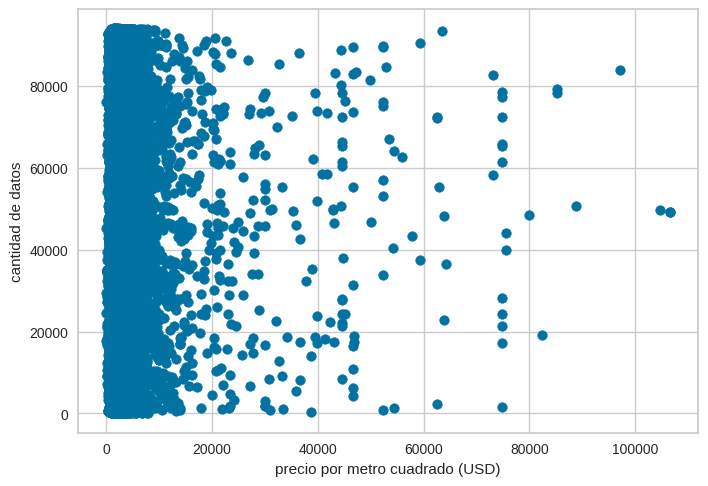

In [122]:
#Grafico de distribucion de pxm2

plt.scatter(properati_final['pxm2'], range(len(properati_final['pxm2'])))
plt.xlabel('precio por metro cuadrado (USD)')
plt.ylabel('cantidad de datos')
plt.show()

#### b. Distribucion del metro cuadrado por tipo de propiedad

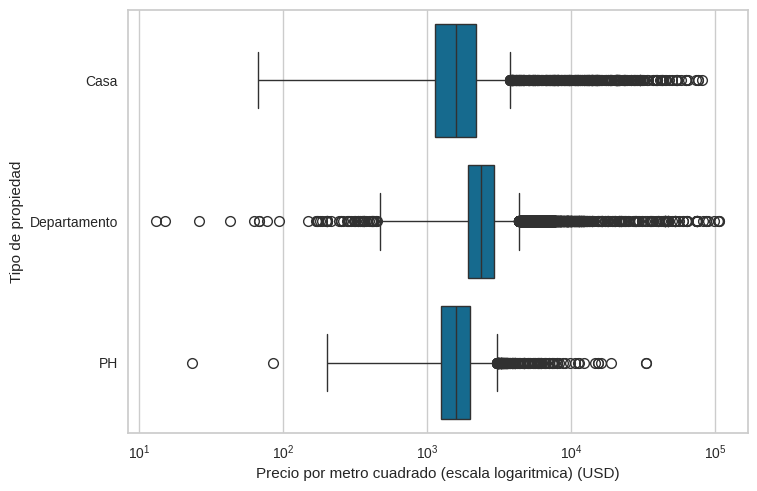

In [123]:
sns.boxplot(x='pxm2', y='property_type', data=properati_final)
plt.xlabel('Precio por metro cuadrado (escala logaritmica) (USD)')
plt.ylabel('Tipo de propiedad')
plt.xscale('log')
plt.show()

#### *Creacion de variable 'tipo_precio'*

Continuamos encontrando nuestros limites para dividir nuestra variable categorica tipo_precio.

In [124]:
columna_pxm2 = columna_pxm2.sort_values()
print(columna_pxm2)

117827        12.987013
221731        14.939759
141092        23.051867
376985        25.773196
85394         42.734615
              ...      
248285     88888.888889
413786     97173.144876
243285    104651.162791
241401    106589.147287
241326    106589.147287
Name: pxm2, Length: 94073, dtype: float64


Tenemos nuestra columna de pxm2 ordenada de menor a mayor con todos nuestros elementos, vamos a dividirlo en 3 ahora.

In [125]:
cantidad_datos = columna_pxm2.size
print(cantidad_datos)

94073


In [126]:
primer_tercio = columna_pxm2.iloc[:int(cantidad_datos/3)]
segundo_tercio = columna_pxm2.iloc[int(cantidad_datos/3) : int(2*(cantidad_datos)/3)]
tercer_tercio = columna_pxm2.iloc[int(2*(cantidad_datos)/3) :]

In [127]:
print(primer_tercio.head(2))
print(segundo_tercio.head(2))
print(tercer_tercio.head(2))

117827    12.987013
221731    14.939759
Name: pxm2, dtype: float64
406907    1951.219512
330221    1951.219512
Name: pxm2, dtype: float64
229185    2593.75
291978    2593.75
Name: pxm2, dtype: float64


In [128]:
print(primer_tercio.max())

1951.219512195122


In [129]:
print(segundo_tercio.min())
print(segundo_tercio.max())

1951.219512195122
2593.75


In [130]:
print(tercer_tercio.min())
print(tercer_tercio.max())

2593.75
106589.14728682171


In [131]:
limite_bajo = primer_tercio.max()
limite_medio = segundo_tercio.max()
limite_alto = tercer_tercio.max()
print("el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y " + str(round(limite_bajo)))
print("el valor de nuestro precio que vamos a considerar medio tomara valores entre " + str(round(limite_bajo)) + " y "  + str(round(limite_medio)))
print("el valor de nuestro precio que vamos a considerar alto tomara valores entre " + str(round(limite_medio)) + " y "  + str(round(limite_alto)))

el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y 1951
el valor de nuestro precio que vamos a considerar medio tomara valores entre 1951 y 2594
el valor de nuestro precio que vamos a considerar alto tomara valores entre 2594 y 106589


Ya tenemos nuestros limites para crear nuestra variable categorica 'tipo_precio', vamos a crearla.

In [132]:
separaciones = [0, limite_bajo, limite_medio, limite_alto]
properati_final['tipo_precio'] = pd.cut(columna_pxm2,
                      bins=separaciones,
                      labels=['Bajo', 'Medio', 'Alto'])

In [133]:
print(properati_final['tipo_precio'])

25         Bajo
42         Bajo
43         Bajo
49         Bajo
51        Medio
          ...  
460072     Bajo
460073    Medio
460074     Bajo
460075    Medio
460090     Bajo
Name: tipo_precio, Length: 94073, dtype: category
Categories (3, object): ['Bajo' < 'Medio' < 'Alto']


In [134]:
grupos_precio = properati_final.groupby(by= 'tipo_precio')
print(grupos_precio.size())

tipo_precio
Bajo     31391
Medio    31326
Alto     31356
dtype: int64


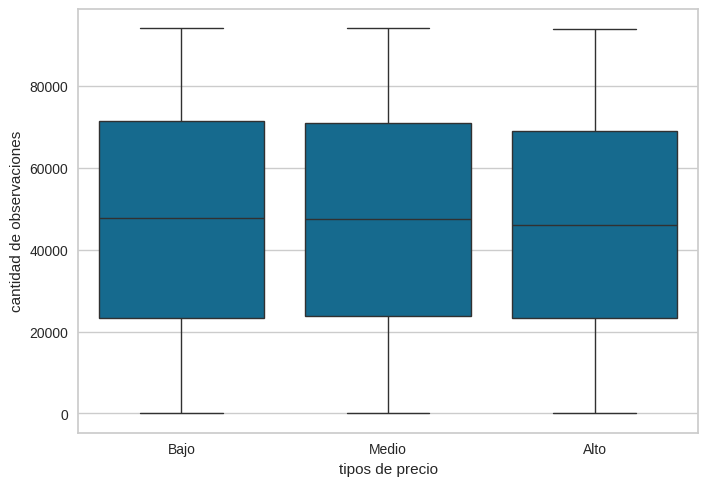

In [135]:
sns.boxplot(x='tipo_precio', y=range(len(properati_final['tipo_precio'])) , data=properati_final)
plt.xlabel('tipos de precio')
plt.ylabel('cantidad de observaciones')
plt.show()

Ya evaluamos el caso haciendo una separacion en 3 partes de igual cantidad de elementos, procedamos a hacer otro tipo de separacion a traves de una separacion 25/50/25

In [136]:
primer_tercio = columna_pxm2.iloc[:int(cantidad_datos * 0.25)]
segundo_tercio = columna_pxm2.iloc[int(cantidad_datos * 0.25) : int(cantidad_datos * 0.75)]
tercer_tercio = columna_pxm2.iloc[int(cantidad_datos * 0.75) :]

In [137]:
print(primer_tercio.head(2))
print(segundo_tercio.head(2))
print(tercer_tercio.head(2))

117827    12.987013
221731    14.939759
Name: pxm2, dtype: float64
115406    1791.666667
416303    1791.666667
Name: pxm2, dtype: float64
431284    2804.347826
273478    2804.347826
Name: pxm2, dtype: float64


In [138]:
print(primer_tercio.max())

1791.6666666666667


In [139]:
print(segundo_tercio.min())
print(segundo_tercio.max())

1791.6666666666667
2804.3478260869565


In [140]:
print(tercer_tercio.min())
print(tercer_tercio.max())

2804.3478260869565
106589.14728682171


In [141]:
limite_bajo = primer_tercio.max()
limite_medio = segundo_tercio.max()
limite_alto = tercer_tercio.max()
print("el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y " + str(round(limite_bajo)))
print("el valor de nuestro precio que vamos a considerar medio tomara valores entre " + str(round(limite_bajo)) + " y "  + str(round(limite_medio)))
print("el valor de nuestro precio que vamos a considerar alto tomara valores entre " + str(round(limite_medio)) + " y "  + str(round(limite_alto)))

el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y 1792
el valor de nuestro precio que vamos a considerar medio tomara valores entre 1792 y 2804
el valor de nuestro precio que vamos a considerar alto tomara valores entre 2804 y 106589


Repetimos el proceso de creacion de la variable 'tipo_precio'.

In [142]:
separaciones = [0, limite_bajo, limite_medio, limite_alto]
properati_final['tipo_precio'] = pd.cut(columna_pxm2,
                      bins=separaciones,
                      labels=['Bajo', 'Medio', 'Alto'])

In [143]:
print(properati_final['tipo_precio'])

25         Bajo
42         Bajo
43         Bajo
49         Bajo
51        Medio
          ...  
460072     Bajo
460073    Medio
460074     Bajo
460075    Medio
460090     Bajo
Name: tipo_precio, Length: 94073, dtype: category
Categories (3, object): ['Bajo' < 'Medio' < 'Alto']


In [144]:
grupos_precio = properati_final.groupby(by= 'tipo_precio')
print(grupos_precio.size())

tipo_precio
Bajo     23531
Medio    47026
Alto     23516
dtype: int64


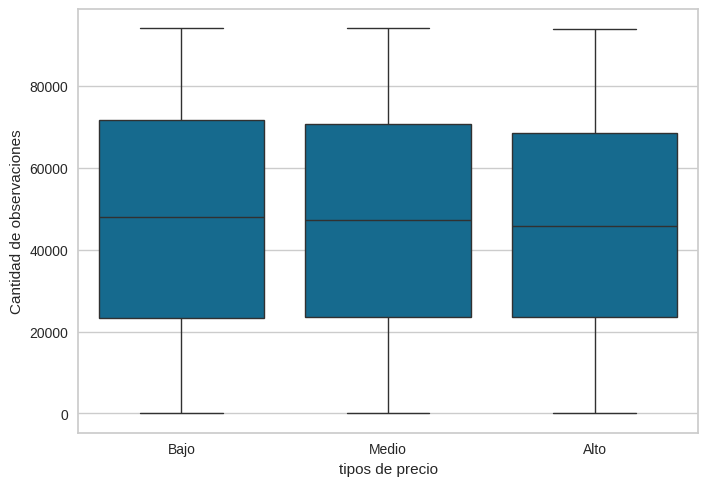

In [145]:
sns.boxplot(x='tipo_precio', y=range(len(properati_final['tipo_precio'])) , data=properati_final)
plt.xlabel('tipos de precio')
plt.ylabel('Cantidad de observaciones')
plt.show()

Para finalizar, realizamos el mismo proceso pero habiendo separado segun las diferentes propiedades que tenemos.

In [146]:
tipos_de_propiedades = properati_final.groupby('property_type')
print(tipos_de_propiedades.size())

property_type
Casa             4077
Departamento    80738
PH               9258
dtype: int64


separamos en los 3 casos.

In [147]:
caso_Casa = properati_final[properati_final['property_type'] == 'Casa']
caso_Casa.head(2)

,id,start_date,end_date,created_on,latitud,longitud,barrio,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,pxm2,tipo_precio
25,CyZu6IaZgmQYGk8jmPajCg==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,Boca,Casa,4.0,3.0,171.0,4.0,210000.0,VENTA CASA LLAVE EN MANO - COSTA ESMERALDA,1228.070175,Bajo
58,tgaK6Ibor1zLY5bvNxsXfw==,2021-09-09,2021-09-26,2021-09-09,-34.633730,-58.424729,Boedo,Casa,10.0,9.0,394.0,10.0,500000.0,VENTA CASA BOEDO LOCAL DEPARTAMENTOS HABITACI...,1269.035533,Bajo


In [148]:
caso_PH = properati_final[properati_final['property_type'] == 'PH']
caso_PH.head(2)

,id,start_date,end_date,created_on,latitud,longitud,barrio,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,pxm2,tipo_precio
51,ZTtSCeqZ3HUgf5jjwEzRcw==,2021-09-09,2022-03-09,2021-09-09,-34.631621,-58.416825,Boedo,PH,4.0,3.0,118.2,4.0,250000.0,PH - Boedo,2115.059222,Medio
53,3XhGN1xIqtzxywrDb3vC/w==,2021-09-09,2022-01-27,2021-09-09,-34.623886,-58.412746,Boedo,PH,2.0,1.0,61.0,2.0,100000.0,PH 2 Ambientes c/Patio HECHO A NUEVO,1639.344262,Bajo


In [149]:
caso_Departamento = properati_final[properati_final['property_type'] == 'Departamento']
caso_Departamento.head(2)

,id,start_date,end_date,created_on,latitud,longitud,barrio,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,property_title,pxm2,tipo_precio
42,d3Z0MblSb2IMBoOBMGJEEQ==,2021-09-09,2021-09-26,2021-09-09,-34.637319,-58.361124,Boca,Departamento,3.0,2.0,58.0,3.0,82900.0,VENTA TRES AMBIENTES LA BOCA PISO ALTO,1429.310345,Bajo
43,rL7qPkQnomsMGu2ViS3sBw==,2021-09-09,2021-09-28,2021-09-09,-34.628647,-58.361871,Boca,Departamento,4.0,3.0,70.0,4.0,99000.0,Departamento - 4 Ambientes - Catalinas Sur,1414.285714,Bajo


#### c. Para cada una de las tres alternativas mostrar gráficamente la distribución de la nueva variable creada tipo_precio.

##### Separacion de variable 'tipo_precio' segun el tipo de propiedad en tres partes iguales.

Procedemos a separar cada una en 3 partes de igual cantidad y ver como quedan los resultados. Luego lo haremos con la distribucion 25/50/25

###### *Caso Casas*

In [150]:
columna_pxm2 = caso_Casa['pxm2']
cantidad_datos = columna_pxm2.size

In [151]:
columna_pxm2 = columna_pxm2.sort_values()
print(columna_pxm2)

101465       66.666667
130465       93.189964
130483      110.000000
34732       133.333333
138208      160.000000
              ...     
177107    64220.183486
407395    73043.478261
193831    75528.700906
214911    75528.700906
237575    80000.000000
Name: pxm2, Length: 4077, dtype: float64


In [152]:
primer_tercio = columna_pxm2.iloc[:int(cantidad_datos/3)]
segundo_tercio = columna_pxm2.iloc[int(cantidad_datos/3) : int(2*(cantidad_datos)/3)]
tercer_tercio = columna_pxm2.iloc[int(2*(cantidad_datos)/3) :]

In [153]:
print(primer_tercio.head(2))
print(segundo_tercio.head(2))
print(tercer_tercio.head(2))

101465    66.666667
130465    93.189964
Name: pxm2, dtype: float64
194897    1277.027027
294335    1277.027027
Name: pxm2, dtype: float64
333088    1909.090909
68693     1909.090909
Name: pxm2, dtype: float64


In [154]:
limite_bajo = primer_tercio.max()
limite_medio = segundo_tercio.max()
limite_alto = tercer_tercio.max()
print("el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y " + str(round(limite_bajo)))
print("el valor de nuestro precio que vamos a considerar medio tomara valores entre " + str(round(limite_bajo)) + " y "  + str(round(limite_medio)))
print("el valor de nuestro precio que vamos a considerar alto tomara valores entre " + str(round(limite_medio)) + " y "  + str(round(limite_alto)))

el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y 1277
el valor de nuestro precio que vamos a considerar medio tomara valores entre 1277 y 1909
el valor de nuestro precio que vamos a considerar alto tomara valores entre 1909 y 80000


In [155]:
separaciones = [0, limite_bajo, limite_medio, limite_alto]
caso_Casa['tipo_precio'] = pd.cut(columna_pxm2,
                      bins=separaciones,
                      labels=['Bajo', 'Medio', 'Alto'])

<ipython-input-155-7afafbe837e0>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [156]:
print(caso_Casa['tipo_precio'])

25         Bajo
58         Bajo
63        Medio
434        Alto
708        Bajo
          ...  
458958    Medio
458961    Medio
458962     Alto
458963     Bajo
458964     Bajo
Name: tipo_precio, Length: 4077, dtype: category
Categories (3, object): ['Bajo' < 'Medio' < 'Alto']


In [157]:
grupos_precio = caso_Casa.groupby(by= 'tipo_precio')
print(grupos_precio.size())

tipo_precio
Bajo     1359
Medio    1359
Alto     1359
dtype: int64


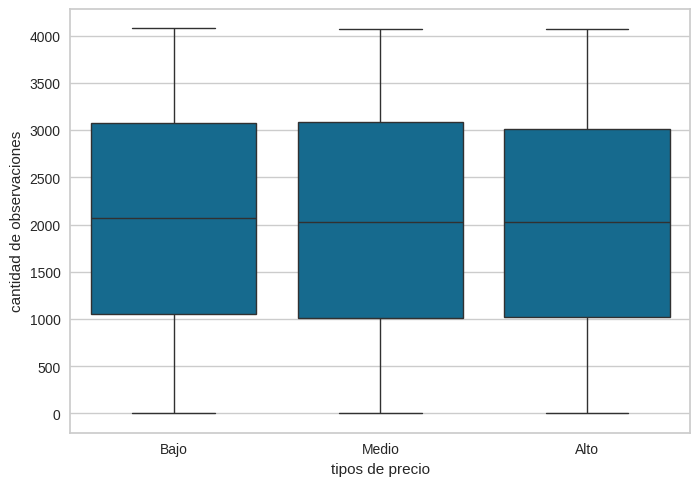

In [158]:
sns.boxplot(x='tipo_precio', y=range(len(caso_Casa['tipo_precio'])) , data=caso_Casa)
plt.xlabel('tipos de precio')
plt.ylabel('cantidad de observaciones')
plt.show()

###### *Caso de propiedades PH*

In [159]:
columna_pxm2 = caso_PH['pxm2']
cantidad_datos = columna_pxm2.size

In [160]:
columna_pxm2 = columna_pxm2.sort_values()
print(columna_pxm2)

141092       23.051867
79676        84.174242
169062      200.000000
169006      200.000000
169028      200.000000
              ...     
325001    15238.095238
115403    15965.166909
351393    18666.666667
62597     32727.272727
423180    32727.272727
Name: pxm2, Length: 9258, dtype: float64


In [161]:
primer_tercio = columna_pxm2.iloc[:int(cantidad_datos/3)]
segundo_tercio = columna_pxm2.iloc[int(cantidad_datos/3) : int(2*(cantidad_datos)/3)]
tercer_tercio = columna_pxm2.iloc[int(2*(cantidad_datos)/3) :]

In [162]:
print(primer_tercio.head(2))
print(segundo_tercio.head(2))
print(tercer_tercio.head(2))

141092    23.051867
79676     84.174242
Name: pxm2, dtype: float64
61142     1359.71223
195634    1360.00000
Name: pxm2, dtype: float64
116702    1818.181818
237459    1818.181818
Name: pxm2, dtype: float64


In [163]:
limite_bajo = primer_tercio.max()
limite_medio = segundo_tercio.max()
limite_alto = tercer_tercio.max()
print("el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y " + str(round(limite_bajo)))
print("el valor de nuestro precio que vamos a considerar medio tomara valores entre " + str(round(limite_bajo)) + " y "  + str(round(limite_medio)))
print("el valor de nuestro precio que vamos a considerar alto tomara valores entre " + str(round(limite_medio)) + " y "  + str(round(limite_alto)))

el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y 1360
el valor de nuestro precio que vamos a considerar medio tomara valores entre 1360 y 1818
el valor de nuestro precio que vamos a considerar alto tomara valores entre 1818 y 32727


In [164]:
separaciones = [0, limite_bajo, limite_medio, limite_alto]
caso_PH['tipo_precio'] = pd.cut(columna_pxm2,
                      bins=separaciones,
                      labels=['Bajo', 'Medio', 'Alto'])

<ipython-input-164-37ff998a2d8f>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [165]:
print(caso_PH['tipo_precio'])

51         Alto
53        Medio
55        Medio
59         Bajo
62        Medio
          ...  
458664    Medio
458667     Alto
458668     Alto
458669     Alto
458670     Alto
Name: tipo_precio, Length: 9258, dtype: category
Categories (3, object): ['Bajo' < 'Medio' < 'Alto']


In [166]:
grupos_precio = caso_PH.groupby(by= 'tipo_precio')
print(grupos_precio.size())

tipo_precio
Bajo     3086
Medio    3098
Alto     3074
dtype: int64


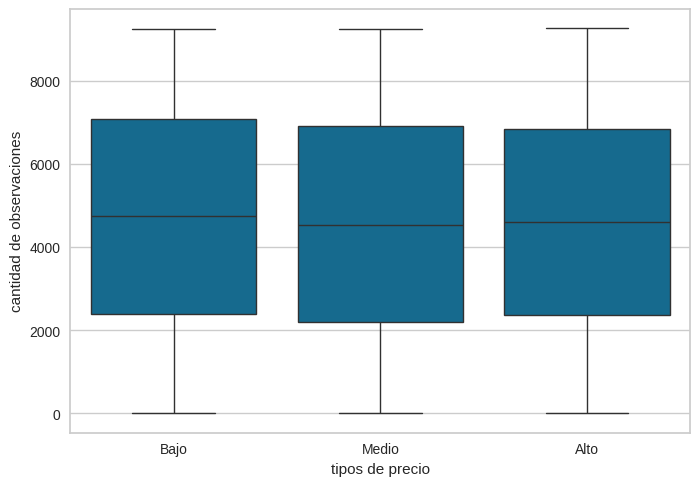

In [167]:
sns.boxplot(x='tipo_precio', y=range(len(caso_PH['tipo_precio'])) , data=caso_PH)
plt.xlabel('tipos de precio')
plt.ylabel('cantidad de observaciones')
plt.show()

###### *Caso Departamentos*

In [168]:
columna_pxm2 = caso_Departamento['pxm2']
cantidad_datos = columna_pxm2.size

In [169]:
columna_pxm2 = columna_pxm2.sort_values()
print(columna_pxm2)

117827        12.987013
221731        14.939759
376985        25.773196
85394         42.734615
140460        62.500000
              ...      
248285     88888.888889
413786     97173.144876
243285    104651.162791
241326    106589.147287
241401    106589.147287
Name: pxm2, Length: 80738, dtype: float64


In [170]:
primer_tercio = columna_pxm2.iloc[:int(cantidad_datos/3)]
segundo_tercio = columna_pxm2.iloc[int(cantidad_datos/3) : int(2*(cantidad_datos)/3)]
tercer_tercio = columna_pxm2.iloc[int(2*(cantidad_datos)/3) :]

In [171]:
print(primer_tercio.head(2))
print(segundo_tercio.head(2))
print(tercer_tercio.head(2))

117827    12.987013
221731    14.939759
Name: pxm2, dtype: float64
10835     2068.965517
340054    2068.965517
Name: pxm2, dtype: float64
268240    2674.418605
347815    2674.418605
Name: pxm2, dtype: float64


In [172]:
limite_bajo = primer_tercio.max()
limite_medio = segundo_tercio.max()
limite_alto = tercer_tercio.max()
print("el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y " + str(round(limite_bajo)))
print("el valor de nuestro precio que vamos a considerar medio tomara valores entre " + str(round(limite_bajo)) + " y "  + str(round(limite_medio)))
print("el valor de nuestro precio que vamos a considerar alto tomara valores entre " + str(round(limite_medio)) + " y "  + str(round(limite_alto)))

el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y 2069
el valor de nuestro precio que vamos a considerar medio tomara valores entre 2069 y 2674
el valor de nuestro precio que vamos a considerar alto tomara valores entre 2674 y 106589


In [173]:
separaciones = [0, limite_bajo, limite_medio, limite_alto]
caso_Departamento['tipo_precio'] = pd.cut(columna_pxm2,
                      bins=separaciones,
                      labels=['Bajo', 'Medio', 'Alto'])

<ipython-input-173-a7ef302c8b22>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [174]:
print(caso_Departamento['tipo_precio'])

42         Bajo
43         Bajo
49         Bajo
56         Bajo
57         Alto
          ...  
460072     Bajo
460073    Medio
460074     Bajo
460075     Bajo
460090     Bajo
Name: tipo_precio, Length: 80738, dtype: category
Categories (3, object): ['Bajo' < 'Medio' < 'Alto']


In [175]:
grupos_precio = caso_Departamento.groupby(by= 'tipo_precio')
print(grupos_precio.size())

tipo_precio
Bajo     26941
Medio    26917
Alto     26880
dtype: int64


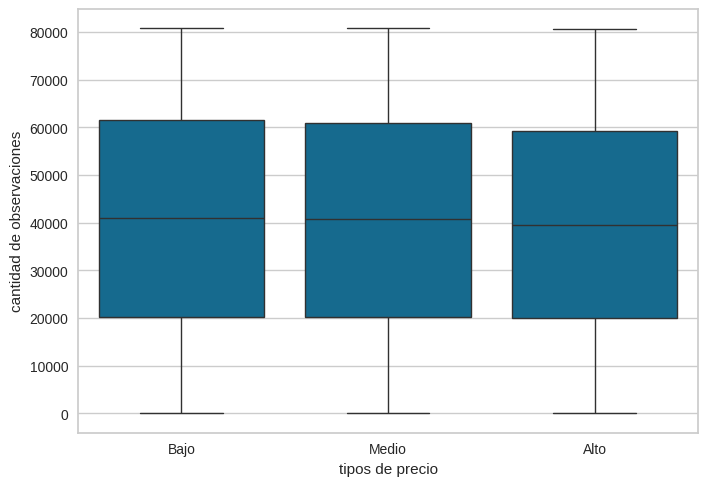

In [176]:
sns.boxplot(x='tipo_precio', y=range(len(caso_Departamento['tipo_precio'])) , data=caso_Departamento)
plt.xlabel('tipos de precio')
plt.ylabel('cantidad de observaciones')
plt.show()

##### Separacion de variable 'tipo_precio' de forma 25/50/25.

Vamos a analizar las 3 posibilidades pero con la distribucion 25/50/25

###### *Caso Casas*

In [177]:
columna_pxm2 = caso_Casa['pxm2']
cantidad_datos = columna_pxm2.size

In [178]:
columna_pxm2 = columna_pxm2.sort_values()
print(columna_pxm2)

101465       66.666667
130465       93.189964
130483      110.000000
34732       133.333333
138208      160.000000
              ...     
177107    64220.183486
407395    73043.478261
193831    75528.700906
214911    75528.700906
237575    80000.000000
Name: pxm2, Length: 4077, dtype: float64


In [179]:
primer_tercio = columna_pxm2.iloc[:int(cantidad_datos * 0.25)]
segundo_tercio = columna_pxm2.iloc[int(cantidad_datos * 0.25) : int(cantidad_datos * 0.75)]
tercer_tercio = columna_pxm2.iloc[int(cantidad_datos * 0.75) :]

In [180]:
print(primer_tercio.head(2))
print(segundo_tercio.head(2))
print(tercer_tercio.head(2))

101465    66.666667
130465    93.189964
Name: pxm2, dtype: float64
192605    1136.363636
60409     1137.634409
Name: pxm2, dtype: float64
11633     2178.571429
297472    2181.250000
Name: pxm2, dtype: float64


In [181]:
limite_bajo = primer_tercio.max()
limite_medio = segundo_tercio.max()
limite_alto = tercer_tercio.max()
print("el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y " + str(round(limite_bajo)))
print("el valor de nuestro precio que vamos a considerar medio tomara valores entre " + str(round(limite_bajo)) + " y "  + str(round(limite_medio)))
print("el valor de nuestro precio que vamos a considerar alto tomara valores entre " + str(round(limite_medio)) + " y "  + str(round(limite_alto)))

el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y 1136
el valor de nuestro precio que vamos a considerar medio tomara valores entre 1136 y 2178
el valor de nuestro precio que vamos a considerar alto tomara valores entre 2178 y 80000


In [182]:
separaciones = [0, limite_bajo, limite_medio, limite_alto]
caso_Casa['tipo_precio'] = pd.cut(columna_pxm2,
                      bins=separaciones,
                      labels=['Bajo', 'Medio', 'Alto'])

<ipython-input-182-7afafbe837e0>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [183]:
print(caso_Casa['tipo_precio'])

25        Medio
58        Medio
63        Medio
434       Medio
708        Bajo
          ...  
458958    Medio
458961    Medio
458962     Alto
458963     Bajo
458964     Bajo
Name: tipo_precio, Length: 4077, dtype: category
Categories (3, object): ['Bajo' < 'Medio' < 'Alto']


In [184]:
grupos_precio = caso_Casa.groupby(by= 'tipo_precio')
print(grupos_precio.size())

tipo_precio
Bajo     1020
Medio    2037
Alto     1020
dtype: int64


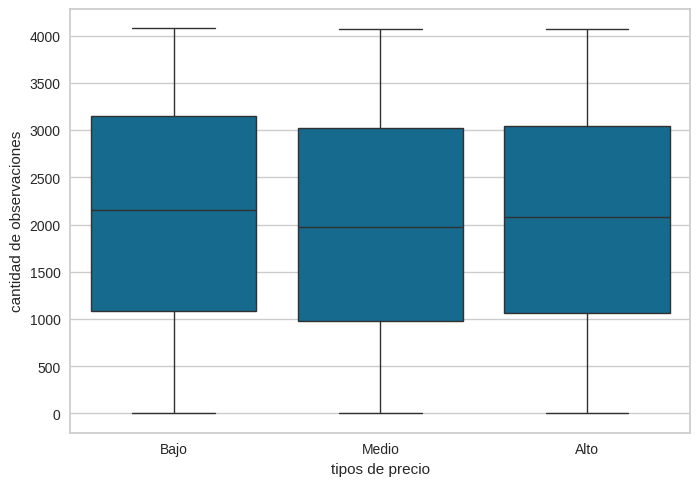

In [185]:
sns.boxplot(x='tipo_precio', y=range(len(caso_Casa['tipo_precio'])) , data=caso_Casa)
plt.xlabel('tipos de precio')
plt.ylabel('cantidad de observaciones')
plt.show()

###### *Caso de PH*

In [186]:
columna_pxm2 = caso_PH['pxm2']
cantidad_datos = columna_pxm2.size

In [187]:
columna_pxm2 = columna_pxm2.sort_values()
print(columna_pxm2)

141092       23.051867
79676        84.174242
169062      200.000000
169006      200.000000
169028      200.000000
              ...     
325001    15238.095238
115403    15965.166909
351393    18666.666667
62597     32727.272727
423180    32727.272727
Name: pxm2, Length: 9258, dtype: float64


In [188]:
primer_tercio = columna_pxm2.iloc[:int(cantidad_datos * 0.25)]
segundo_tercio = columna_pxm2.iloc[int(cantidad_datos * 0.25) : int(cantidad_datos * 0.75)]
tercer_tercio = columna_pxm2.iloc[int(cantidad_datos * 0.75) :]

In [189]:
print(primer_tercio.head(2))
print(segundo_tercio.head(2))
print(tercer_tercio.head(2))

141092    23.051867
79676     84.174242
Name: pxm2, dtype: float64
38623    1243.055556
75846    1243.055556
Name: pxm2, dtype: float64
186528    1966.666667
454752    1966.666667
Name: pxm2, dtype: float64


In [190]:
limite_bajo = primer_tercio.max()
limite_medio = segundo_tercio.max()
limite_alto = tercer_tercio.max()
print("el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y " + str(round(limite_bajo)))
print("el valor de nuestro precio que vamos a considerar medio tomara valores entre " + str(round(limite_bajo)) + " y "  + str(round(limite_medio)))
print("el valor de nuestro precio que vamos a considerar alto tomara valores entre " + str(round(limite_medio)) + " y "  + str(round(limite_alto)))

el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y 1243
el valor de nuestro precio que vamos a considerar medio tomara valores entre 1243 y 1966
el valor de nuestro precio que vamos a considerar alto tomara valores entre 1966 y 32727


In [191]:
separaciones = [0, limite_bajo, limite_medio, limite_alto]
caso_PH['tipo_precio'] = pd.cut(columna_pxm2,
                      bins=separaciones,
                      labels=['Bajo', 'Medio', 'Alto'])

<ipython-input-191-37ff998a2d8f>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [192]:
print(caso_PH['tipo_precio'])

51         Alto
53        Medio
55        Medio
59         Bajo
62        Medio
          ...  
458664    Medio
458667     Alto
458668     Alto
458669     Alto
458670     Alto
Name: tipo_precio, Length: 9258, dtype: category
Categories (3, object): ['Bajo' < 'Medio' < 'Alto']


In [193]:
grupos_precio = caso_PH.groupby(by= 'tipo_precio')
print(grupos_precio.size())

tipo_precio
Bajo     2317
Medio    4626
Alto     2315
dtype: int64


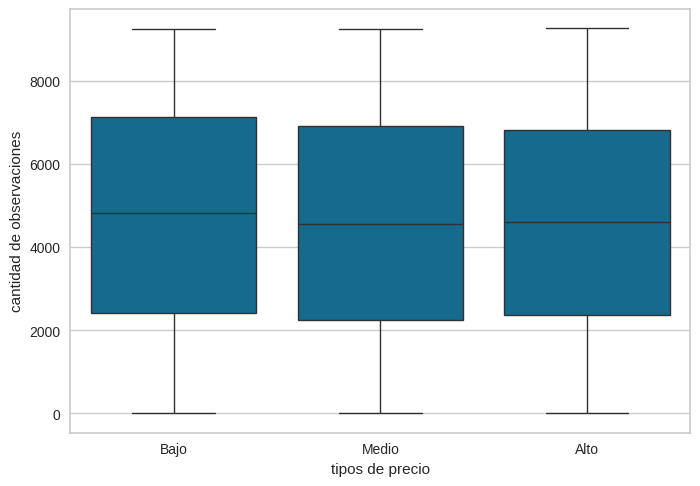

In [194]:
sns.boxplot(x='tipo_precio', y=range(len(caso_PH['tipo_precio'])) , data=caso_PH)
plt.xlabel('tipos de precio')
plt.ylabel('cantidad de observaciones')
plt.show()

###### *Caso Departamentos*

In [195]:
columna_pxm2 = caso_Departamento['pxm2']
cantidad_datos = columna_pxm2.size

In [196]:
columna_pxm2 = columna_pxm2.sort_values()
print(columna_pxm2)

117827        12.987013
221731        14.939759
376985        25.773196
85394         42.734615
140460        62.500000
              ...      
248285     88888.888889
413786     97173.144876
243285    104651.162791
241326    106589.147287
241401    106589.147287
Name: pxm2, Length: 80738, dtype: float64


In [197]:
primer_tercio = columna_pxm2.iloc[:int(cantidad_datos * 0.25)]
segundo_tercio = columna_pxm2.iloc[int(cantidad_datos * 0.25) : int(cantidad_datos * 0.75)]
tercer_tercio = columna_pxm2.iloc[int(cantidad_datos * 0.75) :]

In [198]:
print(primer_tercio.head(2))
print(segundo_tercio.head(2))
print(tercer_tercio.head(2))

117827    12.987013
221731    14.939759
Name: pxm2, dtype: float64
411671    1916.666667
344051    1916.666667
Name: pxm2, dtype: float64
12058     2884.615385
428073    2884.615385
Name: pxm2, dtype: float64


In [199]:
limite_bajo = primer_tercio.max()
limite_medio = segundo_tercio.max()
limite_alto = tercer_tercio.max()
print("el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y " + str(round(limite_bajo)))
print("el valor de nuestro precio que vamos a considerar medio tomara valores entre " + str(round(limite_bajo)) + " y "  + str(round(limite_medio)))
print("el valor de nuestro precio que vamos a considerar alto tomara valores entre " + str(round(limite_medio)) + " y "  + str(round(limite_alto)))

el valor de nuestro precio que vamos a considerar bajo tomara valores entre 0 y 1917
el valor de nuestro precio que vamos a considerar medio tomara valores entre 1917 y 2885
el valor de nuestro precio que vamos a considerar alto tomara valores entre 2885 y 106589


In [200]:
separaciones = [0, limite_bajo, limite_medio, limite_alto]
caso_Departamento['tipo_precio'] = pd.cut(columna_pxm2,
                      bins=separaciones,
                      labels=['Bajo', 'Medio', 'Alto'])

<ipython-input-200-a7ef302c8b22>:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [201]:
print(caso_Departamento['tipo_precio'])

42         Bajo
43         Bajo
49         Bajo
56         Bajo
57         Alto
          ...  
460072     Bajo
460073    Medio
460074     Bajo
460075    Medio
460090     Bajo
Name: tipo_precio, Length: 80738, dtype: category
Categories (3, object): ['Bajo' < 'Medio' < 'Alto']


In [202]:
grupos_precio = caso_Departamento.groupby(by= 'tipo_precio')
print(grupos_precio.size())

tipo_precio
Bajo     20281
Medio    40289
Alto     20168
dtype: int64


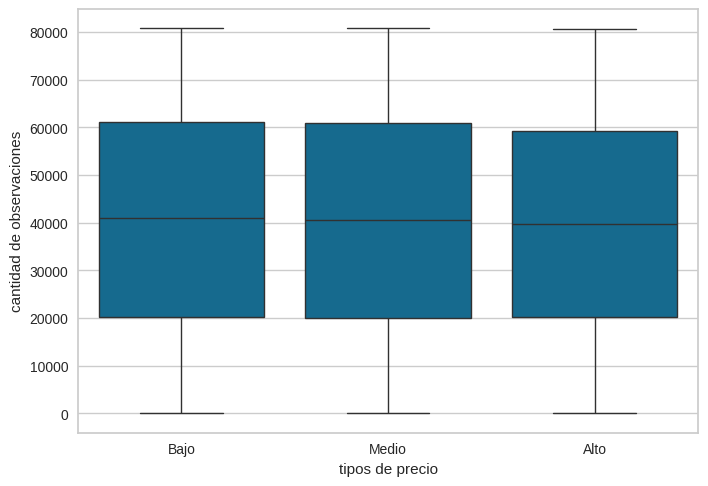

In [203]:
sns.boxplot(x='tipo_precio', y=range(len(caso_Departamento['tipo_precio'])) , data=caso_Departamento)
plt.xlabel('tipos de precio')
plt.ylabel('cantidad de observaciones')
plt.show()

#### d. Seleccionar una de las alternativas, justificando la misma

Con los resultados obtenidos, podemos suponer que la eleccion mas apropiada es la que separa al conjunto en 3 subconjuntos con una distribucion de cuantiles de 25/50/25 sin haber filtrado segun que tipo de propiedad estamos analizando. La razon detras de nuestra decision es que al separar en los tipos de propiedades nuestras muestras tienden a tomar valores de precio altos, sobre todo para los casos de Departamentos y PH. Esto puede deberse a que nuestro tratado de outliers no haya sido optimo, o porque la distribucion simplemente no es tan efectiva como la que hemos elegido.

#### e. **Comparar, si aplica, la alternativa seleccionada con la división en 3 grupos obtenida utilizando agrupamiento por K Means.**

In [204]:
dataset_comparar = pd.merge(properati_final, properati_Kmeans, how='outer')

In [205]:
dataset_comparar.columns

Index(['id', 'start_date', 'end_date', 'created_on', 'latitud', 'longitud',
       'barrio', 'property_type', 'property_rooms', 'property_bedrooms',
       'property_surface_total', 'property_surface_covered', 'property_price',
       'property_title', 'pxm2', 'tipo_precio', 'barrio_Agronomía',
       'barrio_Almagro', 'barrio_Balvanera', 'barrio_Barracas',
       'barrio_Barrio Norte', 'barrio_Belgrano', 'barrio_Boca', 'barrio_Boedo',
       'barrio_Caballito', 'barrio_Catalinas', 'barrio_Centro / Microcentro',
       'barrio_Chacarita', 'barrio_Coghlan', 'barrio_Colegiales',
       'barrio_Congreso', 'barrio_Constitución', 'barrio_Flores',
       'barrio_Floresta', 'barrio_Las Cañitas', 'barrio_Liniers',
       'barrio_Mataderos', 'barrio_Monserrat', 'barrio_Monte Castro',
       'barrio_Nuñez', 'barrio_Once', 'barrio_Palermo',
       'barrio_Parque Avellaneda', 'barrio_Parque Centenario',
       'barrio_Parque Chacabuco', 'barrio_Parque Chas',
       'barrio_Parque Patricios', 'barr

In [206]:
dataset_comparar = dataset_comparar.drop_duplicates()
dataset_comparar = dataset_comparar.dropna()

In [207]:
dataset_comparar.shape

(101200, 75)

In [208]:
grupos_por_precio = dataset_comparar.groupby('tipo_precio')

In [209]:
print(grupos_por_precio.size())

tipo_precio
Bajo     25691
Medio    50538
Alto     24971
dtype: int64


In [210]:
grupo_precio_bajo = grupos_por_precio.get_group('Bajo')

In [211]:
px.scatter_mapbox(
    grupo_precio_bajo,
    lat="latitud",
    lon="longitud",
    color="cluster",
    color_discrete_map={"0": "turquoise", "1": "green", '2': 'red'},
).update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 10,
    },
)

In [212]:
grupo_precio_medio = grupos_por_precio.get_group('Medio')

In [213]:
px.scatter_mapbox(
    grupo_precio_medio,
    lat="latitud",
    lon="longitud",
    color="cluster",
    color_discrete_map={"0": "turquoise", "1": "green", '2': 'red'},
).update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 10,
    },
)

In [214]:
grupo_precio_alto = grupos_por_precio.get_group('Alto')

In [215]:
px.scatter_mapbox(
    grupo_precio_alto,
    lat="latitud",
    lon="longitud",
    color="cluster",
    color_discrete_map={"0": "turquoise", "1": "green", '2': 'red'},
).update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 10,
    },
)

Concluimos entonces que los clusters parecen tener una asociacion a los precios posibles, sin embargo, la clara distribucion de observaciones se da por la localizacion de las mismas. Asi mismo, vemos que la zona sur de la capital posee, en relacion a los otros 2 clusters, pocos valores altos, esto nos indica que este cluster parece estar asociado a la zona sur (lugar de precios relativos mas bajos), conclusion que ya habiamos explicitado en la parte 2. Entonces, los clusters parecen tener una agrupacion segun el precio debido a las diferencias en precios en las zonas de la capital.

#### f. Mostrar en un mapa de CABA los avisos coloreados por tipo_precio

In [216]:
cambiar_a_numerico = properati_final['tipo_precio'].replace({'Bajo': 0, 'Medio': 1, 'Alto': 2})
px.scatter_mapbox(
    properati_final,
    lat="latitud",
    lon="longitud",
    color="tipo_precio",
    color_discrete_map={"0": "turquoise", "1": "green", '2': 'red'},
).update_layout(
    mapbox={
        "style": "carto-positron",
        "zoom": 10,
    },
)

### b) **Entrenamiento y Predicción**

Predecir el valor del atributo tipo_precio, excluyendo del entrenamiento la variable price, pxm2 y cualquier otra que pueda contener información del precio de venta. Para todos los modelos se pide realizar las tareas de ingeniería de características necesarias para trabajar con cada algoritmo (encoding, normalización, etc).


#### Modelo 1: Arbol de decision


a. Construir un árbol de decisión y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance. ¿Cuántos folds utilizaron? ¿Qué métrica consideran adecuada para buscar los parámetros?

b. Graficar el árbol de decisión con mejor performance encontrado en el punto anterior. Si es muy extenso mostrar una porción representativa.

c. Analizar el árbol de decisión seleccionado describiendo los atributos elegidos, y decisiones evaluadas (explicar las primeras reglas obtenidas).

d. Evaluar la performance del árbol en el conjunto de evaluación, explicar todas las métricas y mostrar la matriz de confusión. Comparar con la performance de entrenamiento.

In [217]:
properati_final.tipo_precio.value_counts(normalize= True)

tipo_precio
Medio    0.499888
Bajo     0.250136
Alto     0.249976
Name: proportion, dtype: float64

In [218]:
!pip install 'dtreeviz'

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 91.8/91.8 kB 1.8 MB/s eta 0:00:00


In [219]:
import dtreeviz
from sklearn import tree
from sklearn.model_selection import train_test_split
from sklearn.metrics import precision_score, recall_score, accuracy_score,f1_score
from sklearn.metrics import confusion_matrix, classification_report
import warnings
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

Se separa el conjunto entre uno de entrenamiento (80%) y otro de test (20%).

In [220]:
#vamos a transformar nuestras variables categoricas para poder hacer nuestros modelos
properati_modelos = properati_final.copy()
properati_modelos = pd.get_dummies(
    properati_modelos, columns=["barrio", "property_type"], drop_first=True
)
print(properati_modelos.columns)

Index(['id', 'start_date', 'end_date', 'created_on', 'latitud', 'longitud',
       'property_rooms', 'property_bedrooms', 'property_surface_total',
       'property_surface_covered', 'property_price', 'property_title', 'pxm2',
       'tipo_precio', 'barrio_Agronomía', 'barrio_Almagro', 'barrio_Balvanera',
       'barrio_Barracas', 'barrio_Barrio Norte', 'barrio_Belgrano',
       'barrio_Boca', 'barrio_Boedo', 'barrio_Caballito', 'barrio_Catalinas',
       'barrio_Centro / Microcentro', 'barrio_Chacarita', 'barrio_Coghlan',
       'barrio_Colegiales', 'barrio_Congreso', 'barrio_Constitución',
       'barrio_Flores', 'barrio_Floresta', 'barrio_Las Cañitas',
       'barrio_Liniers', 'barrio_Mataderos', 'barrio_Monserrat',
       'barrio_Monte Castro', 'barrio_Nuñez', 'barrio_Once', 'barrio_Palermo',
       'barrio_Parque Avellaneda', 'barrio_Parque Centenario',
       'barrio_Parque Chacabuco', 'barrio_Parque Chas',
       'barrio_Parque Patricios', 'barrio_Paternal', 'barrio_Pompeya',
  

In [221]:
#eliminamos las columnas que no nos interesan o no aportan informacion.
properati_modelos = properati_modelos.drop(columns = ['id','start_date', 'end_date', 'created_on', 'property_title'])
print(properati_modelos.columns)

Index(['latitud', 'longitud', 'property_rooms', 'property_bedrooms',
       'property_surface_total', 'property_surface_covered', 'property_price',
       'pxm2', 'tipo_precio', 'barrio_Agronomía', 'barrio_Almagro',
       'barrio_Balvanera', 'barrio_Barracas', 'barrio_Barrio Norte',
       'barrio_Belgrano', 'barrio_Boca', 'barrio_Boedo', 'barrio_Caballito',
       'barrio_Catalinas', 'barrio_Centro / Microcentro', 'barrio_Chacarita',
       'barrio_Coghlan', 'barrio_Colegiales', 'barrio_Congreso',
       'barrio_Constitución', 'barrio_Flores', 'barrio_Floresta',
       'barrio_Las Cañitas', 'barrio_Liniers', 'barrio_Mataderos',
       'barrio_Monserrat', 'barrio_Monte Castro', 'barrio_Nuñez',
       'barrio_Once', 'barrio_Palermo', 'barrio_Parque Avellaneda',
       'barrio_Parque Centenario', 'barrio_Parque Chacabuco',
       'barrio_Parque Chas', 'barrio_Parque Patricios', 'barrio_Paternal',
       'barrio_Pompeya', 'barrio_Puerto Madero', 'barrio_Recoleta',
       'barrio_Retiro',

In [222]:
#buscamos los features
target = 'tipo_precio'
features = properati_modelos.columns.to_list()
features.remove(target)

#vamos a remover variables que otorgarian demasiada informacion para que no influya en nuestra clasificacion
#ya que otorgaria demasiada informacion, causando overfitting.

features.remove('pxm2')
features.remove('property_price')

Y =  properati_modelos[target].values #guardamos los valores de la columna de property_price

properati_modelos = properati_modelos.drop(columns= [target])

X = properati_modelos[features].values #guardamos los valores de todas las columnas restantes

In [223]:
#vemos todos los atributos que vamos a usar para entrenar nuestro modelo
print(features)

['latitud', 'longitud', 'property_rooms', 'property_bedrooms', 'property_surface_total', 'property_surface_covered', 'barrio_Agronomía', 'barrio_Almagro', 'barrio_Balvanera', 'barrio_Barracas', 'barrio_Barrio Norte', 'barrio_Belgrano', 'barrio_Boca', 'barrio_Boedo', 'barrio_Caballito', 'barrio_Catalinas', 'barrio_Centro / Microcentro', 'barrio_Chacarita', 'barrio_Coghlan', 'barrio_Colegiales', 'barrio_Congreso', 'barrio_Constitución', 'barrio_Flores', 'barrio_Floresta', 'barrio_Las Cañitas', 'barrio_Liniers', 'barrio_Mataderos', 'barrio_Monserrat', 'barrio_Monte Castro', 'barrio_Nuñez', 'barrio_Once', 'barrio_Palermo', 'barrio_Parque Avellaneda', 'barrio_Parque Centenario', 'barrio_Parque Chacabuco', 'barrio_Parque Chas', 'barrio_Parque Patricios', 'barrio_Paternal', 'barrio_Pompeya', 'barrio_Puerto Madero', 'barrio_Recoleta', 'barrio_Retiro', 'barrio_Saavedra', 'barrio_San Cristobal', 'barrio_San Nicolás', 'barrio_San Telmo', 'barrio_Tribunales', 'barrio_Velez Sarsfield', 'barrio_Vers

In [224]:
print(X.shape, Y.shape)

(94073, 64) (94073,)


In [225]:
#Separo un set de Evaluacion
from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(X, Y,
                                                    test_size=0.2,
                                                    random_state=5, #para poder reproducir el experimento
                                                    stratify = Y
                                                    )

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

# Datos Entrenamiento: 75258
# Datos Prueba: 18815


##### a. Construir un árbol de decisión y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance. ¿Cuántos folds utilizaron? ¿Qué métrica consideran adecuada para buscar los parámetros?

Vamos a buscar los hiperparametros que nos permitan maximizar nuestra metrica de recall. La razon de la eleccion detras de esta metrica es que de todos los elementos que son de cierta clasificacion, queremos tratar de minimizar la cantidad de observaciones que no clasificamos correctamente. Es decir, del total de observaciones de una clasificacion X, queremos minimizar la cantidad de veces que nuestros modelos de clasificacion no aciertan que una observacion pertenezca al grupo correcto. Esto lo aplicaremos para los 3 modelos que vamos a entrenar en esta parte del trabajo.

In [226]:
from sklearn.model_selection import StratifiedKFold, KFold,RandomizedSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import make_scorer, f1_score

In [227]:
#Cantidad de combinaciones que quiero porbar
n=20

#Conjunto de parámetros que quiero usar
params_grid = {'criterion':['gini','entropy'],
               'max_depth':list(range(1,25)), #ponemos un rango de 25 porque tenemos muchas columnas que evaluar
               'ccp_alpha':np.linspace(0,0.05,n) #ccp para evitar overfitting
               }

#Cantidad de splits para el Cross Validation
folds=10

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

#Clasificador
base_tree = DecisionTreeClassifier()

#Metrica que quiero optimizar F1 Score
score1 = make_scorer(f1_score, average='micro')

score2 = make_scorer(accuracy_score, average='micro')

score3 = make_scorer(recall_score, average='micro')

scorer_fn = {"F1-Score": score1, "Accuracy": score2, "Recall" : score3}

#Random Search Cross Validation
randomcv = RandomizedSearchCV(estimator=base_tree,
                              param_distributions = params_grid,
                              scoring=scorer_fn,
                              refit='Recall',
                               cv=kfoldcv,
                              n_iter=n,
                              random_state = 20
                              )

#Busco los hiperparamtros que optimizan Recall
randomcv.fit(x_train,y_train);

In [228]:
pd.DataFrame(randomcv.cv_results_)

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_max_depth,param_criterion,param_ccp_alpha,params,split0_test_F1-Score,split1_test_F1-Score,...,split3_test_Recall,split4_test_Recall,split5_test_Recall,split6_test_Recall,split7_test_Recall,split8_test_Recall,split9_test_Recall,mean_test_Recall,std_test_Recall,rank_test_Recall
0,1.430308,0.693425,0.266277,0.117047,6,gini,0.010526,"{'max_depth': 6, 'criterion': 'gini', 'ccp_alp...",0.564576,0.570555,...,0.562317,0.560723,0.566436,0.568828,0.567499,0.559734,0.565316,0.565003,0.003290,10
1,2.112744,0.716330,0.400596,0.183850,5,entropy,0.015789,"{'max_depth': 5, 'criterion': 'entropy', 'ccp_...",0.563115,0.571087,...,0.562184,0.562052,0.569094,0.567499,0.569094,0.561196,0.564385,0.565388,0.003332,6
2,1.544063,0.843784,0.235367,0.129121,13,gini,0.034211,"{'max_depth': 13, 'criterion': 'gini', 'ccp_al...",0.499867,0.499867,...,0.499867,0.499867,0.499867,0.499867,0.499867,0.499934,0.499934,0.499880,0.000027,16
3,1.037622,0.192837,0.149387,0.049637,13,gini,0.023684,"{'max_depth': 13, 'criterion': 'gini', 'ccp_al...",0.499867,0.499867,...,0.499867,0.499867,0.499867,0.499867,0.499867,0.499934,0.499934,0.499880,0.000027,16
4,0.949482,0.172166,0.150094,0.052872,10,gini,0.034211,"{'max_depth': 10, 'criterion': 'gini', 'ccp_al...",0.499867,0.499867,...,0.499867,0.499867,0.499867,0.499867,0.499867,0.499934,0.499934,0.499880,0.000027,16
5,0.849480,0.165615,0.136434,0.046490,7,entropy,0.036842,"{'max_depth': 7, 'criterion': 'entropy', 'ccp_...",0.514483,0.517805,...,0.514217,0.513819,0.514350,0.516609,0.514749,0.513488,0.514551,0.514856,0.001255,15
6,1.929856,0.336803,0.127733,0.033179,21,entropy,0.034211,"{'max_depth': 21, 'criterion': 'entropy', 'ccp...",0.563115,0.518469,...,0.562184,0.515147,0.517008,0.515280,0.516343,0.561196,0.564385,0.534774,0.022852,13
7,1.977516,0.292611,0.141046,0.042550,22,entropy,0.015789,"{'max_depth': 22, 'criterion': 'entropy', 'ccp...",0.563115,0.571087,...,0.562184,0.562052,0.569094,0.567499,0.569094,0.561196,0.564385,0.565388,0.003332,6
8,1.061922,0.515552,0.141648,0.039797,11,gini,0.002632,"{'max_depth': 11, 'criterion': 'gini', 'ccp_al...",0.599920,0.595801,...,0.597263,0.600319,0.606032,0.611879,0.603508,0.601993,0.609568,0.601305,0.006846,1
9,1.202442,0.261381,0.169133,0.052224,11,entropy,0.010526,"{'max_depth': 11, 'criterion': 'entropy', 'ccp...",0.574674,0.575737,...,0.566835,0.564045,0.578129,0.580255,0.584507,0.573688,0.571960,0.574158,0.005741,4


##### b. Graficar el árbol de decisión con mejor performance encontrado en el punto anterior. Si es muy extenso mostrar una porción representativa.

In [229]:
#Creo el árbol con los mejores hiperparámetros
from sklearn.tree import DecisionTreeClassifier
from sklearn.tree import export_text

arbol=DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol.fit(x_train,y_train)

reglas = export_text(arbol, feature_names=list(features))
print(reglas)

|--- latitud <= -34.60
|   |--- property_type_Departamento <= 0.50
|   |   |--- property_surface_total <= 77.85
|   |   |   |--- class: Bajo
|   |   |--- property_surface_total >  77.85
|   |   |   |--- class: Bajo
|   |--- property_type_Departamento >  0.50
|   |   |--- barrio_Puerto Madero <= 0.50
|   |   |   |--- longitud <= -58.42
|   |   |   |   |--- latitud <= -34.63
|   |   |   |   |   |--- class: Bajo
|   |   |   |   |--- latitud >  -34.63
|   |   |   |   |   |--- class: Medio
|   |   |   |--- longitud >  -58.42
|   |   |   |   |--- class: Bajo
|   |   |--- barrio_Puerto Madero >  0.50
|   |   |   |--- class: Alto
|--- latitud >  -34.60
|   |--- property_type_Departamento <= 0.50
|   |   |--- class: Bajo
|   |--- property_type_Departamento >  0.50
|   |   |--- longitud <= -58.47
|   |   |   |--- class: Medio
|   |   |--- longitud >  -58.47
|   |   |   |--- latitud <= -34.59
|   |   |   |   |--- class: Medio
|   |   |   |--- latitud >  -34.59
|   |   |   |   |--- property_surfac

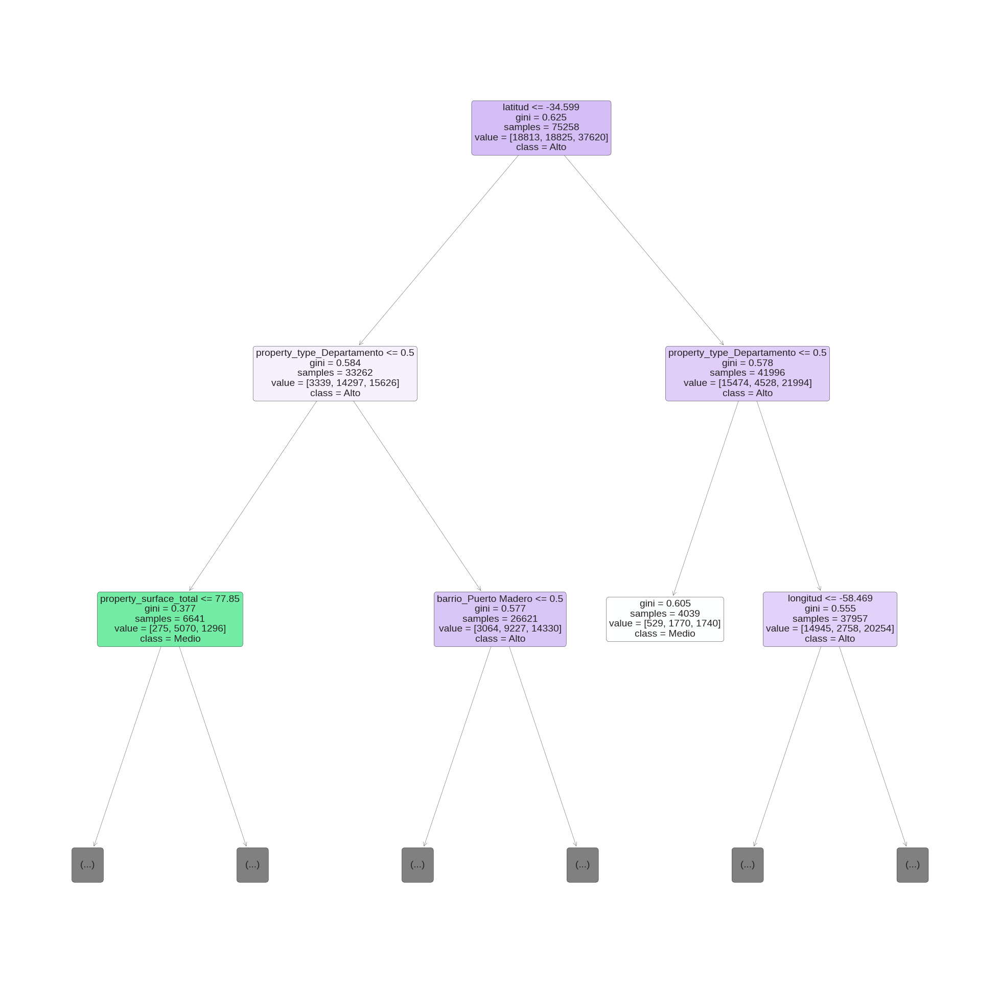

In [230]:
plt.figure(figsize=(25,25))

tree_plot=tree.plot_tree(arbol,
                         max_depth=2,
                         feature_names=features,
                         filled=True,
                         rounded=True,
                         class_names=['Bajo', 'Medio', 'Alto'])

plt.show(tree_plot)

##### c. Analizar el árbol de decisión seleccionado describiendo los atributos elegidos, y decisiones evaluadas (explicar las primeras reglas obtenidas).

In [231]:
#Mejores hiperparametros del arbol
print(randomcv.best_params_)

{'max_depth': 11, 'criterion': 'gini', 'ccp_alpha': 0.002631578947368421}


In [232]:
#Atributos considerados y su importancia
sorted(list(zip(features, arbol.feature_importances_)), key=lambda x: -x[1])

[('latitud', 0.43405301200014224),
 ('property_type_Departamento', 0.24792523589485274),
 ('barrio_Puerto Madero', 0.1458942051686456),
 ('longitud', 0.11200149964271726),
 ('property_surface_total', 0.060126047293642265),
 ('property_rooms', 0.0),
 ('property_bedrooms', 0.0),
 ('property_surface_covered', 0.0),
 ('barrio_Agronomía', 0.0),
 ('barrio_Almagro', 0.0),
 ('barrio_Balvanera', 0.0),
 ('barrio_Barracas', 0.0),
 ('barrio_Barrio Norte', 0.0),
 ('barrio_Belgrano', 0.0),
 ('barrio_Boca', 0.0),
 ('barrio_Boedo', 0.0),
 ('barrio_Caballito', 0.0),
 ('barrio_Catalinas', 0.0),
 ('barrio_Centro / Microcentro', 0.0),
 ('barrio_Chacarita', 0.0),
 ('barrio_Coghlan', 0.0),
 ('barrio_Colegiales', 0.0),
 ('barrio_Congreso', 0.0),
 ('barrio_Constitución', 0.0),
 ('barrio_Flores', 0.0),
 ('barrio_Floresta', 0.0),
 ('barrio_Las Cañitas', 0.0),
 ('barrio_Liniers', 0.0),
 ('barrio_Mataderos', 0.0),
 ('barrio_Monserrat', 0.0),
 ('barrio_Monte Castro', 0.0),
 ('barrio_Nuñez', 0.0),
 ('barrio_Once', 

Viendo los primeros nodos del arbol, vemos que los atributos que mayor relevancia tienen parecen ser la latitud, la longitud, el tipo de propiedad (mas especificamente si es un departamento), si la propiedad se encuentra en puerto madero, y la superficie que posee dicha propiedad.

##### d. Evaluar la performance del árbol en el conjunto de evaluación, explicar todas las métricas y mostrar la matriz de confusión. Comparar con la performance de entrenamiento.

In [233]:
#hacemos una prediccion sobre nuestro set de entrenamiento y nuestro set de evaluacion.
y_pred_train = arbol.predict(x_train)
y_pred = arbol.predict(x_test)

Matriz de confusion y classification_report de nuestro conjunto de entrenamiento

Text(70.72222222222221, 0.5, 'True')

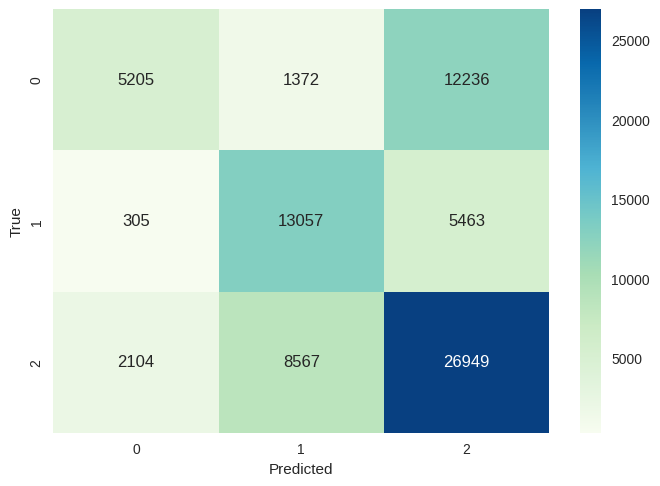

In [234]:
#Creo la matriz de confusión para nuestro conjunto de entrenamiento
tabla=confusion_matrix(y_train, y_pred_train)
#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

In [235]:
#vemos las metricas en el conjunto de entrenamiento
print(classification_report(y_train,y_pred_train))

              precision    recall  f1-score   support

        Alto       0.68      0.28      0.39     18813
        Bajo       0.57      0.69      0.62     18825
       Medio       0.60      0.72      0.66     37620

    accuracy                           0.60     75258
   macro avg       0.62      0.56      0.56     75258
weighted avg       0.61      0.60      0.58     75258



ahora vemos la matriz de confusion de nuestro conjunto de testing

Text(70.72222222222221, 0.5, 'True')

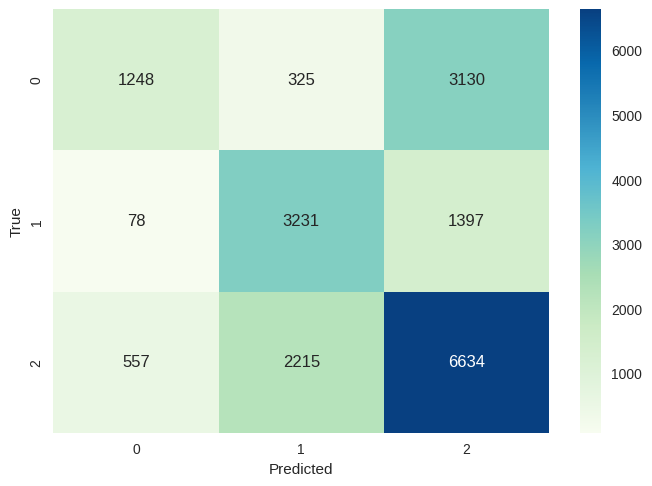

In [236]:
#Creo la matriz de confusión para nuestro conjunto de evaluacion
tabla=confusion_matrix(y_test, y_pred)
#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

observemos las metricas que obtuvimos

In [237]:
#vemos las metricas en el conjunto de evaluacion
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        Alto       0.66      0.27      0.38      4703
        Bajo       0.56      0.69      0.62      4706
       Medio       0.59      0.71      0.65      9406

    accuracy                           0.59     18815
   macro avg       0.61      0.55      0.55     18815
weighted avg       0.60      0.59      0.57     18815



Notamos que tanto el conjunto de entrenamiento como el conjunto de evaluacion tienen scores similares, por lo que concluimos que nuestro modelo comprendio de manera efectiva los datos con los que fue entrenado, pero no tanto como para crear un caso de overfitting, como se puede observar en la cantidad de aciertos y desaciertos de nuestro modelo a la hora de ser evaluado. Como observacion extra, podemos ver que quiza los resultados son un poco bajos, asique veremos diferentes modelos y una aplicacion de este modelo nuevamente, pero con los datos estandarizados, para ver si estos influyen sobre el resultado o no, al menos, para este modelo especifico.

Antes de avanzar con el siguiente modelo, veamos que resultados obtenemos entrenando un modelo cuyos datos esten estandarizados.

###### evaluacion con datos estandarizados.

In [238]:
print(properati_final.columns)

Index(['id', 'start_date', 'end_date', 'created_on', 'latitud', 'longitud',
       'barrio', 'property_type', 'property_rooms', 'property_bedrooms',
       'property_surface_total', 'property_surface_covered', 'property_price',
       'property_title', 'pxm2', 'tipo_precio'],
      dtype='object')


In [239]:
properati_estandarizar = properati_final.drop(columns = ['id', 'start_date', 'end_date', 'created_on','property_price','property_title', 'pxm2', 'tipo_precio'])

In [240]:
properati_estandarizar.head()

,latitud,longitud,barrio,property_type,property_rooms,property_bedrooms,property_surface_total,property_surface_covered
25,-34.637319,-58.361124,Boca,Casa,4.0,3.0,171.0,4.0
42,-34.637319,-58.361124,Boca,Departamento,3.0,2.0,58.0,3.0
43,-34.628647,-58.361871,Boca,Departamento,4.0,3.0,70.0,4.0
49,-34.610027,-58.401934,Once,Departamento,4.0,3.0,118.2,4.0
51,-34.631621,-58.416825,Boedo,PH,4.0,3.0,118.2,4.0


In [241]:
properati_estandarizar = pd.get_dummies(
    properati_estandarizar, columns=["barrio", "property_type"], drop_first=False
)
print(properati_estandarizar.columns)

Index(['latitud', 'longitud', 'property_rooms', 'property_bedrooms',
       'property_surface_total', 'property_surface_covered', 'barrio_Abasto',
       'barrio_Agronomía', 'barrio_Almagro', 'barrio_Balvanera',
       'barrio_Barracas', 'barrio_Barrio Norte', 'barrio_Belgrano',
       'barrio_Boca', 'barrio_Boedo', 'barrio_Caballito', 'barrio_Catalinas',
       'barrio_Centro / Microcentro', 'barrio_Chacarita', 'barrio_Coghlan',
       'barrio_Colegiales', 'barrio_Congreso', 'barrio_Constitución',
       'barrio_Flores', 'barrio_Floresta', 'barrio_Las Cañitas',
       'barrio_Liniers', 'barrio_Mataderos', 'barrio_Monserrat',
       'barrio_Monte Castro', 'barrio_Nuñez', 'barrio_Once', 'barrio_Palermo',
       'barrio_Parque Avellaneda', 'barrio_Parque Centenario',
       'barrio_Parque Chacabuco', 'barrio_Parque Chas',
       'barrio_Parque Patricios', 'barrio_Paternal', 'barrio_Pompeya',
       'barrio_Puerto Madero', 'barrio_Recoleta', 'barrio_Retiro',
       'barrio_Saavedra', 'bar

In [242]:
#estandarizamos
properati_estandarizar[properati_estandarizar.columns] = StandardScaler().fit_transform(properati_estandarizar)

properati_estandarizar.head(5)

,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,barrio_Abasto,barrio_Agronomía,barrio_Almagro,barrio_Balvanera,...,barrio_Villa Pueyrredón,barrio_Villa Real,barrio_Villa Riachuelo,barrio_Villa Santa Rita,barrio_Villa Soldati,barrio_Villa Urquiza,barrio_Villa del Parque,property_type_Casa,property_type_Departamento,property_type_PH
25,-0.268582,0.316651,0.846017,0.846017,1.200876,0.846017,-0.049614,-0.050043,-0.212897,-0.166952,...,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,4.698305,-2.460608,-0.330386
42,-0.268582,0.316651,0.128192,0.128192,-0.428418,0.128192,-0.049614,-0.050043,-0.212897,-0.166952,...,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,-0.212843,0.406404,-0.330386
43,-0.217070,0.313916,0.846017,0.846017,-0.255395,0.846017,-0.049614,-0.050043,-0.212897,-0.166952,...,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,-0.212843,0.406404,-0.330386
49,-0.106474,0.167292,0.846017,0.846017,0.439578,0.846017,-0.049614,-0.050043,-0.212897,-0.166952,...,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,-0.212843,0.406404,-0.330386
51,-0.234737,0.112793,0.846017,0.846017,0.439578,0.846017,-0.049614,-0.050043,-0.212897,-0.166952,...,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,-0.212843,-2.460608,3.026758


In [243]:
#buscamos los features
target_estandar = 'tipo_precio'
features_estandar = properati_estandarizar.columns.to_list()

#vamos a remover variables que otorgarian demasiada informacion para que no influya en nuestra clasificacion
#ya que otorgaria demasiada informacion, causando overfitting.

X_estandar = properati_estandarizar[features_estandar].values #guardamos los valores de todas las columnas restantes

In [244]:
print(X_estandar.shape, Y.shape)

(94073, 66) (94073,)


In [245]:
#Separo un set de Evaluacion

x_train2, x_test2, y_train2, y_test2 = train_test_split(X_estandar, Y,
                                                    test_size=0.2,
                                                    random_state=5, #para poder reproducir el experimento
                                                    stratify = Y
                                                    )

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

# Datos Entrenamiento: 75258
# Datos Prueba: 18815


In [246]:
print(x_train2)

[[-0.18424673 -0.06479188  2.28166482 ...  4.69830545 -2.46060829
  -0.33038647]
 [ 0.04192913  0.12284111  0.12819242 ... -0.2128427   0.40640357
  -0.33038647]
 [ 0.19368377 -0.12211434 -0.58963171 ... -0.2128427   0.40640357
  -0.33038647]
 ...
 [-0.06607903 -0.27954407  0.84601655 ... -0.2128427  -2.46060829
   3.02675832]
 [-0.13723685  0.03701209  0.84601655 ... -0.2128427   0.40640357
  -0.33038647]
 [-0.23459778  0.26011204  0.84601655 ... -0.2128427   0.40640357
  -0.33038647]]


In [247]:
#creamos nuestro arbol con los parametros ya obtenidos en el cross-validation
arbol_estandar =DecisionTreeClassifier().set_params(**randomcv.best_params_)

#Entreno el arbol en todo el set
arbol_estandar.fit(x_train2,y_train2)

DecisionTreeClassifier(ccp_alpha=0.002631578947368421, max_depth=11)

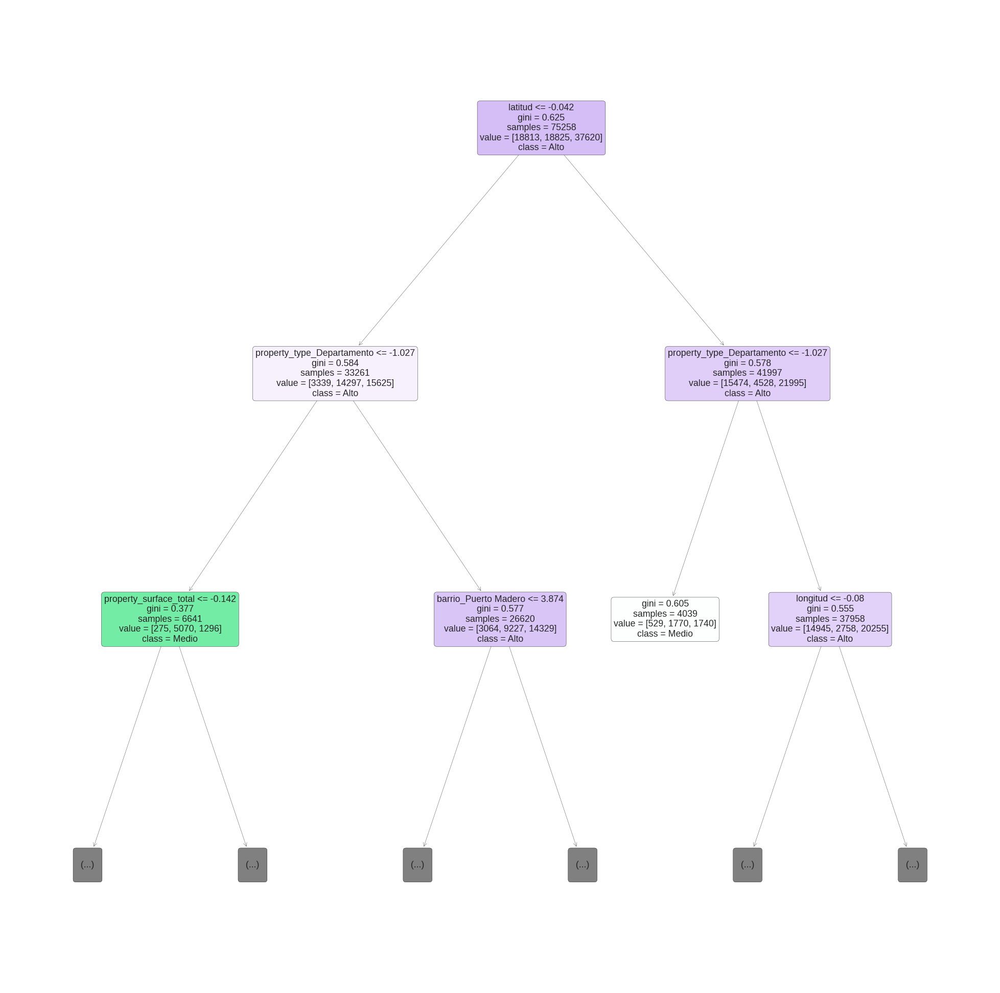

In [248]:
plt.figure(figsize=(25,25))

tree_plot=tree.plot_tree(arbol_estandar,
                         max_depth=2,
                         feature_names=features_estandar,
                         filled=True,
                         rounded=True,
                         class_names=['Bajo', 'Medio', 'Alto'])

plt.show(tree_plot)

In [249]:
#Atributos considerados y su importancia
sorted(list(zip(features, arbol_estandar.feature_importances_)), key=lambda x: -x[1])

[('latitud', 0.4340859792132026),
 ('barrio_Recoleta', 0.14589262133405353),
 ('longitud', 0.11198343770834616),
 ('property_surface_total', 0.06012617815916418),
 ('property_rooms', 0.0),
 ('property_bedrooms', 0.0),
 ('property_surface_covered', 0.0),
 ('barrio_Agronomía', 0.0),
 ('barrio_Almagro', 0.0),
 ('barrio_Balvanera', 0.0),
 ('barrio_Barracas', 0.0),
 ('barrio_Barrio Norte', 0.0),
 ('barrio_Belgrano', 0.0),
 ('barrio_Boca', 0.0),
 ('barrio_Boedo', 0.0),
 ('barrio_Caballito', 0.0),
 ('barrio_Catalinas', 0.0),
 ('barrio_Centro / Microcentro', 0.0),
 ('barrio_Chacarita', 0.0),
 ('barrio_Coghlan', 0.0),
 ('barrio_Colegiales', 0.0),
 ('barrio_Congreso', 0.0),
 ('barrio_Constitución', 0.0),
 ('barrio_Flores', 0.0),
 ('barrio_Floresta', 0.0),
 ('barrio_Las Cañitas', 0.0),
 ('barrio_Liniers', 0.0),
 ('barrio_Mataderos', 0.0),
 ('barrio_Monserrat', 0.0),
 ('barrio_Monte Castro', 0.0),
 ('barrio_Nuñez', 0.0),
 ('barrio_Once', 0.0),
 ('barrio_Palermo', 0.0),
 ('barrio_Parque Avellaneda'

In [250]:
#hacemos una prediccion sobre nuestro set de testing.
y_pred2 = arbol_estandar.predict(x_test2)

veamos la matriz de confusion

Text(70.72222222222221, 0.5, 'True')

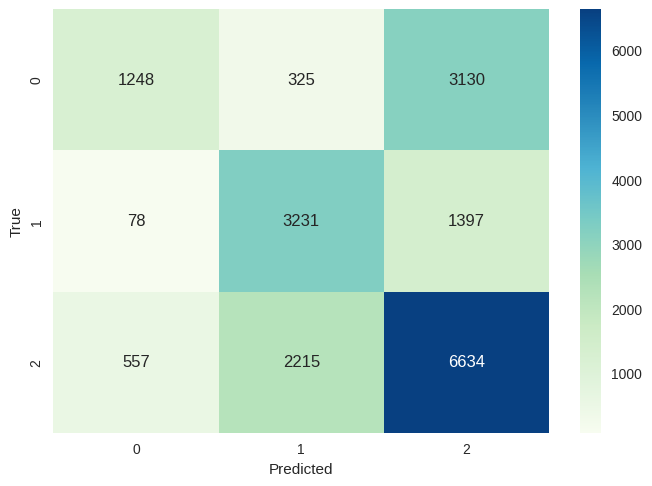

In [251]:
#Creo la matriz de confusión
tabla=confusion_matrix(y_test2, y_pred2)
#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

In [252]:
#vemos las metricas en el conjunto de evaluacion
print(classification_report(y_test2,y_pred2))

              precision    recall  f1-score   support

        Alto       0.66      0.27      0.38      4703
        Bajo       0.56      0.69      0.62      4706
       Medio       0.59      0.71      0.65      9406

    accuracy                           0.59     18815
   macro avg       0.61      0.55      0.55     18815
weighted avg       0.60      0.59      0.57     18815



Conclusion: El resultado es exactamente el mismo estandarizando o no nuestro valores.

#### Modelo 2: Random Forest

a. Construir un clasificador RF y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance. ¿Cuántos folds utilizaron? ¿Qué métrica consideran adecuada para buscar los parámetros?

b. Analizar la importancia de los atributos

c. Mostrar la conformación final de uno de los árboles generados. Si es muy extenso mostrar una porción representativa y explicar las primeras reglas.

d. Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las métricas y mostrar la matriz de confusión. Comparar con la performance de entrenamiento.

##### a. Construir un clasificador RF y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance. ¿Cuántos folds utilizaron? ¿Qué métrica consideran adecuada para buscar los parámetros?

In [253]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from scipy.stats import randint

In [254]:
#Cantidad de combinaciones que quiero probar
n=20

#Conjunto de parámetros que quiero usar
params_grid = {'criterion':['gini','entropy'],
               'max_depth':list(range(1,20)), #ponemos un rango de 20 porque tenemos muchas columnas que evaluar
               'ccp_alpha':np.linspace(0,0.05,n), #ccp para evitar overfitting
               'n_estimators': list(range(1,75))
               }

#Cantidad de splits para el Cross Validation
folds=5

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

# creamos un random forest classifier
rf = RandomForestClassifier()


#Metrica que quiero optimizar Recall
score1 = make_scorer(f1_score, average='weighted')

score2 = make_scorer(accuracy_score, average='weighted')

score3 = make_scorer(recall_score, average='weighted')

scorer_fn = {"F1-Score": score1, "Accuracy": score2, "Recall" : score3}

#Random Search Cross Validation
randomForest = RandomizedSearchCV(estimator=rf,
                              param_distributions = params_grid,
                              scoring=scorer_fn,
                              refit='Recall',
                               cv=kfoldcv,
                              n_iter=n,
                              random_state = 20
                              )

#Busco los hiperparamtros que optimizan a Recall
randomForest.fit(x_train,y_train);

In [255]:
#creando el randomForest con los mejores parametros
random_forest_mejor = RandomForestClassifier().set_params(**randomForest.best_params_)
random_forest_mejor.fit(x_train,y_train)

RandomForestClassifier(ccp_alpha=0.002631578947368421, max_depth=15,
                       n_estimators=68)

In [256]:
# Vemos los mejores hiperparametros
print('Mejores Hiperparametros:',  randomForest.best_params_)

Mejores Hiperparametros: {'n_estimators': 68, 'max_depth': 15, 'criterion': 'gini', 'ccp_alpha': 0.002631578947368421}


#####b. Analizar la importancia de los atributos

In [257]:
sorted(list(zip(features, random_forest_mejor.feature_importances_)), key=lambda x: -x[1])

[('latitud', 0.3105600626677777),
 ('property_type_Departamento', 0.1743921399959049),
 ('barrio_Puerto Madero', 0.08164119983676262),
 ('longitud', 0.08090909746404167),
 ('property_type_PH', 0.0804343624059524),
 ('barrio_Palermo', 0.06339386533135624),
 ('property_surface_total', 0.06274164712141383),
 ('barrio_Belgrano', 0.028776658003694763),
 ('property_rooms', 0.020989314328966894),
 ('barrio_Caballito', 0.019662763060807702),
 ('barrio_Balvanera', 0.017825802267825163),
 ('property_bedrooms', 0.009913461625716786),
 ('barrio_Recoleta', 0.008443847432850028),
 ('property_surface_covered', 0.006836626477979005),
 ('barrio_Villa Lugano', 0.006000358912104191),
 ('barrio_Floresta', 0.003442035020026892),
 ('barrio_Nuñez', 0.002584977469893219),
 ('barrio_Flores', 0.002531274716956096),
 ('barrio_Almagro', 0.0021535104852344836),
 ('barrio_Villa Urquiza', 0.0018498863260894838),
 ('barrio_Mataderos', 0.0018236532780610975),
 ('barrio_Boca', 0.0016610459657410103),
 ('barrio_San Cris

Conclusion: una vez mas observamos que la latitud, la longitud, la superficie total de la propiedad, parecen ser los factores mas determinantes a la hora de definir si el precio de una propiedad es alto, bajo, o medio. Obviamente, la latitud y la longitud tienen una correlacion directa con el barrio en el que se encuentra dicha propiedad, asique podriamos decir que la ubicacion de la propiedad es lo que le otorga, en gran medida, su valor.

##### c. Mostrar la conformación final de uno de los árboles generados. Si es muy extenso mostrar una porción representativa y explicar las primeras reglas.

In [258]:
#para mostrar un arbol representativo del modelo vamos a mantener todos los parametros excepto el max depth, que para mejor visualizacion tendra un valor de 3.
parametros = randomForest.best_params_
print(parametros)
parametros['max_depth'] = 3
print(parametros)

{'n_estimators': 68, 'max_depth': 15, 'criterion': 'gini', 'ccp_alpha': 0.002631578947368421}
{'n_estimators': 68, 'max_depth': 3, 'criterion': 'gini', 'ccp_alpha': 0.002631578947368421}


In [259]:
#creamos nuevamente nuestro random forest con estos nuevos parametros.
random_forest_visualizacion = RandomForestClassifier().set_params(**randomForest.best_params_)
random_forest_visualizacion.fit(x_train,y_train)

RandomForestClassifier(ccp_alpha=0.002631578947368421, max_depth=3,
                       n_estimators=68)

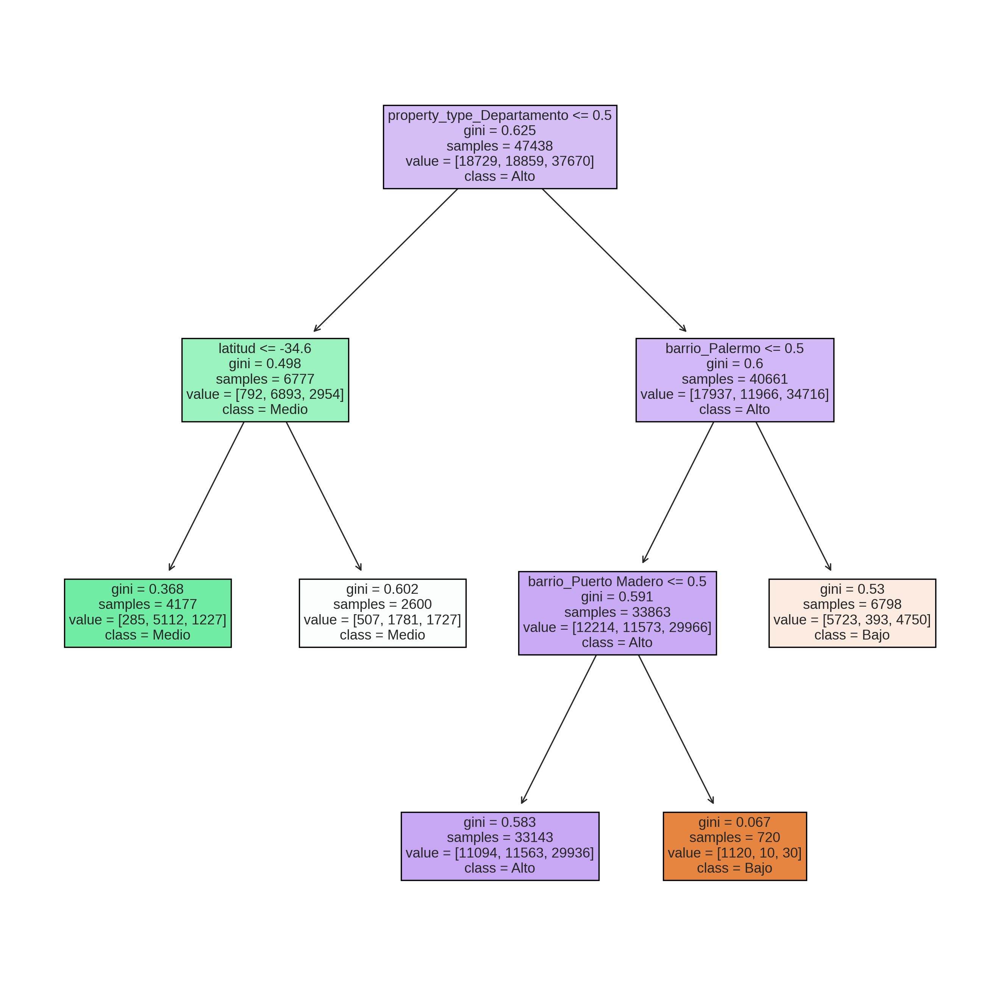

In [260]:
fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (4,4), dpi=800)
tree.plot_tree(random_forest_visualizacion.estimators_[0],
                feature_names = features,
                class_names=['Bajo', 'Medio', 'Alto'],
               filled = True);
fig.savefig('rf_individualtree.png')

Como dijimos antes, la principal importancia parece ser la ubicacion de la propiedad. Por eso las primeras reglas son si esta propiedad nueva pertenece al barrio de palermo o al de belgrano. Luego tenemos valores de superficie total de la propiedad para tener diferentes posibilidades. Estas son las primeras reglas de uno de nuestros arboles.

##### d. Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las métricas y mostrar la matriz de confusión. Comparar con la performance de entrenamiento.

In [261]:
#hacemos una prediccion sobre nuestro conjunto de entrenamiento y nuestro conjunto de evaluacion.
y_pred_train = random_forest_mejor.predict(x_train)
y_pred = random_forest_mejor.predict(x_test)

Text(70.72222222222221, 0.5, 'True')

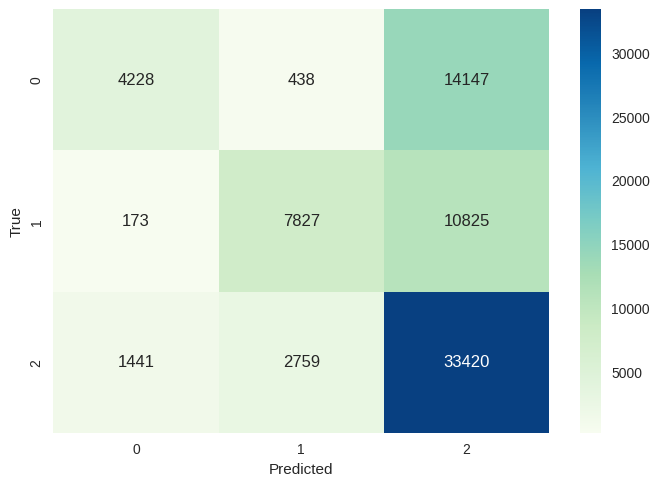

In [262]:
#Creo la matriz de confusión para nuestro conjunto de entrenamiento
tabla=confusion_matrix(y_train, y_pred_train)
#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

In [263]:
#vemos las metricas en el conjunto de entrenamiento
print(classification_report(y_train,y_pred_train))

              precision    recall  f1-score   support

        Alto       0.72      0.22      0.34     18813
        Bajo       0.71      0.42      0.52     18825
       Medio       0.57      0.89      0.70     37620

    accuracy                           0.60     75258
   macro avg       0.67      0.51      0.52     75258
weighted avg       0.64      0.60      0.56     75258



ahora repetimos pero para el conjunto de evaluacion

Text(70.72222222222221, 0.5, 'True')

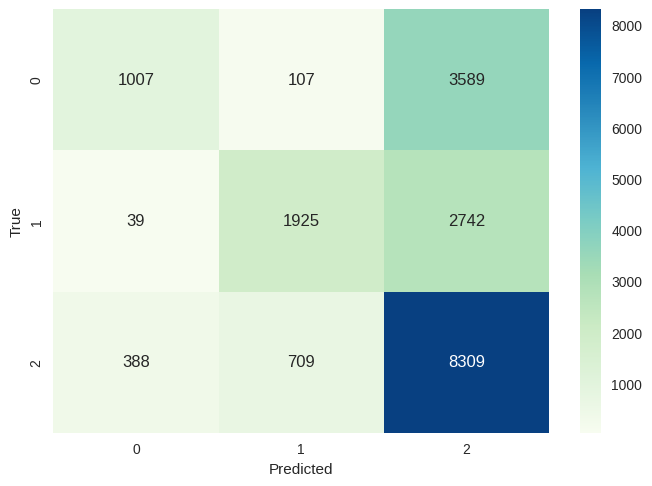

In [264]:
#Creo la matriz de confusión
tabla=confusion_matrix(y_test, y_pred)
#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

In [265]:
#vemos las metricas en el conjunto de evaluacion
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        Alto       0.70      0.21      0.33      4703
        Bajo       0.70      0.41      0.52      4706
       Medio       0.57      0.88      0.69      9406

    accuracy                           0.60     18815
   macro avg       0.66      0.50      0.51     18815
weighted avg       0.63      0.60      0.56     18815



Comparando los valores de Recall en nuestro conjunto de evaluacion y nuestro conjunto de entrenamiento, obsevamos que son similares. Nuestro conjunto de entrenamiento tiene una efectividad un poco mayor que cuando realizamos predicciones sobre el conjunto de evaluacion, pero seguimos teniendo valores que consideramos, al menos, una mejora sobre el modelo del arbol de decision. A su vez, que no podamos predecir de manera correcta todas las observaciones nos permite asegurar que no hubo overfitting ya que tanto nuestro conjunto de entrenamiento como el de evaluacion no fueron predecidos con un 100% de efectividad, lo cual es positivo para nosotros.

Para cerrar, como este modelo consiguio una performance mejor que el modelo de arbol de decision, vamos a utilizar el modelo ya conseguido para continuar por ahora.

#### Modelo 3: KNN Classifier



a. En este punto se debe entrenar (mediante cross-validation) un modelo elegido por el grupo. Se debe evaluar su performance en entrenamiento y sobre el conjunto de evaluación, explicar todas las métricas y mostrar la matriz de confusión.

##### a. entrenar (mediante cross-validation) un modelo elegido por el grupo. Evaluar su performance en entrenamiento y sobre el conjunto de evaluación, explicar todas las métricas y mostrar la matriz de confusión.

In [266]:
from sklearn.neighbors import KNeighborsClassifier

Si bien para KNN las distancias son la forma de clasificacion y por ende estandarizar los datos suele ser conveniente, veamos que resultados obtenemos con nuestro dataset sin estandarizar.

In [267]:
#Cantidad de combinaciones que quiero probar
n=20

#Conjunto de parámetros que quiero usar
params_grid = {'n_neighbors':list(range(1,25)), #de 1 a 25 vecinos mas cercanos para evaluar
              'weights': ['uniform', 'distance'],
               'algorithm': ['auto', 'ball_tree']
               }

#Cantidad de splits para el Cross Validation
folds=5

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

# creamos un KNN classifier
KNN =  KNeighborsClassifier()


#Metrica que quiero optimizar Recall
score1 = make_scorer(f1_score, average='weighted')

score2 = make_scorer(accuracy_score, average='weighted')

score3 = make_scorer(recall_score, average='weighted')

scorer_fn = {"F1-Score": score1, "Accuracy": score2, "Recall" : score3}

#Random Search Cross Validation
random_search_KNN_clasiffier = RandomizedSearchCV(estimator=KNN,
                              param_distributions = params_grid,
                              scoring=scorer_fn,
                              refit='Recall',
                               cv=kfoldcv,
                              n_iter=n,
                              random_state = 20
                              )

#Busco los hiperparamtros que optimizan Recall
random_search_KNN_clasiffier.fit(x_train,y_train);

In [268]:
#creando el KNN con los mejores parametros
KNN_mejor_clasificacion = KNeighborsClassifier().set_params(**random_search_KNN_clasiffier.best_params_)
KNN_mejor_clasificacion.fit(x_train,y_train)

KNeighborsClassifier(algorithm='ball_tree', n_neighbors=20, weights='distance')

In [269]:
# Vemos los mejores hiperparametros
print('Mejores hiperparametros:',  random_search_KNN_clasiffier.best_params_)

Mejores hiperparametros: {'weights': 'distance', 'n_neighbors': 20, 'algorithm': 'ball_tree'}


predicciones para el conjunto de entrenamiento y de evaluacion con sus metricas.

In [270]:
#hacemos una prediccion sobre nuestro conjunto de entrenamiento.
y_pred_train = KNN_mejor_clasificacion.predict(x_train)
y_pred = KNN_mejor_clasificacion.predict(x_test)

Text(70.72222222222221, 0.5, 'True')

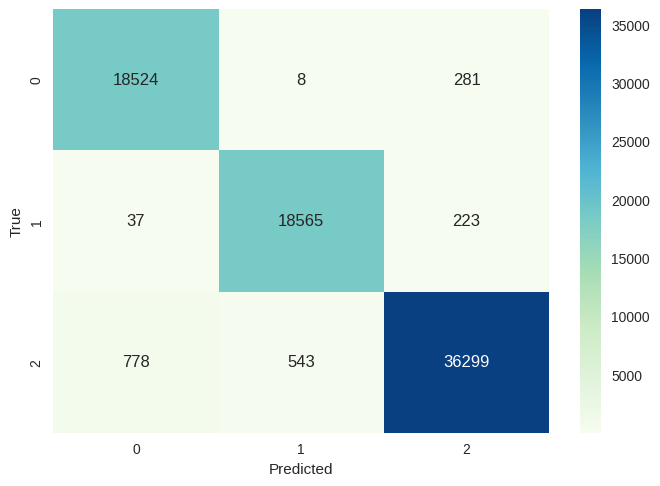

In [271]:
#Creo la matriz de confusión para nuestro conjunto de entrenamiento
tabla=confusion_matrix(y_train, y_pred_train)
#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

In [272]:
#vemos las metricas en el conjunto de entrenamiento
print(classification_report(y_train,y_pred_train))

              precision    recall  f1-score   support

        Alto       0.96      0.98      0.97     18813
        Bajo       0.97      0.99      0.98     18825
       Medio       0.99      0.96      0.98     37620

    accuracy                           0.98     75258
   macro avg       0.97      0.98      0.98     75258
weighted avg       0.98      0.98      0.98     75258



ahora repetimos pero para el conjunto de evaluacion

Text(70.72222222222221, 0.5, 'True')

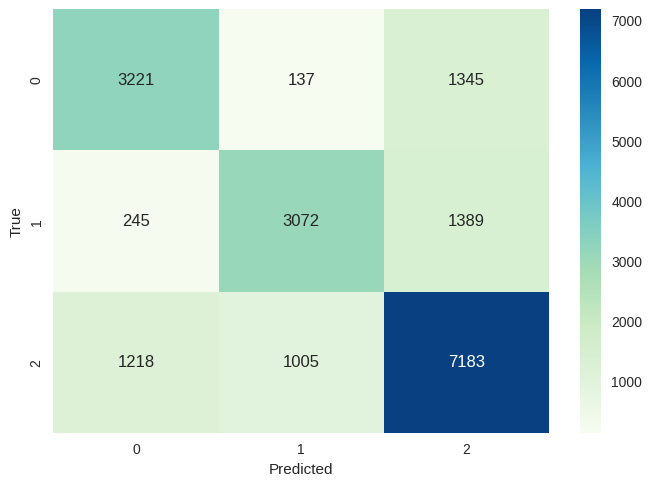

In [273]:
#Creo la matriz de confusión
tabla=confusion_matrix(y_test, y_pred)
#Grafico la matriz de confusión
sns.heatmap(tabla,cmap='GnBu',annot=True,fmt='g')
plt.xlabel('Predicted')
plt.ylabel('True')

In [274]:
#vemos las metricas en el conjunto de evaluacion
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

        Alto       0.69      0.68      0.69      4703
        Bajo       0.73      0.65      0.69      4706
       Medio       0.72      0.76      0.74      9406

    accuracy                           0.72     18815
   macro avg       0.71      0.70      0.71     18815
weighted avg       0.72      0.72      0.72     18815



Conclusion: En las metricas sobre nuestro conjunto de entrenamiento observamos una taza de acierto muy alta, con esta informacion podriamos considerar un caso de over-fitting, sin embargo, a la hora de ver nuestras metricas en el conjunto de evaluacion, vemos valores que se asemejan mas a lo que esperamos de un modelo que entrenamos nosotros. Vale aclarar que, incluso, este modelo parece tener una performance incluso mejor sobre nuestro set de evaluacion que el modelo de random forest.
Como conlusion final decidimos tomar este modelo como nuestro modelo para problemas de clasificacion debido a que es el que mejores metricas de performance nos ha dado.

## 4. Regresion

En esta etapa se busca predecir el precio de la propiedad utilizando dos modelos diferentes.

Para todos los modelos se pide realizar las tareas de ingeniería de características necesarias para trabajar con cada algoritmo (encoding, normalización, etc).

Modelo 1: KNN

a. Construir un modelo KNN para regresión y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance .¿Cuántos folds utilizaron?
¿Qué métrica consideran adecuada para buscar los parámetros?

b. Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las métricas. Comparar con la performance de entrenamiento.

Modelo 2: XGBoost

a. Construir un modelo XGBoost y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance. ¿Cuántos folds utilizaron? ¿Qué métrica consideran adecuada para buscar los parámetros?

b. Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las métricas. Comparar con la performance de entrenamiento.

Modelo 3: a elección

a. En este punto se debe entrenar (mediante cross-validation) un modelo elegido por el grupo. Se debe evaluar su performance en entrenamiento y sobre el conjunto de evaluación explicando todas las métricas.
¿Qué modelo elegirían para predecir el precio de venta de las propiedades?

### Modelo 1: KNN Regressor



#### a. Construir un modelo KNN para regresión y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance .¿Cuántos folds utilizaron? ¿Qué métrica consideran adecuada para buscar los parámetros?

In [275]:
from sklearn.neighbors import KNeighborsRegressor

para utilizar estos modelos, tenemos que tener nuevas separaciones para predecir el precio de la propiedad, y no la variable 'tipo_precio' como veniamos haciendo hasta ahora. Hacemos las divisiones nuevamente. A su vez, vamos a estandarizar los datos para poder trabajar con ellos porque KNN trabaja con distancias, por lo que tener todos los features dentro del mismo rango pareceria tener sentido.
Por otro lado, elegir una metrica por sobre otra para este caso no parece que vaya a ser de mucha relevancia, vamos a utilizar la metrica de 'mean absolute error'.

In [276]:
properati_modelos.columns.to_list()

['latitud',
 'longitud',
 'property_rooms',
 'property_bedrooms',
 'property_surface_total',
 'property_surface_covered',
 'property_price',
 'pxm2',
 'barrio_Agronomía',
 'barrio_Almagro',
 'barrio_Balvanera',
 'barrio_Barracas',
 'barrio_Barrio Norte',
 'barrio_Belgrano',
 'barrio_Boca',
 'barrio_Boedo',
 'barrio_Caballito',
 'barrio_Catalinas',
 'barrio_Centro / Microcentro',
 'barrio_Chacarita',
 'barrio_Coghlan',
 'barrio_Colegiales',
 'barrio_Congreso',
 'barrio_Constitución',
 'barrio_Flores',
 'barrio_Floresta',
 'barrio_Las Cañitas',
 'barrio_Liniers',
 'barrio_Mataderos',
 'barrio_Monserrat',
 'barrio_Monte Castro',
 'barrio_Nuñez',
 'barrio_Once',
 'barrio_Palermo',
 'barrio_Parque Avellaneda',
 'barrio_Parque Centenario',
 'barrio_Parque Chacabuco',
 'barrio_Parque Chas',
 'barrio_Parque Patricios',
 'barrio_Paternal',
 'barrio_Pompeya',
 'barrio_Puerto Madero',
 'barrio_Recoleta',
 'barrio_Retiro',
 'barrio_Saavedra',
 'barrio_San Cristobal',
 'barrio_San Nicolás',
 'barri

In [277]:
#estandarizamos los datos
properati_estandarizar = properati_modelos.copy()
properati_estandarizar[properati_estandarizar.columns] = StandardScaler().fit_transform(properati_estandarizar)

properati_estandarizar.head(5)

,latitud,longitud,property_rooms,property_bedrooms,property_surface_total,property_surface_covered,property_price,pxm2,barrio_Agronomía,barrio_Almagro,...,barrio_Villa Ortuzar,barrio_Villa Pueyrredón,barrio_Villa Real,barrio_Villa Riachuelo,barrio_Villa Santa Rita,barrio_Villa Soldati,barrio_Villa Urquiza,barrio_Villa del Parque,property_type_Departamento,property_type_PH
25,-0.268582,0.316651,0.846017,0.846017,1.200876,0.846017,-0.047765,-0.554183,-0.050043,-0.212897,...,-0.08412,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,-2.460608,-0.330386
42,-0.268582,0.316651,0.128192,0.128192,-0.428418,0.128192,-0.475687,-0.468940,-0.050043,-0.212897,...,-0.08412,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,0.406404,-0.330386
43,-0.217070,0.313916,0.846017,0.846017,-0.255395,0.846017,-0.421481,-0.475304,-0.050043,-0.212897,...,-0.08412,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,0.406404,-0.330386
49,-0.106474,0.167292,0.846017,0.846017,0.439578,0.846017,-0.263241,-0.551166,-0.050043,-0.212897,...,-0.08412,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,0.406404,-0.330386
51,-0.234737,0.112793,0.846017,0.846017,0.439578,0.846017,0.086907,-0.178463,-0.050043,-0.212897,...,-0.08412,-0.104229,-0.038881,-0.019292,-0.068394,-0.021876,-0.228422,-0.140694,-2.460608,3.026758


In [278]:
#buscamos los features
target = 'property_price'
features_estandar = properati_estandarizar.columns.to_list()
features_estandar.remove(target)

#vamos a remover variables que otorgarian demasiada informacion para que no influya en nuestra clasificacion
#ya que otorgaria demasiada informacion, causando overfitting.

features_estandar.remove('pxm2')

Y =  properati_modelos[target].values #guardamos los valores de la columna de property_price pero sin estandarizar

properati_estandarizar = properati_estandarizar.drop(columns= [target])

X_estandar = properati_estandarizar[features].values #guardamos los valores de todas las columnas restantes

In [279]:
#vemos todos los atributos que vamos a usar para entrenar nuestro modelo
print(features)

['latitud', 'longitud', 'property_rooms', 'property_bedrooms', 'property_surface_total', 'property_surface_covered', 'barrio_Agronomía', 'barrio_Almagro', 'barrio_Balvanera', 'barrio_Barracas', 'barrio_Barrio Norte', 'barrio_Belgrano', 'barrio_Boca', 'barrio_Boedo', 'barrio_Caballito', 'barrio_Catalinas', 'barrio_Centro / Microcentro', 'barrio_Chacarita', 'barrio_Coghlan', 'barrio_Colegiales', 'barrio_Congreso', 'barrio_Constitución', 'barrio_Flores', 'barrio_Floresta', 'barrio_Las Cañitas', 'barrio_Liniers', 'barrio_Mataderos', 'barrio_Monserrat', 'barrio_Monte Castro', 'barrio_Nuñez', 'barrio_Once', 'barrio_Palermo', 'barrio_Parque Avellaneda', 'barrio_Parque Centenario', 'barrio_Parque Chacabuco', 'barrio_Parque Chas', 'barrio_Parque Patricios', 'barrio_Paternal', 'barrio_Pompeya', 'barrio_Puerto Madero', 'barrio_Recoleta', 'barrio_Retiro', 'barrio_Saavedra', 'barrio_San Cristobal', 'barrio_San Nicolás', 'barrio_San Telmo', 'barrio_Tribunales', 'barrio_Velez Sarsfield', 'barrio_Vers

In [280]:
print(X_estandar.shape, Y.shape)

(94073, 64) (94073,)


In [281]:
#Separo un set de Evaluacion

x_train_estandar, x_test_estandar, y_train_estandar, y_test_estandar = train_test_split(X_estandar, Y,
                                                    test_size=0.2,
                                                    random_state=5, #para poder reproducir el experimento
                                                    )

#Verifico Cantidad de Datos en cada set
print('# Datos Entrenamiento: {}'.format(len(x_train)))
print('# Datos Prueba: {}'.format(len(x_test)))

# Datos Entrenamiento: 75258
# Datos Prueba: 18815


In [282]:
from sklearn.metrics import mean_absolute_error, mean_squared_error

In [283]:
#Cantidad de combinaciones que quiero probar
n=10

#Conjunto de parámetros que quiero usar
params_grid = {'n_neighbors':[1,5,10,15,20,25], #Probamos algunos valores
              'weights': ['uniform', 'distance'],
               }

#Cantidad de splits para el Cross Validation
folds=5

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

# creamos un KNN regressor
KNN =  KNeighborsRegressor()


#Metrica que quiero optimizar mean_absolute_error
#el (greater_is_better = false) cumple la idea de que estos valores optimizan mi modelo
#cuanto menor sean mis valores de mean_absolute_error, no mayor.

score1 = make_scorer(mean_absolute_error, greater_is_better=False)


#Random Search Cross Validation
random_search_KNN_regressor = RandomizedSearchCV(estimator=KNN,
                              param_distributions = params_grid,
                              scoring=score1,
                              cv = kfoldcv,
                              refit=True,
                              n_iter=n,
                              random_state = 20
                              )

#Busco los hiperparamtros que optimizan mean_absolute_error
random_search_KNN_regressor.fit(x_train_estandar,y_train_estandar)

RandomizedSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
                   estimator=KNeighborsRegressor(),
                   param_distributions={'n_neighbors': [1, 5, 10, 15, 20, 25],
                                        'weights': ['uniform', 'distance']},
                   random_state=20,
                   scoring=make_scorer(mean_absolute_error, greater_is_better=False))

In [284]:
#creando el KNN con los mejores parametros
KNN_mejor_regresion = KNeighborsRegressor().set_params(**random_search_KNN_regressor.best_params_)
KNN_mejor_regresion.fit(x_train_estandar,y_train_estandar)

KNeighborsRegressor(n_neighbors=25, weights='distance')

In [285]:
# vemos los mejores hiperparametros
print('Mejores hiperparametros:',  random_search_KNN_regressor.best_params_)

Mejores hiperparametros: {'weights': 'distance', 'n_neighbors': 25}


#### b. Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las métricas. Comparar con la performance de entrenamiento.

predicciones para el conjunto de entrenamiento y de evaluacion con sus metricas.

In [286]:
#hacemos una prediccion sobre nuestro conjunto de entrenamiento y evaluacion.
y_pred_train = KNN_mejor_regresion.predict(x_train_estandar)
y_pred = KNN_mejor_regresion.predict(x_test_estandar)

vamos a ver las metricas para nuestro conjunto de entrenamiento.

In [287]:
# Mean Absolute Error
mae = mean_absolute_error(y_train_estandar, y_pred_train)

#mean squared error
mse =  mean_squared_error(y_train_estandar, y_pred_train)

# Root Mean Squared Error
rmse = mean_squared_error(y_train_estandar, y_pred_train, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 3306.904562550607
Mean Squared Error: 343460061.192695
Root Mean Squared Error: 18532.675500118567


ahora repetimos pero para el conjunto de evaluacion

In [288]:
# Mean Absolute Error
mae = mean_absolute_error(y_test_estandar, y_pred)

#mean squared error
mse =  mean_squared_error(y_test_estandar, y_pred)

# Root Mean Squared Error
rmse = mean_squared_error(y_test_estandar, y_pred, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 37653.45274400571
Mean Squared Error: 18035040721.185505
Root Mean Squared Error: 134294.60421470963


Nuestras metricas no son tan buenas como esperabamos. Esto puede deberse a que KNN regresion no es el mejor modelo para tratar con tantos datos y el hecho de que utilice distancias para funcionar puede ser la razon principal por la que no funciona como esperamos.
Por otro lado, observamos que la diferencia en las metricas entre nuestro conjunto de entrenamiento y nuestro conjunto de evaluacion son muy altas. El MAE de nuestro conjunto de evaluacion es alrededor de 10 veces mayor que en nuestro conjunto de entrenamiento, por lo que concluimos que estamos ante un caso de over-fitting. Para prevenir estos casos, podemos reducir el numero de K-neighbors que obtuvimos en el cross-validation. El numero que obtuvimos fue de 25 vecinos mas cercanos, vamos a probar con 10 vecinos y obvservar nuestras metricas nuevamente.


#### Prueba intentando evitar over-fitting

In [289]:
#cambiamos nuestro valor de neighbors
parametros_knn = random_search_KNN_regressor.best_params_
parametros_knn['n_neighbors'] = 10

In [290]:
#creando el KNN con los mejores parametros
KNN_mejor_regresion2 = KNeighborsRegressor().set_params(**parametros_knn)
KNN_mejor_regresion2.fit(x_train_estandar,y_train_estandar)

KNeighborsRegressor(n_neighbors=10, weights='distance')

predicciones para el conjunto de entrenamiento y de evaluacion con sus metricas.

In [291]:
#hacemos una prediccion sobre nuestro conjunto de entrenamiento y evaluacion.
y_pred_train = KNN_mejor_regresion2.predict(x_train_estandar)
y_pred = KNN_mejor_regresion2.predict(x_test_estandar)

vamos a ver las metricas para nuestro conjunto de entrenamiento.

In [292]:
# Mean Absolute Error
mae = mean_absolute_error(y_train_estandar, y_pred_train)

#mean squared error
mse =  mean_squared_error(y_train_estandar, y_pred_train)

# Root Mean Squared Error
rmse = mean_squared_error(y_train_estandar, y_pred_train, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 3316.388969496566
Mean Squared Error: 347000704.2700171
Root Mean Squared Error: 18627.954913785277


ahora repetimos pero para el conjunto de evaluacion

In [293]:
# Mean Absolute Error
mae = mean_absolute_error(y_test_estandar, y_pred)

#mean squared error
mse =  mean_squared_error(y_test_estandar, y_pred)

# Root Mean Squared Error
rmse = mean_squared_error(y_test_estandar, y_pred, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 38167.44438824554
Mean Squared Error: 18544000269.723755
Root Mean Squared Error: 136176.35723474083


mantenemos el mismo problema, probemos bajando todavia mas nuestros vecinos mas cercanos.

In [294]:
#creando el KNN con los mejores parametros
parametros_knn['n_neighbors'] = 4
KNN_mejor_regresion3 = KNeighborsRegressor().set_params(**parametros_knn)
KNN_mejor_regresion3.fit(x_train_estandar,y_train_estandar)

KNeighborsRegressor(n_neighbors=4, weights='distance')

predicciones para el conjunto de entrenamiento y de evaluacion con sus metricas.

In [295]:
#hacemos una prediccion sobre nuestro conjunto de entrenamiento y evaluacion.
y_pred_train = KNN_mejor_regresion3.predict(x_train_estandar)
y_pred = KNN_mejor_regresion3.predict(x_test_estandar)

vamos a ver las metricas para nuestro conjunto de entrenamiento.

In [296]:
# Mean Absolute Error
mae = mean_absolute_error(y_train_estandar, y_pred_train)

#mean squared error
mse =  mean_squared_error(y_train_estandar, y_pred_train)

# Root Mean Squared Error
rmse = mean_squared_error(y_train_estandar, y_pred_train, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 3362.3595321819485
Mean Squared Error: 370719446.17452466
Root Mean Squared Error: 19254.0760924674


ahora repetimos pero para el conjunto de evaluacion

In [297]:
# Mean Absolute Error
mae = mean_absolute_error(y_test_estandar, y_pred)

#mean squared error
mse =  mean_squared_error(y_test_estandar, y_pred)

# Root Mean Squared Error
rmse = mean_squared_error(y_test_estandar, y_pred, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 39399.16042816434
Mean Squared Error: 19348221122.067303
Root Mean Squared Error: 139097.8832407859


Conclusion: nuestro modelo de KNN tiene over-fitting, quiza se deba a la normalizacion de nuestros datos o simplemente que KNN no es un buen modelo para resolver este problema de regresion.
Avanzaremos y veremos si XGBoost nos otorga mejores resultados de regresion.

### Modelo 2: XGBoost

#### a. Construir un modelo XGBoost y optimizar sus hiperparámetros mediante k-fold Cross Validation para obtener la mejor performance. ¿Cuántos folds utilizaron? ¿Qué métrica consideran adecuada para buscar los parámetros?

In [298]:
!pip install 'xgboost'
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.model_selection import GridSearchCV

In [299]:
# inicializamos el XGBoost
modelo = XGBRegressor(random_state = 1)

# HiperParametros para el grid-Search, probamos algunos valores para ver cual nos funciona mejor
params_grid = {
    'learning_rate' : [0.1, 0.2],
    'max_depth' : [5,  10, 15, 20],
    'n_estimators' : [5, 10, 15, 20],
    'lambda': [0.1, 0.2],
    'alpha': [0.01, 0.02],
}

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

# Hacemos el cross-validation, esta vez utilizamos grid search en vez de random search.
grid_search = GridSearchCV(modelo, params_grid, cv=kfoldcv, scoring='neg_mean_absolute_error')
grid_search.fit(x_train_estandar, y_train_estandar)

# Entrenamos el modelo una vez obtenidos los mejores parametros.
modelo_XGBoost = XGBRegressor(**grid_search.best_params_)
modelo_XGBoost.fit(x_train_estandar, y_train_estandar)

XGBRegressor(alpha=0.02, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda=0.2, learning_rate=0.2,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=20, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=20, n_jobs=None, ...)

In [300]:
# vemos los mejores hiperparametros
print('Mejores hiperparametros:',  grid_search.best_params_)

Mejores hiperparametros: {'alpha': 0.02, 'lambda': 0.2, 'learning_rate': 0.2, 'max_depth': 20, 'n_estimators': 20}


####b. Evaluar la performance del modelo en el conjunto de evaluación, explicar todas las métricas. Comparar con la performance de entrenamiento.

In [301]:
#hacemos una prediccion sobre nuestro conjunto de entrenamiento y evaluacion.
y_pred_train = modelo_XGBoost.predict(x_train_estandar)
y_pred = modelo_XGBoost.predict(x_test_estandar)

vamos a ver las metricas para nuestro conjunto de entrenamiento.

In [302]:
# Mean Absolute Error
mae = mean_absolute_error(y_train_estandar, y_pred_train)

#mean squared error
mse =  mean_squared_error(y_train_estandar, y_pred_train)

# Root Mean Squared Error
rmse = mean_squared_error(y_train_estandar, y_pred_train, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 10889.81268989364
Mean Squared Error: 824704685.3446672
Root Mean Squared Error: 28717.672004267115


ahora repetimos pero para el conjunto de evaluacion

In [303]:
# Mean Absolute Error
mae = mean_absolute_error(y_test_estandar, y_pred)

#mean squared error
mse =  mean_squared_error(y_test_estandar, y_pred)

# Root Mean Squared Error
rmse = mean_squared_error(y_test_estandar, y_pred, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 38628.35695464058
Mean Squared Error: 21270985939.154434
Root Mean Squared Error: 145845.76078568219


Conclusion: Si bien el modulo de nuestros errores es un poco mas de 10 veces mayor en nuestro XGBoost que en nuestro KNN regression, podemos ver que la diferencia entre nuestros errores de entrenamiento y evaluacion son mucho menores aqui. Podemos interpretar el caso de KNN como un overfitting, o que quiza, mejorando los parametros de nuestro XGBoost incluso mas, o buscando nuevos features que ayuden a las regresiones, obtener mejores resultados. Antes de ver el ultimo modelo, observemos que sucederia si aumentamos la cantidad de estimadores y su profundidad maxima al doble. Para evitar un over-fitting, pongamos un alpha y un gamma de 0.01 y 0.1

In [304]:
mejores_parametros_XGboost = grid_search.best_params_
mejores_parametros_XGboost['alpha'] = 0.01
mejores_parametros_XGboost['lambda'] = 0.1
mejores_parametros_XGboost['learning_rate'] = 0.1
mejores_parametros_XGboost['max_depth'] = 40
mejores_parametros_XGboost['n_estimators'] = 40
modelo_XGBoost2 = XGBRegressor(**mejores_parametros_XGboost)
modelo_XGBoost2.fit(x_train_estandar, y_train_estandar)

XGBRegressor(alpha=0.01, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda=0.1, learning_rate=0.1,
             max_bin=None, max_cat_threshold=None, max_cat_to_onehot=None,
             max_delta_step=None, max_depth=40, max_leaves=None,
             min_child_weight=None, missing=nan, monotone_constraints=None,
             multi_strategy=None, n_estimators=40, n_jobs=None, ...)

In [305]:
#hacemos una prediccion sobre nuestro conjunto de entrenamiento y evaluacion.
y_pred_train = modelo_XGBoost2.predict(x_train_estandar)
y_pred = modelo_XGBoost2.predict(x_test_estandar)

vamos a ver las metricas para nuestro conjunto de entrenamiento.

In [306]:
# Mean Absolute Error
mae = mean_absolute_error(y_train_estandar, y_pred_train)

#mean squared error
mse =  mean_squared_error(y_train_estandar, y_pred_train)

# Root Mean Squared Error
rmse = mean_squared_error(y_train_estandar, y_pred_train, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 6448.640527029726
Mean Squared Error: 711720672.3984885
Root Mean Squared Error: 26678.093492573425


ahora repetimos pero para el conjunto de evaluacion

In [307]:
# Mean Absolute Error
mae = mean_absolute_error(y_test_estandar, y_pred)

#mean squared error
mse =  mean_squared_error(y_test_estandar, y_pred)

# Root Mean Squared Error
rmse = mean_squared_error(y_test_estandar, y_pred, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 39608.61948993489
Mean Squared Error: 21942466188.937263
Root Mean Squared Error: 148129.89633742833


Observamos, al igual que con KNN, un claro caso de over-fitting. Bajemos aun mas el learning-rate y aumentemos los parametros de regularizacion y hacemos una ultima prueba

In [321]:
mejores_parametros_XGboost = grid_search.best_params_
mejores_parametros_XGboost['alpha'] = 0.1
mejores_parametros_XGboost['lambda'] = 0.1
mejores_parametros_XGboost['learning_rate'] = 0.1
mejores_parametros_XGboost['max_depth'] = 40
mejores_parametros_XGboost['n_estimators'] = 40
modelo_XGBoost2 = XGBRegressor(**mejores_parametros_XGboost)
modelo_XGBoost2.fit(x_train_estandar, y_train_estandar)

XGBRegressor(alpha=0.1, base_score=None, booster=None, callbacks=None,
             colsample_bylevel=None, colsample_bynode=None,
             colsample_bytree=None, device=None, early_stopping_rounds=None,
             enable_categorical=False, eval_metric=None, feature_types=None,
             gamma=None, grow_policy=None, importance_type=None,
             interaction_constraints=None, lambda=0.1, learning_rate=0.1,
             loss='square', max_bin=None, max_cat_threshold=None,
             max_cat_to_onehot=None, max_delta_step=None, max_depth=40,
             max_leaves=None, min_child_weight=None, missing=nan,
             monotone_constraints=None, multi_strategy=None, n_estimators=40, ...)

In [322]:
#hacemos una prediccion sobre nuestro conjunto de entrenamiento y evaluacion.
y_pred_train = modelo_XGBoost2.predict(x_train_estandar)
y_pred = modelo_XGBoost2.predict(x_test_estandar)

vamos a ver las metricas para nuestro conjunto de entrenamiento.

In [323]:
# Mean Absolute Error
mae = mean_absolute_error(y_train_estandar, y_pred_train)

#mean squared error
mse =  mean_squared_error(y_train_estandar, y_pred_train)

# Root Mean Squared Error
rmse = mean_squared_error(y_train_estandar, y_pred_train, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 6448.106311930189
Mean Squared Error: 711719253.9099654
Root Mean Squared Error: 26678.066907292316


ahora repetimos pero para el conjunto de evaluacion

In [324]:
# Mean Absolute Error
mae = mean_absolute_error(y_test_estandar, y_pred)

#mean squared error
mse =  mean_squared_error(y_test_estandar, y_pred)

# Root Mean Squared Error
rmse = mean_squared_error(y_test_estandar, y_pred, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 39611.60241169155
Mean Squared Error: 21942748040.22616
Root Mean Squared Error: 148130.84769968124


Conclusion: Observamos que nuestro mejor modelo es el primero de los 3 que probamos, ya que neustras metricas son las mejores dentro de los 3 modelos entrenados. Hasta ahora es el que mas confianza nos genera ya que, a diferencia del KNN, no tenemos un caso de over-fitting. Continuamos con el ultimo modelo

### Modelo 3:Adaboost de regresion (a elección)

#### a. En este punto se debe entrenar (mediante cross-validation) un modelo elegido por el grupo. Se debe evaluar su performance en entrenamiento y sobre el conjunto de evaluación explicando todas las métricas. ¿Qué modelo elegirían para predecir el precio de venta de las propiedades?

Hagamos el cross validation para nuestro AdaBoostRegressor, luego agregaremos como estimador base a nuestro KNN.

In [312]:
from sklearn.ensemble import AdaBoostRegressor
# inicializamos el AdaBoost
modelo = AdaBoostRegressor(random_state = 1)

#HiperParametros para el grid search.
params_grid = {
    'learning_rate' : [0.1, 0.2],
    'n_estimators' : list(range(1,16)),
    'loss' : ['linear', 'square'],
}

#Kfold estratificado
kfoldcv = StratifiedKFold(n_splits=folds)

# Hacemos el cross-validation, esta vez utilizamos grid search en vez de random search.
grid_search = GridSearchCV(modelo, params_grid, cv=kfoldcv, scoring='neg_mean_absolute_error')
grid_search.fit(x_train_estandar, y_train_estandar)

GridSearchCV(cv=StratifiedKFold(n_splits=5, random_state=None, shuffle=False),
             estimator=AdaBoostRegressor(random_state=1),
             param_grid={'learning_rate': [0.1, 0.2],
                         'loss': ['linear', 'square'],
                         'n_estimators': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12,
                                          13, 14, 15]},
             scoring='neg_mean_absolute_error')

In [313]:
#entrenamos nuestro adaboost con los mejores parametros.
adaboost_mejor = AdaBoostRegressor(**grid_search.best_params_)
adaboost_mejor.fit(x_train_estandar, y_train_estandar)

AdaBoostRegressor(learning_rate=0.1, loss='square', n_estimators=11)

In [314]:
#realizamos nuestras predicciones
y_pred_train = adaboost_mejor.predict(x_train_estandar)
y_pred = adaboost_mejor.predict(x_test_estandar)

vamos a ver las metricas para nuestro conjunto de entrenamiento.

In [315]:
# Mean Absolute Error
mae = mean_absolute_error(y_train_estandar, y_pred_train)

#mean squared error
mse =  mean_squared_error(y_train_estandar, y_pred_train)

# Root Mean Squared Error
rmse = mean_squared_error(y_train_estandar, y_pred_train, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 88825.96893685969
Mean Squared Error: 38532062395.767685
Root Mean Squared Error: 196295.85425007754


ahora repetimos pero para el conjunto de evaluacion

In [316]:
# Mean Absolute Error
mae = mean_absolute_error(y_test_estandar, y_pred)

#mean squared error
mse =  mean_squared_error(y_test_estandar, y_pred)

# Root Mean Squared Error
rmse = mean_squared_error(y_test_estandar, y_pred, squared=False)

print("Mean Absolute Error:", mae)
print("Mean Squared Error:", mse)
print("Root Mean Squared Error:", rmse)

Mean Absolute Error: 88447.65147439433
Mean Squared Error: 42299170364.00589
Root Mean Squared Error: 205667.62108802126


Conclusion: Al igual que con el XGBoost, nuestro modelo tiene errores muy altos, pero la diferencia entre las metricas de entrenamiento y las de evaluacion es muy poca, sin embargo, el modelo de XGBoost nos acerco a un valor mejor con respecto al AdaBoost que implementamos recien, por lo que lo consideramos nuestro mejor modelo de regresion.